In [1]:
# Data manipulation
import pandas as pd
import numpy as np
# Data Plotting
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style='white')
%matplotlib inline

plt.rcParams['figure.figsize'] = [15,10]

# Fetching data
from pathlib import Path

# Text Processing
import re
import string

from itertools import chain, cycle, combinations

# https://stackoverflow.com/questions/11887762/how-do-i-compare-version-numbers-in-python
from distutils.version import LooseVersion

# Network analysis
import networkx as nx
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import pairwise_distances
from sklearn.feature_extraction import text

# Stopwords for vocabulary
from nltk.corpus import stopwords as nltk_stopwords
from spacy.lang.en.stop_words import STOP_WORDS as spacy_stopwords

# Community Detection
from cdlib import algorithms
from cdlib import ensemble
from cdlib import viz

# Creating deepcopies of data
import copy

random_seed = 2000 # Release year for first dresden book

In [2]:
label_font_size = 25
tick_font_size = 15
params = {'axes.titlesize' : 30,
         'xtick.labelsize' : 15, 'ytick.labelsize' : 15,
         'axes.labelsize' : 25}

plt.rcParams.update(params)

In [3]:
graph_output_folder = Path('graphs')
plot_output_folder = Path('plots')

In [4]:
def save_graphs(graph_dict, preface):
    for t, g in graph_dict.items():
        nx.write_gexf(g, graph_output_folder / Path(f'{preface} {t} size graph.gexf'))

# Initial processing

I went through the initial processing in a different notebook, but to I'll summarize my workflow as I go through it again here.

## Loading and cleaning and organizing raw data

In [5]:
paths = sorted(list(Path('../datasets/Butcher, Jim').glob('**/*.txt')))

In [6]:
novels = ['Storm Front', 'Fool Moon', 'Grave Peril', 'Summer Knight', 'Death Masks',
          'Blood Rites', 'Dead Beat', 'Proven Guilty', 'White Night', 'Small Favor', 
          'Turn Coat', 'Changes', 'Ghost Story', 'Cold Days', 'Skin Game', 'Peace Talks', 'Battle Ground']
anthologies = ['Side Jobs', 'Brief Cases']

novel_dict = {i+1 : novel for i, novel in enumerate(novels)}
# Full version including anthologies tacked on at the end, It feels like it could easily be misleading to have them come "after" the most recent book
# I could also break the anthologies into each individual short story, and then arrange absolutely everything in chronological order, but maybe later.
full_dict = {i+1 : novel for i, novel in enumerate(novels + anthologies)}

In [7]:
books = []
for path in paths:
    with open(path, 'r', encoding = 'utf-8') as f:
             books.append(f.read())

I've sorted the files names in alphabetical order, such that I can exploit this order to match up the known book names to the file names without having to deal with any kind of pattern matching the actual file names.

In [8]:
raw_docs = {}
for title, text in zip(sorted(full_dict.values()), books):
    # Basically doing a reverse look up in the dict using the value instead of the key
    # this seemed like the simplest way to easily get everything in the right order
    raw_docs[list(full_dict.keys())[list(full_dict.values()).index(title)]] = text
# Recreating the dict in ID order, since it would just feel nicer to be honest.
raw_docs = dict(sorted(raw_docs.items(), key=lambda item: item[0]))

I now have a dict of books, I looked through each book and identified common patterns across multiple books I could exploit to split each book into a list of chapters.

In [9]:
def split_text(text, chapter_pattern, contents_captured = False, pop0 = True, end_pattern = None):
    # Split on chapter seperator
    text = re.split(chapter_pattern, text)
    if contents_captured:
        # Pop off preamble before the table of contents
        text.pop(0);
        # Remove any table of contents entries that matches the chapter pattern
        text = [split for split in text if len(split) > 100]
    if pop0:
        # Pop off content leading up to first chapter
        text.pop(0);
    if end_pattern:
        # Clean up trailing content from after the end of the final chapter
        text[-1] = re.sub(end_pattern, '', text[-1])
    return text

The primary patterns I needed to identifiy are where the first chapter starts, where each chapter is split, and where the final chapter ends. As there is leading and trailing content in all the books. To deal with content before the first chapter, The two main scenarios are the books where the chapter pattern captured the table of contents, and those it did not. If it did not I just need to remove the first element of the list, and if it did I instead removed all elements that were too short to conceiveably be a chapter.

For chapter seperation the primary patterns I idenitified were:
* Chapters seperated by integers
* Chapters seperated by "Chapter n", with an additional exception for book 17.
The short story anthnologies broke both these patterns, but I came back and dealt with those at a later time.

Finally the books all ended with some variation of "About the author" or "If you enjoyed this then...".

In [10]:
int_pat = re.compile('\n\n(?=[0-9]+\n\n)')
chap_sep = re.compile('\n+\t*(?=Chapter)')
chap_sep_17 = re.compile('(\n+\t*(?=Chapter)|\nFor my readers who, for whatever reason, aren’t sleeping tonight. Merry Christmas, you magnificent weirdos.)')

enjoyed_pat = re.compile(fr'\nEnjoyed {novels}?.*$', flags=re.DOTALL | re.M)
author_note_pat = re.compile(fr'\nAuthor’s Note.*$', flags=re.DOTALL | re.M)
about_author_pat = re.compile(fr'\nAbout the Author.*', flags=re.DOTALL | re.M)
ack_pat = re.compile(fr'\nACKNOWLEDGMENTS.*', flags=re.DOTALL | re.M)

In [11]:
chapter_seperators = [int_pat] * 14 + [chap_sep] * 2 + [chap_sep_17]
ending_seperators = [None] * 2 + [enjoyed_pat] + [None] * 7 + [author_note_pat] * 2 + [enjoyed_pat] * 2 + [None] + [about_author_pat] + [ack_pat]
contents_capture = [False] * 14 + [True] * 3
pop0 = [True] * 14 + [False] + [True] + [False]

arguments = zip(range(1,18), chapter_seperators, ending_seperators, contents_capture, pop0)

docs = {}
for i, chapter_seperator, ending_seperator, contents_captured, pop0 in arguments:
    docs[i] = split_text(raw_docs[i], chapter_seperator, contents_captured, pop0, ending_seperator)

I then took the cleaned up dict of lists, and organized them into individual lists of:
* A list of the chapters themselves (dresden)
* A list of books that correspond to the chapter of the same index (ch_book)
* A name for each individual chapter of the format Book.Chapter

In [12]:
dresden = []
ch_book = []
names = []
for book in range(1,18):
    for idx, ch in enumerate(docs[book]):
        ch_book.append(book)
        names.append(str(book) + '.' + str(idx + 1))
        dresden.append(ch)

One hiccup I ran into later on is that for book 17, the final chapter is followed by a short story. This caused some minor inconsistencies down the line so I'll fix it now.

The main problem is that a false "Chapter 37" snuck in, which is just a description before the short story. And ideally the short story should be named properly, as it is not part of book 17.

In [13]:
# Remove second last element from each list
for l in [dresden, ch_book, names]:
    l.pop(-2)
# Fix name
names[-1] = "Christmas Eve"
# Adjust ch_book to be clearly a side story
ch_book[-1] = 17.5

Previously I didn't worry about the two anthology books because they had much less exploitable patterns. At the time experimenting on dresden was more of a side project but since it's becoming my main focus, I'll take the time now to process them properly.

In [14]:
side_jobs_names = ['A RESTORATION OF FAITH', 'VIGNETTE', 'SOMETHING BORROWED', 'IT’S MY BIRTHDAY, TOO', 'HEOROT', 'DAY OFF', 'BACKUP', 'THE WARRIOR', 'LAST CALL', 'LOVE HURTS', 'AFTERMATH']
brief_cases_names = ['A Fistful Of Warlocks', 'B Is For Bigfoot', 'Aaaa Wizardry', 'I Was A Teenage Bigfoot', 'Curses', 'Even Hand', 'Bigfoot On Campus', 'Bombshells', 'Cold Case', 'Jury Duty', 'Day One', 'Zoo Day']

In [15]:
# Split on story names
text = re.split(f'(?={"|".join(side_jobs_names)})', raw_docs[18], flags = re.DOTALL | re.M)
# Remove all preamble content
del text[:12]
# Clean up text following final chapter
pattern = re.compile('\(The following constitutes an extension of the copyright page:\).*', flags=re.DOTALL | re.M)
text[-1] = re.sub(pattern, '', text[-1])
# Split each story into author preface and actual content
side_jobs_prefaces = []
side_jobs = []
for story in text:
    split = story.split('\n\n\n\n', 1)
    side_jobs_prefaces.append(split[0])
    side_jobs.append(split[1])

In [16]:
# Each story has a preface from the author, followed by six blank lines.
text = raw_docs[19].split('\n\n\n\n\n\n')
# Remove all preamble content
del text[:3]
# Clean up text following final chapter
del text[-2:]
# Remaning content is preface, story, preface, story. Every even index is a preface, and odd are the actual stories.
# Prefaces will be useful if I want to work out chronological order
brief_cases_prefaces = [content for idx, content in enumerate(text) if (idx % 2) == 0]
brief_cases = [content for idx, content in enumerate(text) if (idx % 2) == 1]

So a few considerations before I merge the anthologies with the main books. Currently I have all the books organized by, well, by book. What this means is that all content is organized by both release, and in chronological order. The release order is effectively the "real" time line, which would be relevant for any "meta" analysis. Things like the authors development. While the chronological order would be useful for investigating the text itself, characters and plot lines.

For the main texts these orders are synonymous, but for the anthologies there is a disconnect. As they contain miscellaneous short stories that take place between books. I think the best way to reconcile this would be to just try track both orders separately so I can use what is more appropriate for a given situation.

Something I should take care of though, "release order" will likely not be entirely correct for meta analysis of the author, as the stories in an anthology would be written at any point in time up to it's release, not necessarily as the most recent piece of writing at it's release.

In [17]:
side_jobs_chronology = [0, 5.5, 7.5, 9.5, 9.5, 10.5, 10.5, 10.5, 10.5, 11.5, 12.5]
side_jobs_release = 12.5

brief_cases_chronology = [0, 2.5, 8.5, 7.5, 10.5, 11.5, 11.5, 13.5, 14.5, 15.5, 15.5, 15.5]
brief_cases_release = 15.5

I'll go with chronological order as my "default". I'll come back to this if/when I decide release order is important.

In [18]:
for story, name, book in zip(side_jobs + brief_cases, side_jobs_names + brief_cases_names, side_jobs_chronology + brief_cases_chronology):
    ch_book.append(book)
    names.append(name.capitalize())
    dresden.append(story)

This would also be a good time to define a helper function to print out a particular chapter if I want a closer look:

In [19]:
def read_chapter(book, chapter):
    # Print out Anthology preface and story if book isn't int
    if type(book) == str:
        idx = ([name.lower() for name in brief_cases_names + side_jobs_names]).index(chapter.lower())
        print((brief_cases_prefaces + side_jobs_prefaces)[idx])
        print('-' * 20)
        print((brief_cases + side_jobs)[idx])
    else:
        print(docs[book][chapter-1])

# Investigating Vocabulary and edge threshold

First off an improvement here over the previous notebook. It became apparent that it might be good to add "said" as a stopword towards the end of the last notebook. This also highlights that the default stopwords for sklearn has problems. Per Adel's suggestion, I'll move to a union of nltk and spacy as a new baseline set of stopwords.

In [20]:
# from nltk.corpus import stopwords as nltk_stopwords
# from spacy.lang.en.stop_words import STOP_WORDS as spacy_stopwords

In [21]:
stopwords = set(nltk_stopwords.words("english")) | spacy_stopwords
stopwords.add('said')
stopwords.add('like')

And now the same process as before to identify good values for vocabulary and distance threshold:

In [22]:
tfidf = TfidfVectorizer(stop_words=stopwords, strip_accents='unicode', min_df=5, max_features=None)
tfidf_chapters = tfidf.fit_transform(dresden)
max_voc_size = len(tfidf.get_feature_names())
max_voc_size

13216

In [23]:
def tfidf_rep(V, chapters = dresden, return_voc=False, stop_words=stopwords, index = names):
    tfidf = TfidfVectorizer(stop_words=stop_words, strip_accents='unicode', min_df=5, max_features=V)
    X = tfidf.fit_transform(chapters)
    doc_token_tfidf = pd.DataFrame(X.toarray(),
                               columns=tfidf.get_feature_names(),
                               index=index)
    if return_voc:
        return doc_token_tfidf, len(tfidf.get_feature_names())
    return doc_token_tfidf

def dist_matrix(tfidf = tfidf_rep(None), measure = 'cosine'):
    adj = pairwise_distances(tfidf, metric = measure)
    return pd.DataFrame(adj, columns=tfidf.index, index=tfidf.index)

def adj_matrix(threshold, D = dist_matrix()):
    adj = D < threshold
    np.fill_diagonal(adj.values, 0)
    return adj

In [24]:
def GCC_size(cosine_threshold = 1, doc_token_tfidf = tfidf_rep(None)):
    G = nx.Graph(adj_matrix(cosine_threshold, dist_matrix(doc_token_tfidf)))
    comp_gen = nx.connected_components(G)
    gcc = sorted(comp_gen, key=len, reverse=True)

    return len(gcc[0])

In [25]:
# Build a tfidf for each V
list_of_tfidfs = []
for v in range(1, max_voc_size+1, 1000):
    list_of_tfidfs.append((v, tfidf_rep(v)))

In [26]:
values = []
# For each threshold, get GCC size for each V
for t in np.arange(0.4, 0.8, 0.05):
    for v, tfidf in list_of_tfidfs:
        g = GCC_size(t, doc_token_tfidf = tfidf)
        values.append([g, v, t])
df = pd.DataFrame(values, columns=['GCC size', 'Vocabulary size', 'Threshold'])

In [27]:
df['GCC size'] = df['GCC size']/len(dresden)

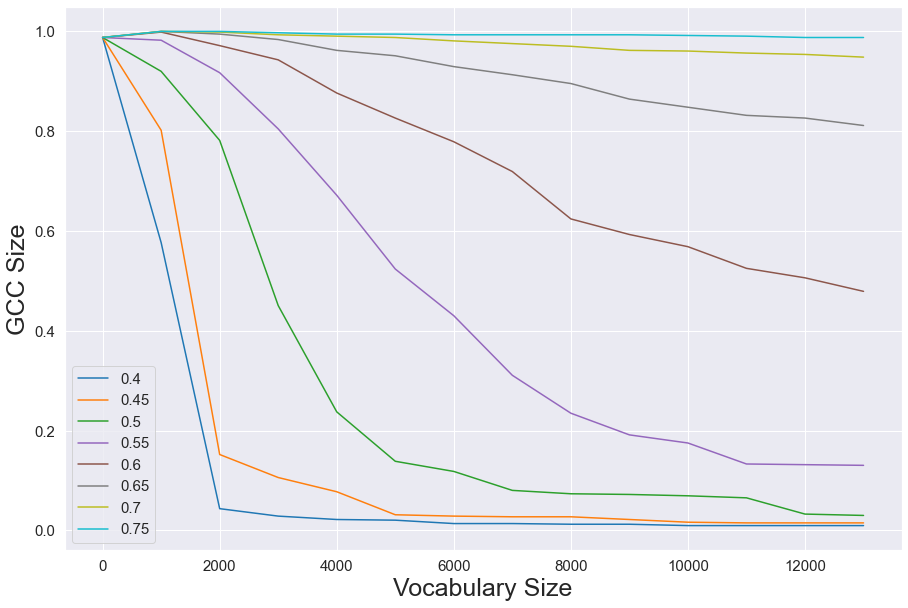

In [28]:
df['Threshold'] = df['Threshold'].round(2)
with sns.axes_style("darkgrid"):
    ax = sns.lineplot(x = 'Vocabulary size', y = 'GCC size', hue='Threshold', data=df, palette = plt.get_cmap('tab10'), legend='full')
    # plt.plot([0, max_voc_size], [1, 1], 'r--', label='GCC upper limit')
    plt.xlabel('Vocabulary Size', fontsize=label_font_size)
    plt.ylabel('GCC Size', fontsize=label_font_size)
    ax.tick_params(axis='both', which='major', labelsize=tick_font_size)
    # ax.labelsize(25)
    plt.legend(prop={'size': 15})
    plt.savefig(plot_output_folder / Path('GCC Threshold Vocab plot.png'));

Should make sure to think about what I was actually doing here. Generally just wanted to get an idea of how the GCC changes with vocabulary size. It seems fairly consistent that the GCC size isn't smooth, so we can pick an "elbow" somewhere to maximize the GCC size for a given vocabulary. The benefit of reducing the vocabulary is simply to reduce noise.

The main addition to the previous version is that my code is faster, and the improved list of stop words including the addition of "said" and "like". Things are generally quite similar but perhaps a bit more extreme. The major break points appear to be around 2000, and 5000. With some softer break points around 8000 and 11000. The main observation to make here is that we get the biggest changes with threshold between 0.6 and 0.5, while the changes outside that range have relatively little impact on the GCC. It's quite likely that larger communities in the GCC are being trimmed off in that range.

It would be nice to have an "average elbow", to calculate the shift in gradient averaged between the lines to help pick a vocabulary. A value around 8000 looks like a good tradeoff between the various thresholds.

In [29]:
def find_t(target, v, chapters = dresden, lower = 0, upper = 1, names = names):
    tfidf = tfidf_rep(v, chapters, index = names)
    # Check within upper and lower bound for p in GCC, calculating error from goal
    best_error = 1
    best_t = 1
    change_in_error = 1
    # Probably better to check if best error is changing rather than if it's small enough right?
    # Would be a sign of hitting the best possible result right
    while change_in_error > 0.01:
        print(f'Current target: {target}, Best t = {best_t:0.3f}, error = {best_error:0.3f}, next iteration upper: {upper:0.3f}, lower: {lower:0.3f}')
        errors = {}
        previous_best = best_error
        for t in np.linspace(lower, upper, 5):
            size = GCC_size(t, tfidf)
            p = size/len(chapters)
            
            errors[t] = p - target
        
        # Set new upper and lower bounds for next loop if error is too large
        pos_errors = {k : v for k, v in errors.items() if v > 0}
        upper = min(pos_errors, key=pos_errors.get)
        neg_errors = {k : v for k, v in errors.items() if v < 0}
        lower = max(neg_errors, key=neg_errors.get)
        
        # Get best so far and update best error
        abs_errors = {k : abs(v) for k, v in errors.items()}
        
        best_t = min(abs_errors, key=abs_errors.get)
        best_error = abs_errors[best_t]
        change_in_error = previous_best - best_error
    print(f'Target = {target}, Threshold = {best_t:0.3f}, Error = {best_error:0.3f}')
    return best_t

In [30]:
V = 11000
targets = [0.95, 0.75, 0.5, 0.3]
thresholds = {}
for target in targets:
    thresholds[target] = find_t(target, V)

Current target: 0.95, Best t = 1.000, error = 1.000, next iteration upper: 1.000, lower: 0.000
Current target: 0.95, Best t = 0.750, error = 0.041, next iteration upper: 0.750, lower: 0.500
Current target: 0.95, Best t = 0.688, error = 0.015, next iteration upper: 0.750, lower: 0.688
Target = 0.95, Threshold = 0.703, Error = 0.011
Current target: 0.75, Best t = 1.000, error = 1.000, next iteration upper: 1.000, lower: 0.000
Current target: 0.75, Best t = 0.750, error = 0.241, next iteration upper: 0.750, lower: 0.500
Current target: 0.75, Best t = 0.625, error = 0.024, next iteration upper: 0.688, lower: 0.625
Target = 0.75, Threshold = 0.625, Error = 0.024
Current target: 0.5, Best t = 1.000, error = 1.000, next iteration upper: 1.000, lower: 0.000
Current target: 0.5, Best t = 0.500, error = 0.435, next iteration upper: 0.750, lower: 0.500
Current target: 0.5, Best t = 0.625, error = 0.226, next iteration upper: 0.625, lower: 0.562
Current target: 0.5, Best t = 0.594, error = 0.020, 

Something interesting to point out, if we look at the thresholds for 75% and 50% GCC with this refined set of stopwords compared to the base set used previously. 75% went from a cutoff of 0.589 to 0.617. And 50% went from 0.552 to 0.587. Overall a higher cutoff seems to be required to prune the GCC size with the new stopwords. 

What does this imply about the change in network structure? An edge is formed with the condition cosine distance < cutoff. Meaning that a cutoff of 1 would always have everything connected, and a cutoff of 0 would have nothing connected. A higher cutoff is therefore more lenient, it will accept a weaker connection. This means that with the refined stop words, chapters are on average less similar. Which absolutely makes sense of course, with more words removed, there are less ways that chapters can be similar.

Regardless let's have a look at what the GCCs at each of these sizes looks like.

In [31]:
tfidf = tfidf_rep(V)

In [32]:
graphs = {}
for t in thresholds.keys():
    graphs[t] = nx.Graph(adj_matrix(thresholds[t], dist_matrix(tfidf)))

    # Add book attribute
    for node, book in zip(graphs[t].nodes(), ch_book):
            graphs[t].nodes[node]['book'] = book

In [33]:
def get_GCC(G):
    comp_gen = nx.connected_components(G)
    gcc = sorted(comp_gen, key=len, reverse=True)
    return G.subgraph(gcc[0])

In [34]:
GCCs = {}
positions = {}
for t, graph in graphs.items():
    GCCs[t] = get_GCC(graph)
    positions[t] = nx.spring_layout(graph, seed = 2000)

In [35]:
def graph_network_by_list(G, pos, ax = None, colour = None,
                          cmap = sns.color_palette("YlOrBr_r", as_cmap=True),
                          with_labels=True, label_by_attribute = None,
                          node_size = 50, font_size = 10, label_alpha = 0.5, edge_alpha=0.5):
    if colour == None: # Default highlighting is by book
        colour = list(nx.get_node_attributes(G, 'book').values())
    if pos == None:
            pos = nx.spring_layout(G, seed = 2000)
            
    nx.draw_networkx(G, ax=ax, pos=pos, node_color=colour, node_size = node_size, cmap=cmap, edgelist=[], with_labels=False)
    if with_labels:
        if label_by_attribute != None:
            labels = nx.get_node_attributes(G, label_by_attribute)
            nx.draw_networkx_labels(G, ax=ax, pos=pos, alpha=label_alpha, font_size=font_size, labels=labels)
        else:
            nx.draw_networkx_labels(G, ax=ax, pos=pos, alpha=label_alpha, font_size=font_size)

    nx.draw_networkx_edges(G, ax=ax, pos=pos, alpha=edge_alpha)

def plot_graph_dict(graph_dict, axes, graph_func, positions = None, colour = None, kwargs = {}):
    if positions == None:
        positions = [None] * len(graph_dict.keys())
    if colour == None:
        colour = [None] * len(graph_dict.keys())

    for graph, pos, ax, c in zip(graph_dict.items(), positions, axes.flatten(), colour):
        if pos == None:
            pos = nx.spring_layout(graph[1], seed = 2000)
        graph_func(graph[1], ax=ax, pos=pos, colour = c, **kwargs)
        ax.set_title(f'{graph[0]:.2f}', fontsize=20)
    plt.tight_layout()

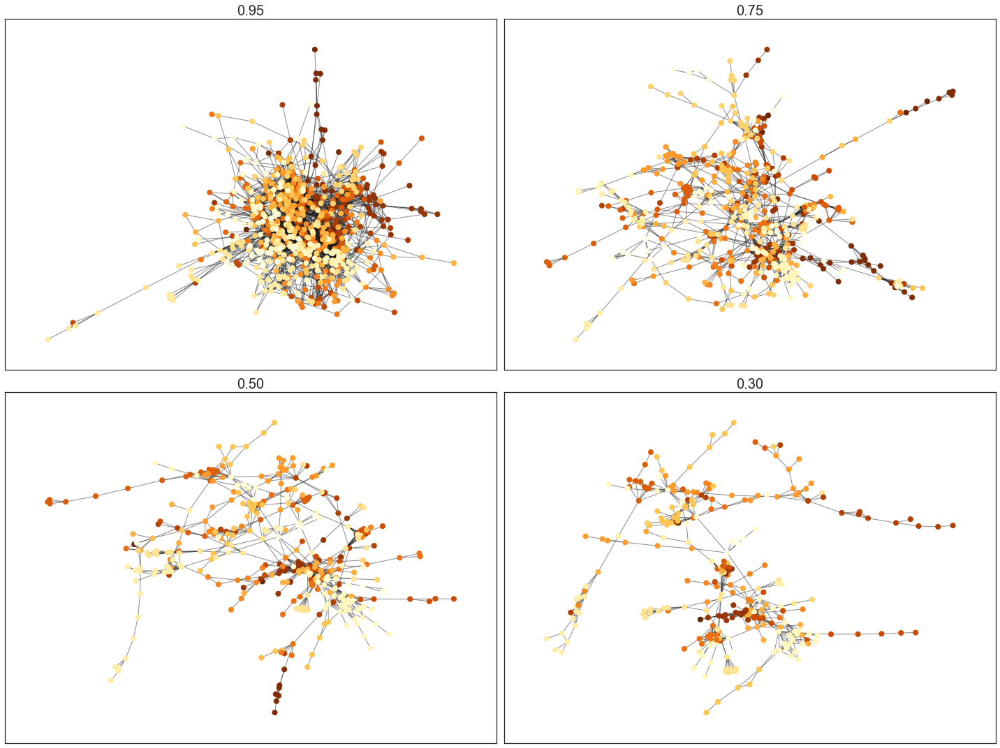

In [36]:
fig, axes = plt.subplots(2,2, figsize=(20,15))

kwargs = {'with_labels' : False}

plot_graph_dict(GCCs, axes, graph_network_by_list, positions.values(), kwargs=kwargs)

Wow some really cool structure in all the graphs pretty much.

A helper function I made later on in the notebook, since I ended up making this kind of output frequently.

In [37]:
def get_top_n_tfidf(chapters, n, with_score = False):
    # Kind of a lazy way to do this? probably would be better to build it up in sections but I'm just gathering disparite code here to clean things up
    if with_score:
        if type(chapters) == list:
            return tfidf.loc[chapters].mean().sort_values(ascending=False)[:n].round(2).reset_index().values.tolist()
        else:
            return tfidf.loc[chapters].sort_values()[-n:][::-1].round(2).reset_index().values.tolist()
    else:
        if type(chapters) == list:
            return tfidf.loc[chapters].mean().sort_values(ascending=False)[:n].index.to_list()
        else:
            return list(tfidf.loc[chapters].sort_values()[-n:][::-1].index)

# GCC size

So what's going on with nodes that are excluded from the GCC at various sizes?

In [38]:
def get_periphery(G):
    outcasts = G.copy()
    outcasts.remove_nodes_from(sorted(nx.connected_components(G), key=len, reverse=True)[0])
    return outcasts

In [39]:
outcasts = {}
for t, g in graphs.items():
    outcasts[t] = get_periphery(g)

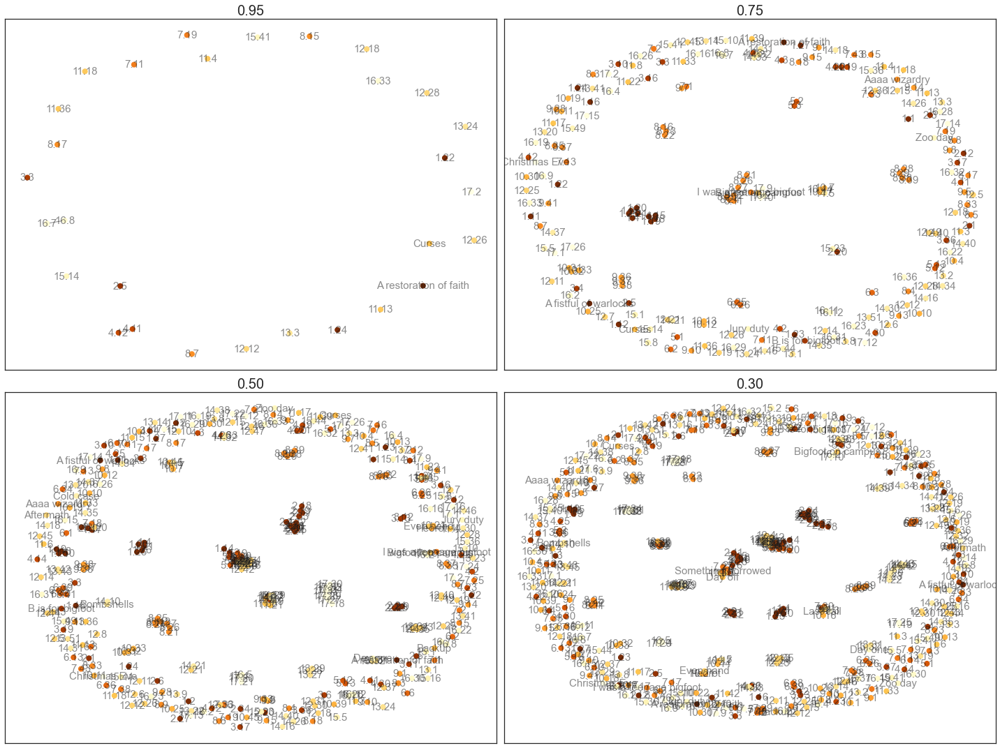

In [40]:
fig, axes = plt.subplots(2,2, figsize=(20,15))

outcast_kwargs = {'font_size' : 15}
save_graphs(outcasts, "periphery")

plot_graph_dict(outcasts, axes, graph_network_by_list, kwargs=outcast_kwargs)

This is about as we'd expect, at the larger network size almost all periphery nodes are isolated, while in the other sizes we start to see some smaller communities of nodes. Let's clean this up by only plotting components with more than 2 nodes:

In [41]:
for t, g in graphs.items():
    num_iso = nx.number_of_isolates(g)
    print(f'{t} has {num_iso} isolates, {(num_iso/len(dresden) * 100):0.2f}% of the entire corpus')

0.95 has 25 isolates, 3.39% of the entire corpus
0.75 has 131 isolates, 17.77% of the entire corpus
0.5 has 189 isolates, 25.64% of the entire corpus
0.3 has 238 isolates, 32.29% of the entire corpus


In [42]:
min_comp_size = 1
outcasts_pruned = {}
for t, g, in outcasts.items():
    outcasts_pruned[t] = g.subgraph([x for x in chain.from_iterable([comp for comp in sorted(nx.connected_components(g), key=len, reverse=True)
                                                                     if len(comp) > min_comp_size])])
save_graphs(outcasts_pruned, "Pruned periphery")

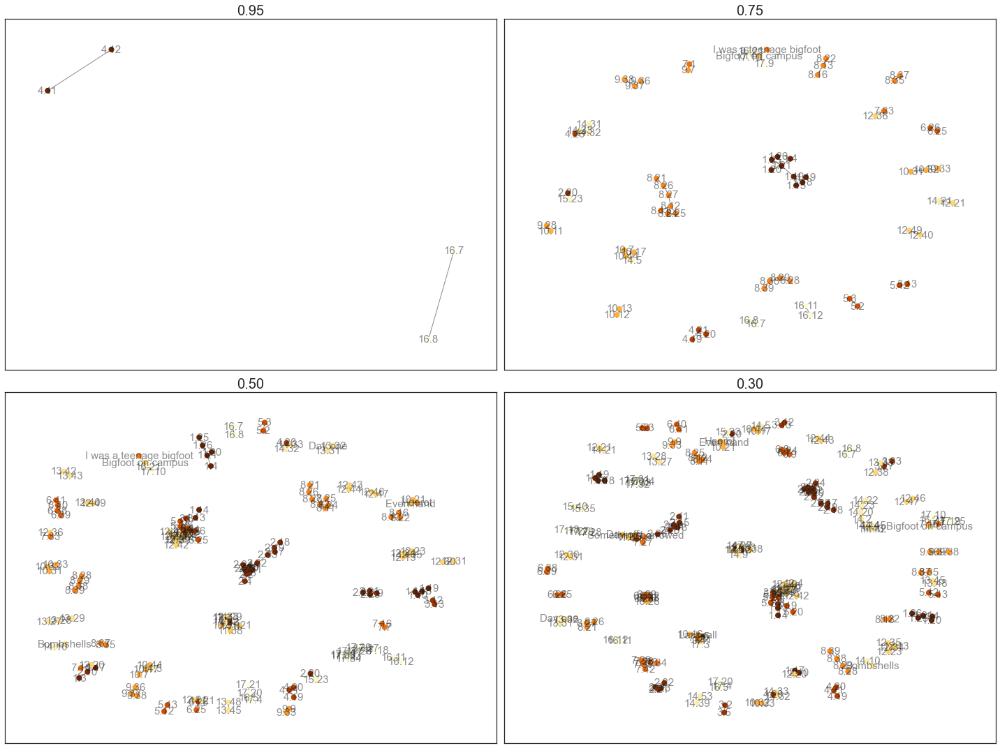

In [43]:
fig, axes = plt.subplots(2,2, figsize=(20,15))

plot_graph_dict(outcasts_pruned, axes, graph_network_by_list, kwargs=outcast_kwargs)

Something that jumps out to me here is that the majority of these small components are populated by single books. Two things that might be interesting to investigate jumping off from this:
* To try look at a single book to see how it's distributed between the GCC and periphery
* To look at components that seem to have a wide distribution of books

Let's have a look at that first idea, I'll first look at how each book is distributed:

---

Let's dive into how chapters are distributed between the periphery and GCC at our arbitrary GCC sizes:

In [44]:
def plot_GCCvPer_by_book(per_nodes, ax = None, graph_name = 'GCC', print_terms=False):
    plot_data = pd.DataFrame(ch_book, columns=['Book'], index = names)
    plot_data['GCC'] = True
    plot_data.loc[per_nodes, 'GCC'] = False
    
    # Drop chapters from side stories
    plot_data = plot_data[plot_data['Book'] % 1 != 0.5]
    plot_data = plot_data[plot_data['Book'] != 0]
    
    plot_data['Periphery'] = ~plot_data['GCC']
    plot_data = plot_data[plot_data['Book'] % 1 != 0.5]
    
    plot_data_grouped = plot_data.groupby('Book').sum()
    
    (plot_data_grouped.T/plot_data_grouped.T.sum()).T.plot.barh(stacked=True, ax=ax, width=1)
    plt.xlim(0,1)
    
    if print_terms:
        n = 3
        for index, book in enumerate(plot_data_grouped.index):
            chapters = list(plot_data[plot_data['Book'] == book].index)
            ax.annotate(', '.join([str(terms) for sublist in get_top_n_tfidf(chapters, n, True) for terms in sublist]), fontsize=15, c = 'white',
                        xy = (0.01, index),
                        xycoords='data',
                        rotation=0,
                        ha='left',
                        va='center')

    if ax == None:
        plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.965))
        plt.xlabel(graph_name)
    else:
        ax.get_legend().remove()
        ax.set_title(f'{graph_name} size', fontsize=15)
        ax.set_ylabel(" ")
        ax.set_yticklabels(range(1,18))
        ax.tick_params(axis='both', which='major', labelsize=tick_font_size)

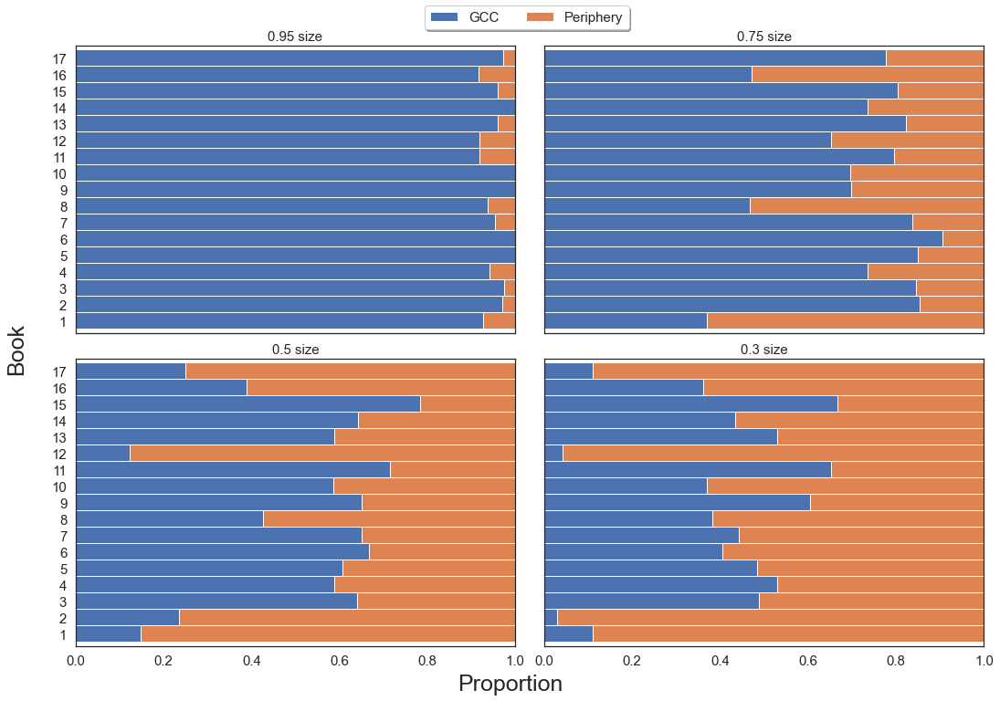

In [45]:
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

for t, ax in zip(thresholds.keys(), axes.flatten()):
    plot_GCCvPer_by_book(get_periphery(graphs[t]), ax, t)
# ax.legend(loc='center left', bbox_to_anchor=(1, 2.1));
fig.text(0.5, -0.01, 'Proportion', ha='center', va='center', fontsize=label_font_size)
fig.text(0, 0.5, 'Book', ha='center', va='center', rotation='vertical', fontsize=label_font_size)
plt.tight_layout()
ax.legend(loc='upper center', bbox_to_anchor=(-0.04, 2.25), ncol=2, fancybox=True, shadow=True, prop={'size': 15})
# fig.suptitle("Distribution of books between GCC and Periphery", fontsize=40, y=1.1)
plt.savefig(plot_output_folder / Path(f'book dist.png'), bbox_inches='tight')

Now this looks really interesting. Obviously at the larger sizes there is almost nothing to be gleamed. But even as high as 0.75, there are certain books that have a significantly higher proportion of books outside the GCC compared to the average.

I'd say we can comfortably categorize books as "GCC centric" or "Periphery centric" at various GCC size. For the "GCC centric" books, they all have a relatively similar proportion of chapters in the GCC, even with significant pruning. Additionally If you directly compare the 0.5 and 0.3 sizes, The majority of GCC centric books actually have almost no change at all. It looks that chapters are actually pruned on a "per book" basis rather than uniformly. And this makes sense, chapters within the same book will all be very similar.

Looking at this output it's very clear that certain books are distinctly dissimilar to the core of the network. These books being book 1, 2, 12, and 17.

For books 1 and 2, this is not at all surprising. The series is still trying to find its feet, and many major characters are yet to be introduced. It's much more interesting to look at books 12 and 17:

In [46]:
print(novels[12-1])
print(novels[17 - 1])

Changes
Battle Ground


So book 12 "Changes" existing outside the GCC is actually really interesting and honestly a bit shocking. This is a pretty major book in the series, as the title suggests, this book marks a dramatic change in the series overall, with long lasting consequences for pretty much all characters in the series. You can therefore see why it's shocking that it's not a core part of the GCC, linking entire books together.

Although perhaps thinking about book 17 might help find some explanations, before that however, I think It would be good to focus in on a single graph here, and look at the top average terms for each book. As a way to succinctly identify some of the most consistently important terms.

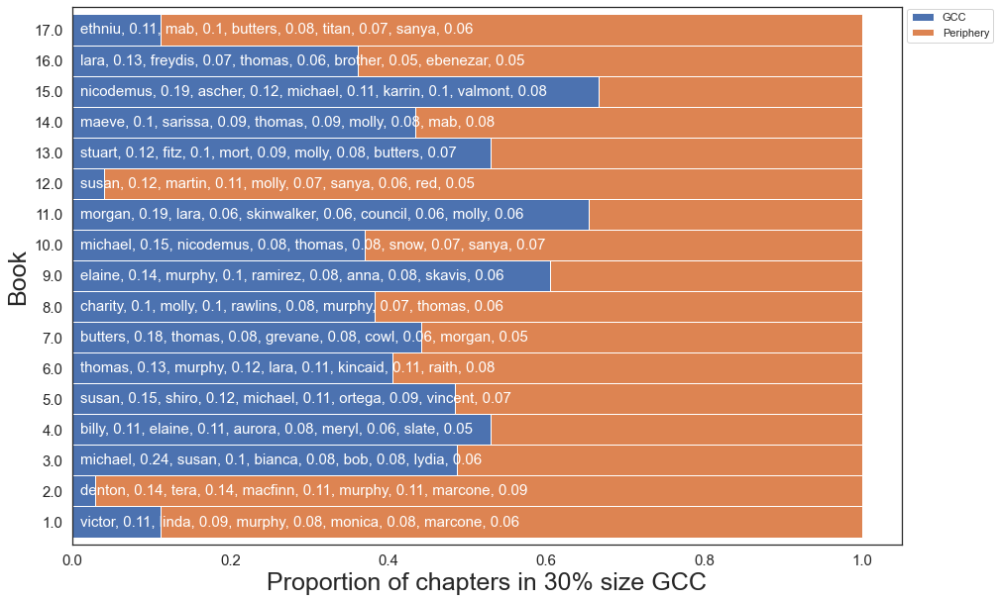

In [47]:
plot_data = pd.DataFrame(ch_book, columns=['Book'], index = names)
plot_data['GCC'] = True
plot_data.loc[get_periphery(graphs[0.3]), 'GCC'] = False

# Drop chapters from side stories
plot_data = plot_data[plot_data['Book'] % 1 != 0.5]
plot_data = plot_data[plot_data['Book'] != 0]

plot_data['Periphery'] = ~plot_data['GCC']
plot_data = plot_data[plot_data['Book'] % 1 != 0.5]

plot_data_grouped = plot_data.groupby('Book').sum()

ax = (plot_data_grouped.T/plot_data_grouped.T.sum()).T.plot.barh(stacked=True, width = 1)

n = 5
for index, book in enumerate(plot_data_grouped.index):
    chapters = list(plot_data[plot_data['Book'] == book].index)
    ax.annotate(', '.join([str(terms) for sublist in get_top_n_tfidf(chapters, n, True) for terms in sublist]), fontsize=15, c = 'white',
                xy = (0.01, index),
                xycoords='data',
                rotation=0,
                ha='left',
                va='center')

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.965))
ax.set_xlabel(f'Proportion of chapters in 30% size GCC');

Oh this helps a lot actually. First of all for the chapters within the GCC I do need to consider things with a grain of salt as about half of the chapters in each book are absent from the GCC, and these are the top mean tfidf terms. But for the books outside the GCC this is far less of a concern.

And for the periphery books, there's a very clear trend! For books 1, 2, and 17. The top average term is a one off character. And for book 12 it is a major character, but they were only present in the early books as a relatively minor side character. While in this book they take center stage throughout the entire adventure, and are more or less gone from the series afterwards. Considering the trend of characters being the primary driving force of relations, this makes for an excellent and very understandable explanation for why book 12 would be absent.

It's harder to make comments about the other books here, they do almost exclusively feature primary reoccurring characters as the top term, but there are at least three exceptions to this.

I think it'd be interesting to try push this idea even further, what happens as we lower the GCC size even further? Which books will be next to go?

Another novel observation to make here is about the average top terms for each book. They have done an excellent job of summarizing the major characters of a book. Infact, this would require a bit more double checking, but it appears that the top term for each book is either a "novel" side character, or the antagonist of the book. I note "novel" side character as the most frequent side characters that appear in most books are _not_ the top terms. Instead the characters that have a more uniquely major role in each book seem to be present.

Let's try zoom in on some individual books though, to see how things break down on a per chapter basis. Something that jumped out to me is that in the 75% size, notice that book 8 is almost half periphery. But moving all the way down to the 30% size, there's almost no change. I would assume that perhaps a large chunk of this particular book is distinct from the main core of the network, while the other half is firmly within that core. Let's take a look:

In [48]:
def plot_GCC_v_Periphery(book, figsize, GCC_size = 0.75):
    plot_data = pd.DataFrame(ch_book, columns=['Book'], index = names)
    plot_data['GCC'] = True
    plot_data.loc[list(outcasts[GCC_size].nodes), 'GCC'] = False
    
    plot_data = plot_data[plot_data['Book'] == book]
    plot_data['Periphery'] = ~plot_data['GCC']
    
    ax = plot_data[['GCC', 'Periphery']].astype('int').plot.barh(stacked=True, figsize=figsize, width=1)
    n = 5
    for index, chapter in enumerate(plot_data.index):
        ax.annotate(', '.join([str(terms) for sublist in get_top_n_tfidf(chapter, n, True) for terms in sublist]), fontsize=15, c = 'white',
                    xy = (0.01, index),
                    xycoords='data',
                    rotation=0,
                    ha='left',
                    va='center')
    ax.invert_yaxis()
        
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=2, fancybox=True, shadow=True, prop={'size': 15})
    plt.xlim([0, 1])
    ax.tick_params(axis='both', which='major', labelsize=15)
    plt.xticks([], [])
    ax.set_ylabel('Chapter', fontsize=20)
    # plt.title(f'Book {book}, {GCC_size}% size GCC', fontsize=30, y = 1.02);

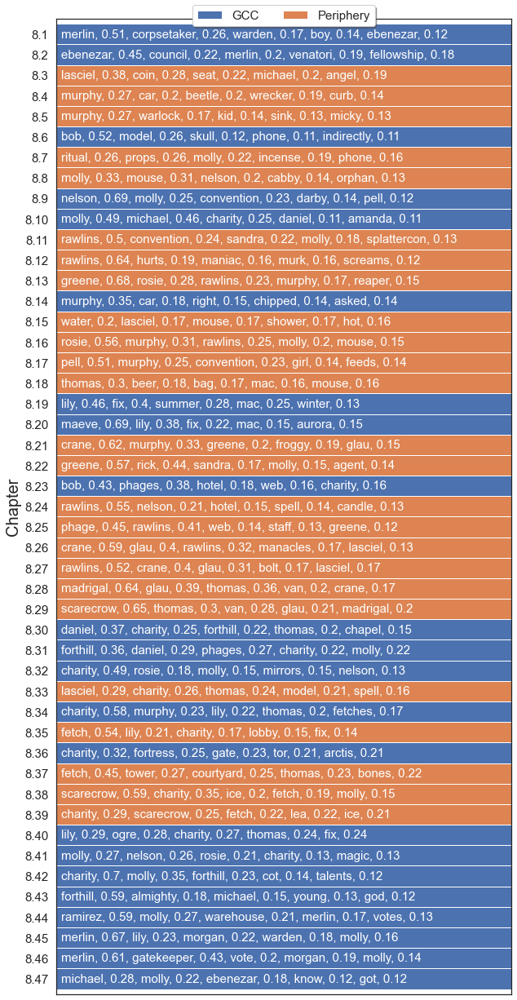

In [49]:
plot_GCC_v_Periphery(8, (10,22), GCC_size = 0.75)
plt.savefig(plot_output_folder / Path(f'ch dist book 8.png'), bbox_inches='tight')

It's difficult to spot any trends in the periphery chapters, A large number feature a one-off character as the most prominent term however there are quite a few exceptions to this. However looking at it from the opposite angle, there is only a single chapter in the GCC that does not feature a reoccurring character as the primary term. Chapter 9, if we take a look at the nodes this chapter is connected to:

In [50]:
for ch in list(graphs[0.75].edges('8.9'))[0]:
    print(ch, get_top_n_tfidf(ch, 5, True))

8.9 [['nelson', 0.69], ['molly', 0.25], ['convention', 0.23], ['darby', 0.14], ['pell', 0.12]]
8.41 [['molly', 0.27], ['nelson', 0.26], ['rosie', 0.21], ['charity', 0.13], ['magic', 0.13]]


It becomes very clear that the strong presence of a main character "Molly" was enough similarity to forge an edge to the GCC.

So it looks like the periphery chapters tend to feature more minor characters as a central focus. But how does this compare at different GCC sizes? I would hypothesize that as we shrink the GCC we should only keep the most important characters, if we look at the same output for the 30% size GCC:

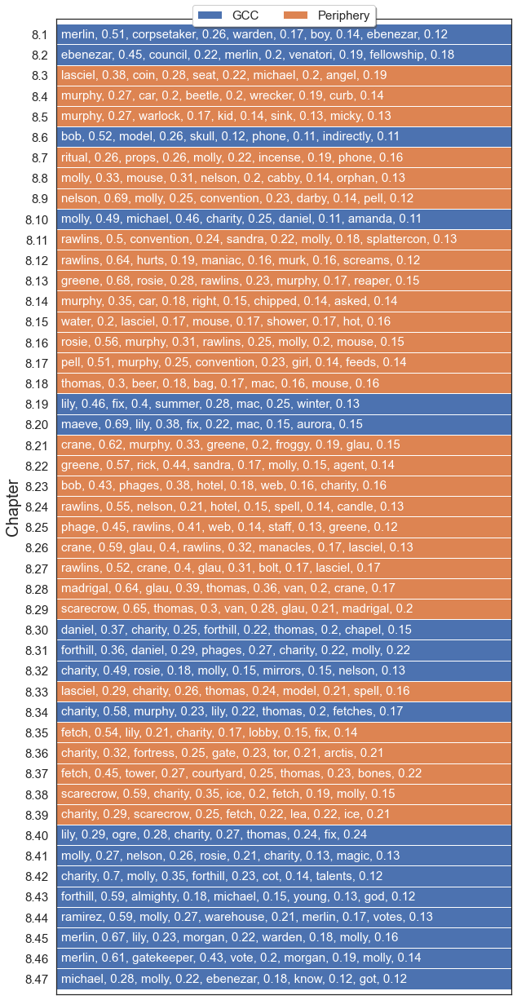

In [51]:
plot_GCC_v_Periphery(8, (10,22), 0.3)

---

Alright what do the other two books with a notable amount of periphery chapters from the 75% size look like?

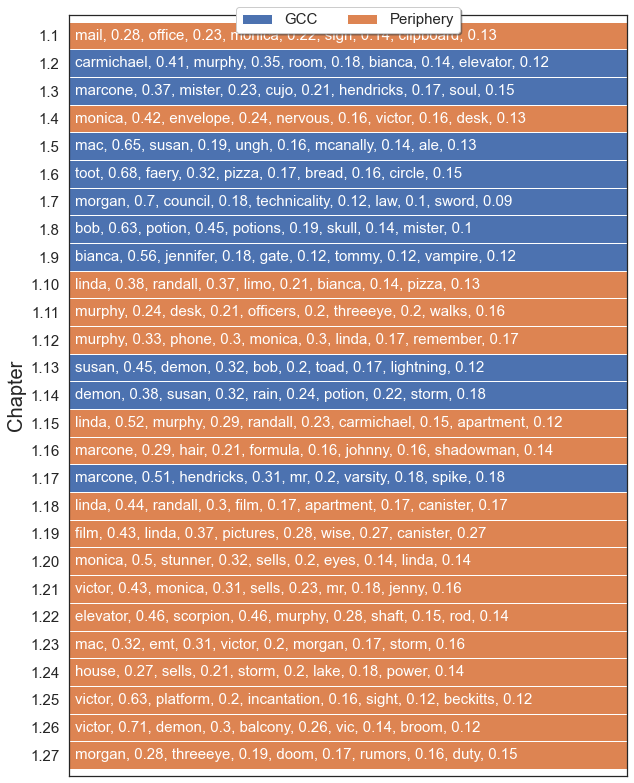

In [52]:
plot_GCC_v_Periphery(1, (10,14))

Oh wow, almost the entire second half of the book. This does support the cursory observations from book 8, where the chapters in the GCC tend to feature reoccurring characters as the primary term. This might be a good time to point out another observation of mine, that these chapters look to be in congruent "blocks", with few breaks between. It seems likely that many of these blocks would form their own components, and we actually have some evidence of that looking back at the plot of periphery chapters:

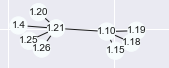

While this little component isn't precisely a continuous block of chapters, there are many chapters here that are adjacent. Let's look at the last notable book:

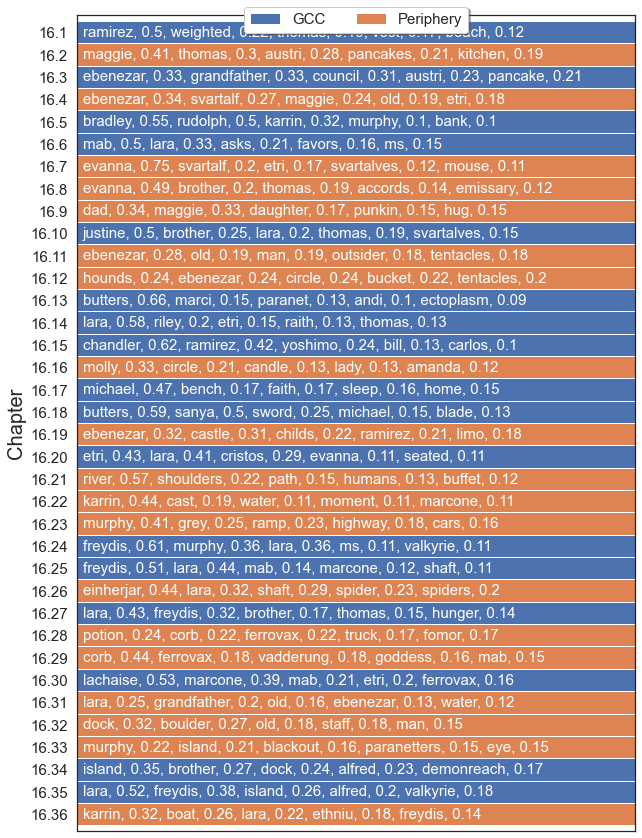

In [53]:
plot_GCC_v_Periphery(16, (10, 15))

So this is one of the more recent books and it features a lot of new characters or characters that were previously not very prevalent. Looking at the top terms for chapters in the periphery here, most of them aren't too surprising. Something that's quite interesting to me here are the chapters featuring "ebenezar". He is a long term character that never got too much focus in previous books, with a significantly larger presence in this bnook. A number of the chapters in the periphery here seem to feature him prominently, it's surprising that they aren't actually connected to the GCC.

---
Moving forward however, let's restrict ourselves to the GCC.

# Centralities

In [54]:
# Check if final chapter of respective book
def is_final(chapter):
    try:
        book, chap = [int(result) for result in chapter.split('.')]
        if book == 17 and chap == 36: # Quick lazy fix for an oversight in my initial processing
            return True
    except ValueError:
        return False
    return docs[book][-1] == docs[book][chap-1]

In [55]:
blank_node_dict = {node : 0 for node in graphs[0.95].nodes}
def print_top_n_centrality(centrality_measure, n, k, graph_dict, extra_func = None, extra_measure_params = None, output_latex=False):
    # Building a dict of all scores
    chapter_scores = {t : blank_node_dict.copy() for t in thresholds}
    top_chapter_scores = []
    for G, scores in zip(graph_dict.values(), chapter_scores.values()):
        if extra_measure_params != None:
            g_scores = sorted(centrality_measure(G, **extra_measure_params).items(), key = lambda item: item[1], reverse=True)
        else:
            g_scores = sorted(centrality_measure(G).items(), key = lambda item: item[1], reverse=True)
        for ch, score in g_scores:
            scores[ch] = score
        
        # Getting the top n for each graph
        top_chapter_scores.append(sorted(scores.items(), key = lambda item: item[1], reverse=True)[:n])
    # Convert top n to array for easier slicing
    top_chapter_scores = np.array(top_chapter_scores)
    
    # Get count of each chapter in all other top ns
    ch, count = np.unique(top_chapter_scores[:,:,0], return_counts=True)
    ch_count = {chap : c for chap, c in zip(ch, count)}
    # Get average score across all graphs, if node isn't present in all graphs it's been treated as a score of 0
    # Not ideal but eh
    ch_averages = {}
    for ch in ch_count.keys():
        ch_averages[ch] = np.mean([s[ch] for s in chapter_scores.values()])
    
    for t, ch_score in zip(graph_dict.keys(), top_chapter_scores):
        plot_data = pd.DataFrame(ch_score, columns=['Chapter', 'Score'])
        plot_data['Score'] = plot_data['Score'].astype(float)
        plot_data['Count'] = [ch_count[ch] for ch in ch_score[:,0]]
        plot_data[f'Top {k} terms'] = [str(get_top_n_tfidf(chapter, k)) for chapter in ch_score[:,0]]
        
        plot_data.set_index('Chapter', inplace=True)
        # rearrange cols
        plot_data = plot_data[[f'Top {k} terms', 'Score', 'Count']]
        
        if extra_func != None:
            for func in extra_func:
                plot_data[func[0]] = func[1](ch_score[:,0], t)
        output = (plot_data
                .style
                .background_gradient(cmap=sns.light_palette("green", as_cmap=True))
                .format({'Score' : '{:0.3f}'})
                .set_caption(f'{t} size GCC'))
        display(output)
        if output_latex:
            print(output.to_latex(convert_css=True))

### Degree

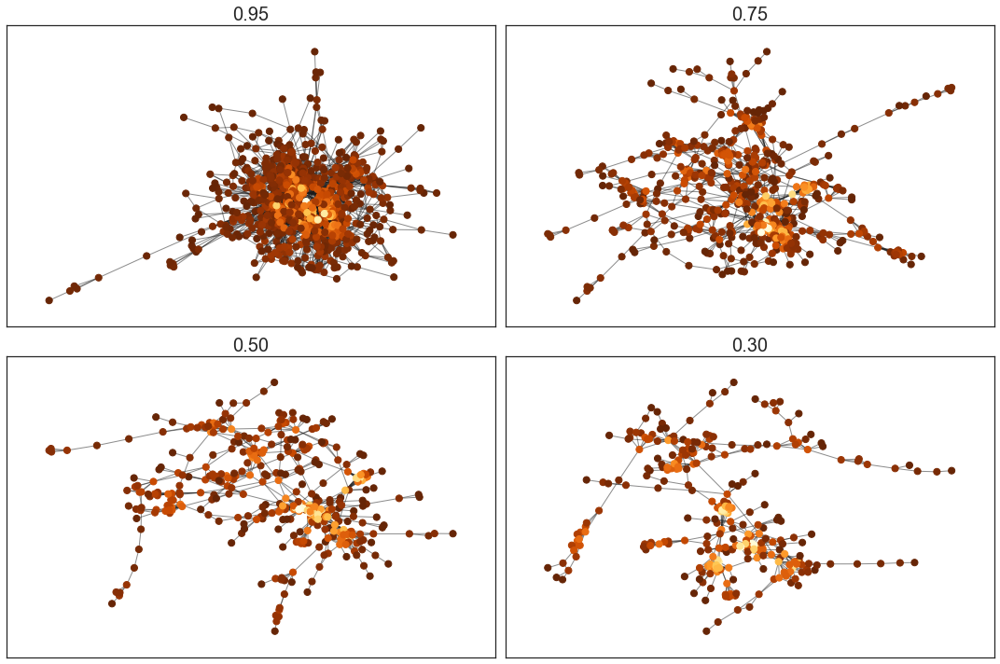

In [56]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

degree_centralities = [list(nx.degree_centrality(g).values()) for g in GCCs.values()]
# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(GCCs.values(), degree_centralities):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'Degree')

plot_graph_dict(GCCs, axes, graph_network_by_list, positions.values(), degree_centralities, kwargs=kwargs)

Visually inspecting the graphs highlighted by degree, it's hard to make any precise analysis except that all the high scoring nodes seem to be central to clusters of nodes. This does highlight that for the smaller size GCCs we seem to have more distinct clusters of nodes compared to the larger GCCs. It may be more illustrative of what degree reveals and how different GCC sizes differ to look at the top "n" chapters, their most popular terms, their score for a given size, their average score for all sizes, and how many of the top "n" they appear in:

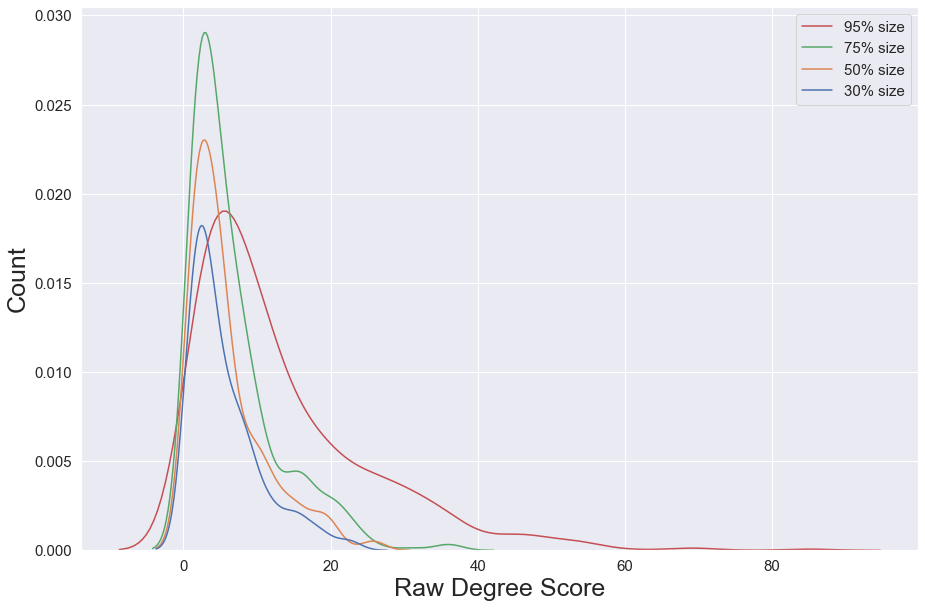

In [57]:
raw_degree_centralities = []
for scores in degree_centralities:
    raw_degree_centralities.append([s * (len(scores) - 1)  for s in scores])
    
with sns.axes_style("darkgrid"):
    ax = sns.kdeplot(data = pd.DataFrame(raw_degree_centralities, index = thresholds.keys()).T)
    ax.tick_params(axis='both', which='major', labelsize=tick_font_size)
    ax.set_ylabel('Count', fontsize=label_font_size)
    ax.set_xlabel('Raw Degree Score', fontsize=label_font_size)
    plt.legend(['95% size', '75% size', '50% size', '30% size'],prop={'size': 15})
    plt.savefig(plot_output_folder / Path(f'degree dist.png'), bbox_inches='tight')

In [58]:
print_top_n_centrality(nx.degree_centrality, 5, 3, GCCs, output_latex=False)

,Top 3 terms,Score,Count
Chapter,,,
8.47,"['michael', 'molly', 'ebenezar']",0.120,1
15.51,"['michael', 'marcone', 'molly']",0.099,1
The warrior,"['michael', 'forthill', 'alicia']",0.096,4
17.36,"['mab', 'lara', 'marcone']",0.082,1
15.20,"['michael', 'know', 'nicodemus']",0.078,4


,Top 3 terms,Score,Count
Chapter,,,
The warrior,"['michael', 'forthill', 'alicia']",0.069,4
15.20,"['michael', 'know', 'nicodemus']",0.067,4
10.38,"['michael', 'sword', 'coin']",0.066,3
3.31,"['michael', 'thomas', 'lydia']",0.058,3
13.17,"['bob', 'butters', 'epic']",0.051,1


,Top 3 terms,Score,Count
Chapter,,,
3.31,"['michael', 'thomas', 'lydia']",0.068,3
15.20,"['michael', 'know', 'nicodemus']",0.068,4
The warrior,"['michael', 'forthill', 'alicia']",0.068,4
10.38,"['michael', 'sword', 'coin']",0.065,3
3.26,"['michael', 'cigarette', 'wine']",0.055,1


,Top 3 terms,Score,Count
Chapter,,,
3.31,"['michael', 'thomas', 'lydia']",0.079,3
The warrior,"['michael', 'forthill', 'alicia']",0.079,4
10.38,"['michael', 'sword', 'coin']",0.075,3
15.20,"['michael', 'know', 'nicodemus']",0.075,4
14.27,"['butters', 'thomas', 'karrin']",0.068,1


Each column is respectively, the top k tfidf terms for the chapter. The centrality score, and the number of times this chapter appears in the top n for each size of GCC I'm looking at.

Considering that typically, degree would capture "Celebrities". Individual nodes with many connections. Looking at all the chapters represented here, the vast majority feature "Michael" as the most significant individual term. For context, Michael is one of the most central reoccurring side characters from the series. Typically He will be accompanying the main character for the majority of his journey in the books that he appears in (roughly every second or third book). Perhaps this is an analogue for a "Celebrity"? Chapters that feature a "Celebrity" character.

Things look very consistent across thresholds, excluding the 95% size, things are more or less identical. Thinking about what we saw previously when looking at periphery chapters, that entire books tend to be culled instead of a consistent decrease across the entire corpus. It seems likely that the collection of chapters featuring Michael make up the core of the network.

This might be because, the storylines that tend to feature Michael are a bit more homogeneous with a smaller cast of characters. In general there are two or three side characters that serve as "guest side kicks" across the books. Anecdotally for Michael, he tends to line up against a consistent cast of villains and plot themes, while the other main "side kick" (Karrin Murphy) features in a more diverse range of situations.

As far as anything unique to the individual chapters that scored well both of them primarily feature the character "Michael", where "The warrior" is a short story that gives us a deeper look at his day to day life, and "15.20" is an introspective conversation about faith and morality between Michael and the main character. I note the tone of the conversation because similar themes show up during "The warrior" and outside of both chapters featuring Michael this is the primary link I can think of between them. I'll try having a look at more of the top terms for these chapters to see if there's anything to support these ideas or other clues for why they might be so well connected:

In [59]:
get_top_n_tfidf('15.20', 15, True)

[['michael', 0.64],
 ['know', 0.13],
 ['nicodemus', 0.12],
 ['maggie', 0.11],
 ['arm', 0.11],
 ['molly', 0.11],
 ['harry', 0.1],
 ['pushes', 0.1],
 ['failed', 0.09],
 ['beer', 0.09],
 ['mab', 0.08],
 ['asked', 0.07],
 ['susan', 0.07],
 ['think', 0.07],
 ['right', 0.07]]

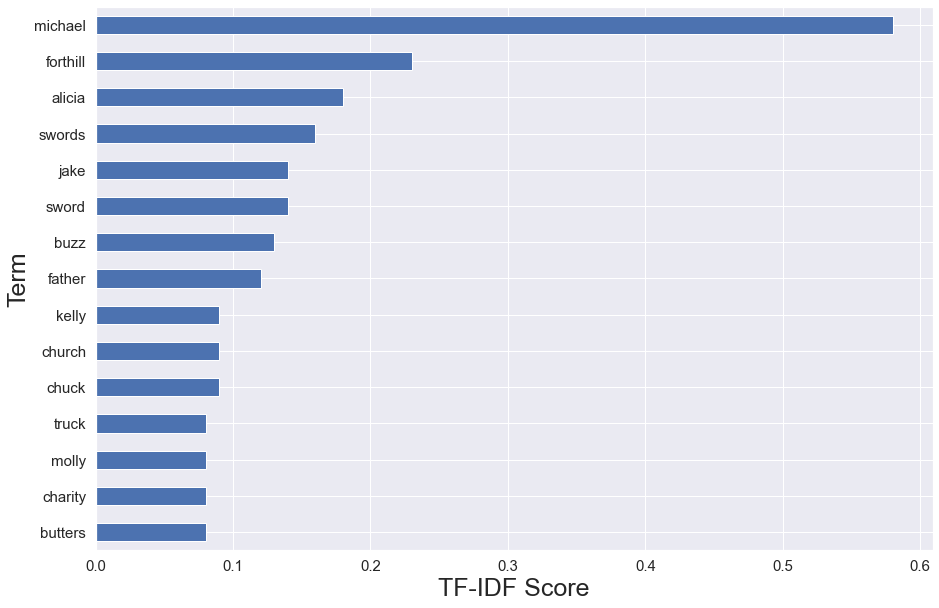

In [60]:
with sns.axes_style("darkgrid"):
    pd.DataFrame(get_top_n_tfidf('The warrior', 15, True), columns=['Term', 'TF-IDF Score']).set_index('Term').plot.barh()
    plt.gca().set_xlabel('TF-IDF Score')
    plt.gca().invert_yaxis()
    plt.gca().legend().remove()
    plt.savefig(plot_output_folder / Path(f'the warrior top 15 terms.png'), bbox_inches='tight')

Oh I've just had quite an interesting realization about "The warrior" that lines up with my previous ideas that "characters" are the driving force of connections. Note "sword" as a top score. While "The warrior" focuses primarily on giving us a deeper look at Michael, the main conflict in the story is that an antagonist is trying to get the "Holy swords". In the series swords are fairly rare, they typically the only swords that consistently show up are these "Holy swords". While not explicitly characters, They are similar to characters in that they are effectively "Proper nouns". This could forge a stronger connection between "The warrior" and other chapters that heavily feature the swords where Michael is absent, boosting the degree score overall for "The warrior"

This really distills the idea that rather than "Characters" being the unique identifier of chapters, it's instead "Proper nouns", and that perhaps instead this series is just a particularly character centric series overall.

As far as "15.20", rather than my idea of the themes of faith and morality, it looks more likely to be because many other characters are frequently mentioned. Although we do still see terms like "failed", "think", and "right" scoring decently well so there may be some merit to my observation.

---

# Tangent looking at Average TFIDF, should try fit into thesis somewhere?

Considering how prominent Michael is for degree, I think it could be interesting to look at how prominent michael is in chapters he appears in. By taking the average of chapters with a tfidf score > 0 for Michael

In [61]:
(tfidf['michael'] != 0).sum()

156

In [62]:
tfidf[tfidf['michael'] != 0]['michael'].mean()

0.18915873938105932

This looks like quite a strong average score, anecdotally from looking at individual chapters, this looks like a would typically be in the top 3 or so terms for a chapter. Although it would be good to compare this to some other characters.

In [63]:
for name in ['michael', 'molly', 'murphy', 'karrin', 'thomas', 'sanya', 'knight', 'shiro', 'nicodemus', 'harry', 'dresden']:
    print(f'{name} appears in {(tfidf[name] != 0).sum()} chapters with an average TFIDF in those chapters of {tfidf[tfidf[name] != 0][name].mean():0.3f}')

michael appears in 156 chapters with an average TFIDF in those chapters of 0.189
molly appears in 225 chapters with an average TFIDF in those chapters of 0.121
murphy appears in 354 chapters with an average TFIDF in those chapters of 0.108
karrin appears in 128 chapters with an average TFIDF in those chapters of 0.091
thomas appears in 224 chapters with an average TFIDF in those chapters of 0.142
sanya appears in 65 chapters with an average TFIDF in those chapters of 0.163
knight appears in 224 chapters with an average TFIDF in those chapters of 0.035
shiro appears in 29 chapters with an average TFIDF in those chapters of 0.157
nicodemus appears in 94 chapters with an average TFIDF in those chapters of 0.170
harry appears in 601 chapters with an average TFIDF in those chapters of 0.033
dresden appears in 508 chapters with an average TFIDF in those chapters of 0.027


These results actually highlight a few interesting things that the TFIDF scores have captured. First of all molly and murphy are both about as important as Michael, But their average scores are quite a bit worse. They're also in quite a few more chapters compared to him. I would suspect this is because when Michael appears, he's usually a primary character to the current plot. He effectively fits into his own "sub-culture" within the narrative of the series. With a particular subset of allies and enemies. And of course as the link between the protagonist and this extended collection of characters, he is the most prominent of them. This can be seen by looking at the scores for sanya, knight, shiro, and nicodemus. Also of note is that the only other score here competitive with michael is "nicodemus", who is the primary antagonist of this subset of characters.

I believe this is what differentiates him from the other primary characters like Murphy and Molly. Both of them tend to be more supportive of the main character, and have connections formed in the narrative through him. These connections to many other characters seems to translate into a strong position within the network.

It's also interesting to point out how poor the average scores are for our literal main character "Harry Dresden". This is likely because the series is in first person, so his name will only come up when other characters address him. His name would also be very common, and therefore penalized by TFIDF.

I'd like to have a look at the top n "average TFIDF > 0" in general while I'm on this idea

In [64]:
avg_prom = []
n_name_count = []
for name in tfidf.columns:
    avg_prom.append((tfidf[name] != 0).sum())
    n_name_count.append(tfidf[tfidf[name] != 0][name].mean())

In [65]:
avg_tfidf = pd.DataFrame(zip(tfidf.columns, avg_prom, n_name_count), columns=['name', 'count', 'score']).sort_values(by='score', ascending=False)
avg_tfidf[:10]

,name,count,score
3617,fitz,12,0.438738
1105,bradley,6,0.366739
9115,stan,5,0.339419
6742,parker,8,0.339262
9911,tilly,8,0.329633
685,barge,7,0.308440
5810,madge,5,0.297398
1600,chlorofiend,5,0.278960
4233,greene,6,0.275475
8423,shiela,7,0.269862


oh I suppose it shouldn't be too surprising that all these have a very small number of appearances. Let's try condition on at least 50 appearances:

In [66]:
avg_tfidf.query('count > 50')[:10]

,name,count,score
1287,butters,121,0.198917
6045,michael,156,0.189159
6185,morgan,78,0.188251
5454,lara,96,0.174818
6393,nicodemus,94,0.169949
5337,kincaid,52,0.167923
1010,bob,134,0.164359
8083,sanya,65,0.162557
5799,mac,54,0.150025
9511,susan,129,0.145811


Oh that's very interesting, Michael is behind Butters. That does make sense, as Butters tends to be the focus of a scene when he does appear. He was quite rare for the majority of the series but he's started to shift into a more major role in the most recent books. In fact he's actually falling into a somewhat similar role to Michael.

As for the other character here, they're all distinct reoccurring characters within the series. I tried experimenting with building a network of characters at one point, I'm starting to wonder if using TFIDF scores with these conditions would actually work as an excellent proxy for building a list of character names. If I try looking at the top 50 names:

In [67]:
avg_tfidf.query('count > 50').reset_index(drop=True)[:50]

,name,count,score
0,butters,121,0.198917
1,michael,156,0.189159
2,morgan,78,0.188251
3,lara,96,0.174818
4,nicodemus,94,0.169949
5,kincaid,52,0.167923
6,bob,134,0.164359
7,sanya,65,0.162557
8,mac,54,0.150025
9,susan,129,0.145811


Certainly not a foolproof method, Although the vast majority of terms here are characters or proper nouns.

### Closeness

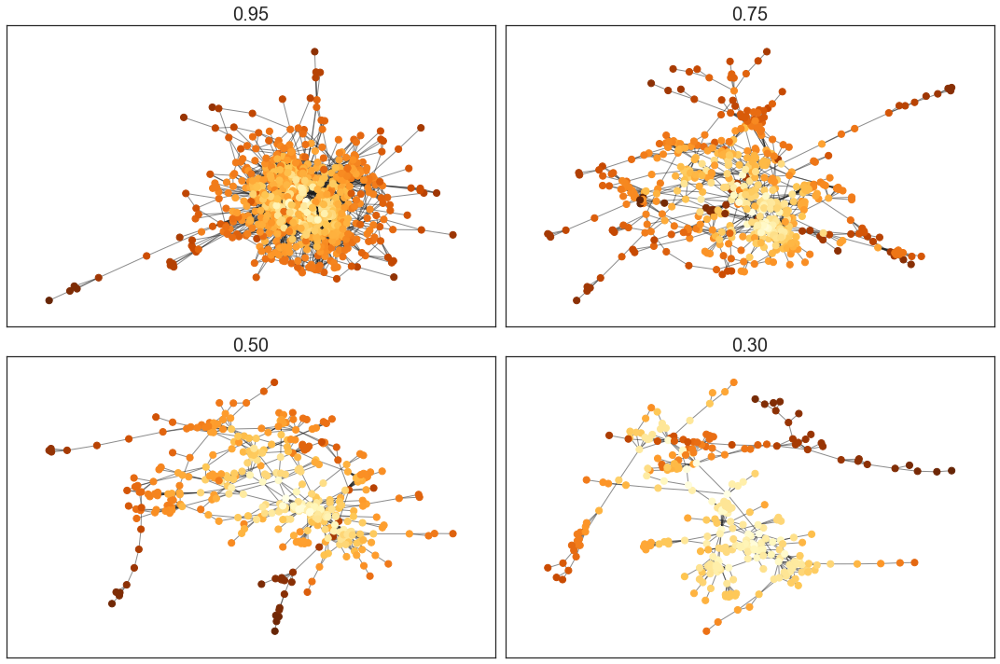

In [68]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

closeness_centralities = [list(nx.closeness_centrality(g).values()) for g in GCCs.values()]
# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(GCCs.values(), closeness_centralities):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'Closeness')

plot_graph_dict(GCCs, axes, graph_network_by_list, positions.values(), closeness_centralities, kwargs=kwargs)

We can pretty quickly see the difference between Closeness and Degree, While degree captured individual nodes that have many connections, closeness is capturing "proximity to center" much more effectively. his is very obvious in the larger GCCs where we see a very gentle gradient as the scores slowly ramp up closer towards the center of the network.

In [69]:
print_top_n_centrality(nx.closeness_centrality, 5, 3, GCCs)

,Top 3 terms,Score,Count
Chapter,,,
8.47,"['michael', 'molly', 'ebenezar']",0.413,3
9.43,"['marcone', 'helen', 'thomas']",0.396,2
Aftermath,"['ray', 'georgia', 'gard']",0.387,1
15.51,"['michael', 'marcone', 'molly']",0.380,3
4.7,"['murphy', 'murph', 'album']",0.376,1


,Top 3 terms,Score,Count
Chapter,,,
8.47,"['michael', 'molly', 'ebenezar']",0.236,3
9.43,"['marcone', 'helen', 'thomas']",0.233,2
17.36,"['mab', 'lara', 'marcone']",0.230,2
15.20,"['michael', 'know', 'nicodemus']",0.229,2
9.32,"['murphy', 'mouse', 'marcone']",0.224,1


,Top 3 terms,Score,Count
Chapter,,,
8.47,"['michael', 'molly', 'ebenezar']",0.207,3
15.20,"['michael', 'know', 'nicodemus']",0.204,2
15.51,"['michael', 'marcone', 'molly']",0.203,3
The warrior,"['michael', 'forthill', 'alicia']",0.201,1
10.38,"['michael', 'sword', 'coin']",0.200,1


,Top 3 terms,Score,Count
Chapter,,,
17.36,"['mab', 'lara', 'marcone']",0.139,2
15.51,"['michael', 'marcone', 'molly']",0.139,3
16.25,"['freydis', 'lara', 'mab']",0.138,1
16.35,"['lara', 'freydis', 'island']",0.138,1
16.34,"['island', 'brother', 'dock']",0.136,1


We start to see more distinct differences between the different thresholds with closeness compared to degree, with no chapter consistently in the top 5 for all graphs. Although this might be because of the more gradual nature of closeness compared to degree, that it's less effective at identifying individual important chapters in a well connected network and better at giving the general proximity to the center of a network.

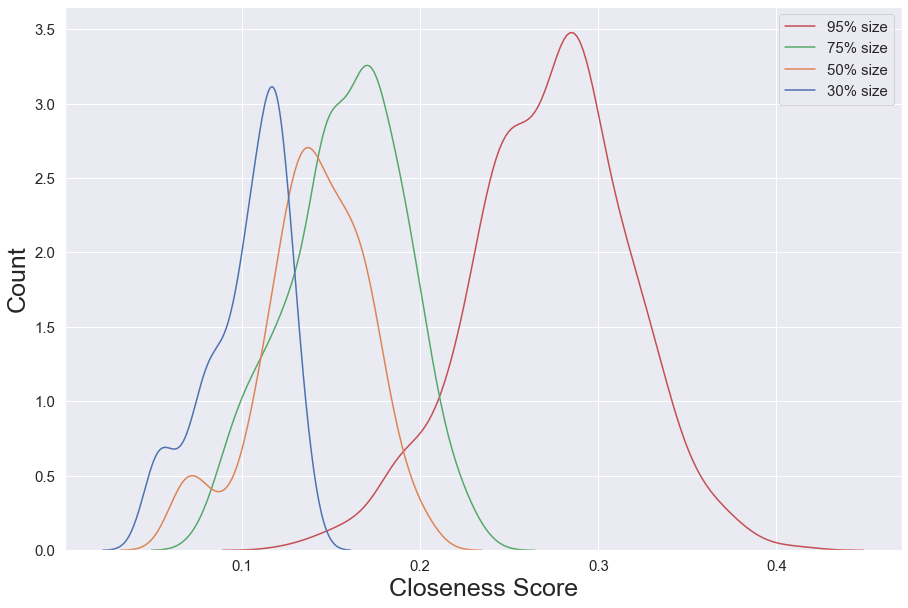

In [70]:
# sns.histplot(pd.DataFrame(closeness_centralities, index = thresholds.keys()).T, kde=True)
with sns.axes_style("darkgrid"):
    sns.kdeplot(data = pd.DataFrame(closeness_centralities, index = thresholds.keys()).T)
    plt.gca().set_ylabel('Count')
    plt.gca().set_xlabel('Closeness Score')
    plt.legend(['95% size', '75% size', '50% size', '30% size'],prop={'size': 15})
    plt.savefig(plot_output_folder / Path(f'closeness dist.png'), bbox_inches='tight')

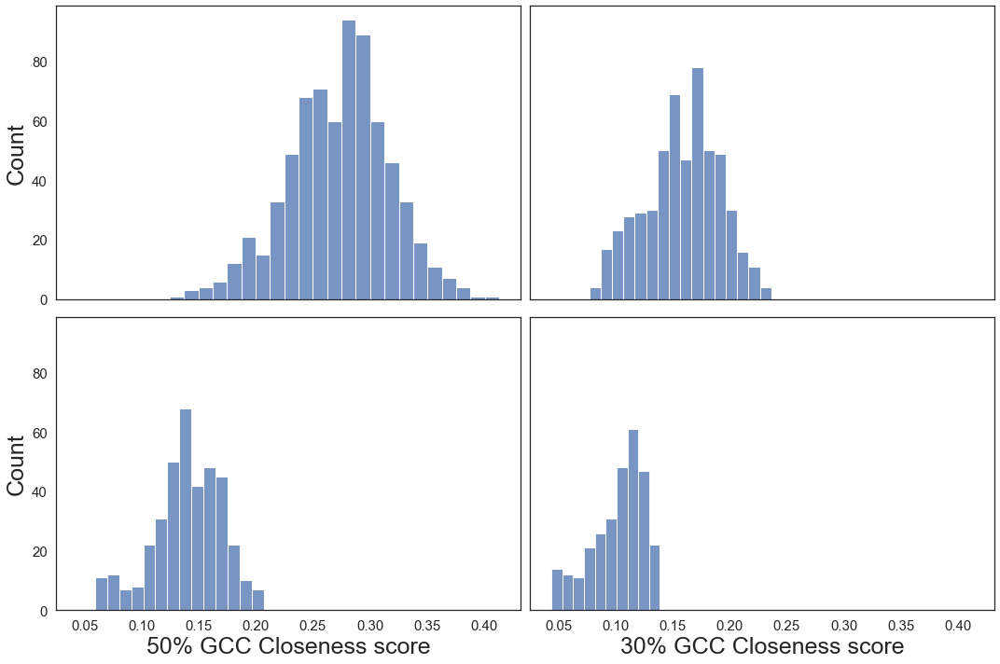

In [71]:
plot_data = pd.DataFrame(closeness_centralities, index = thresholds.keys()).T
fig, axes = plt.subplots(2,2,sharey=True, sharex=True)

for c, ax in zip(plot_data.columns, axes.flatten()):
    sns.histplot(plot_data[c].dropna(), ax=ax)
    xlabel = ax.get_xlabel()
    ax.set_xlabel(f"{round(float(xlabel) * 100)}% GCC Closeness score")
    # ax.set_yscale("log")
plt.tight_layout()
# plt.savefig(plot_output_folder / Path(f'betweenness dist.png'), bbox_inches='tight')

The histogram for closeness is interesting, there's a huge jump going from 0.75 to 0.95. I feel like this is most likely indicative that the network is drastically more connected at this point, so on average all nodes have much better access to all other nodes.

### Betweenness

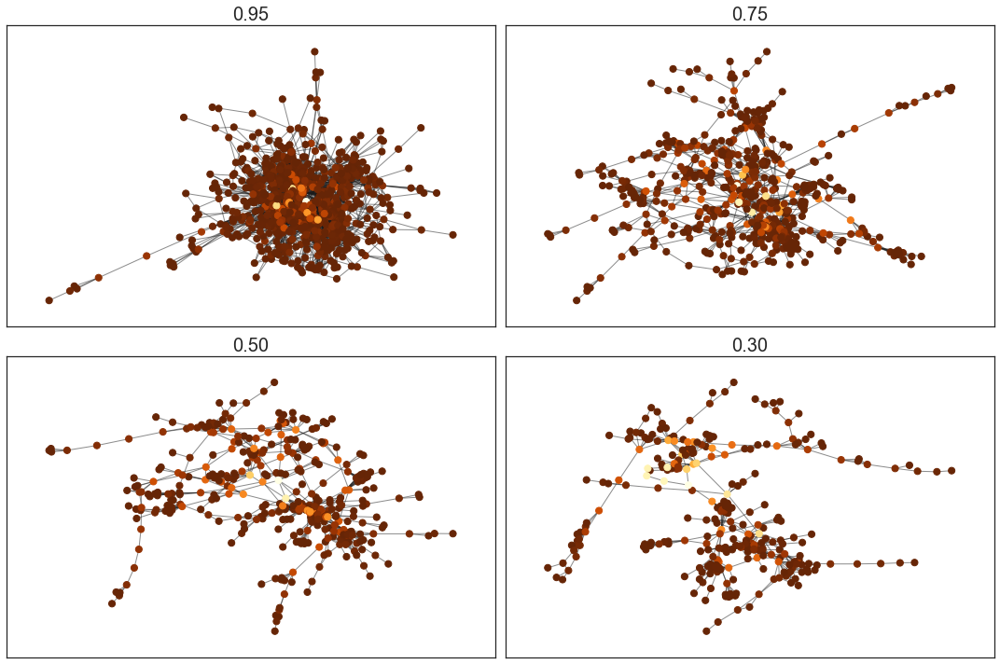

In [72]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

betweenness_centralities = [list(nx.betweenness_centrality(g).values()) for g in GCCs.values()]
# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(GCCs.values(), betweenness_centralities):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'Betweenness')

plot_graph_dict(GCCs, axes, graph_network_by_list, positions.values(), betweenness_centralities, kwargs=kwargs)

At a glance, Betweenness is certainly more similar to degree than closenness in that it's identifying individual notes of import rather than ranking chapters in general. Once again it's very difficult to see anything interesting in the larger networks but we can spot a few nodes that look to be very influential particularly in the smaller graphs

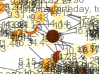
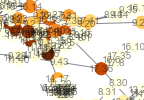

These nodes are typical of what you'd expect betweenness to capture, "Boundary spanners" that make up one of few lines between distinct clusters of nodes. In our context, where links seem to largely be formed by characters, this might indicate a chapter where important characters that are typically kept separate make a simultaneous appearance.

#### ADD COLOURING TO FINAL?

In [73]:
print_top_n_centrality(nx.betweenness_centrality, 5, 3, GCCs, extra_func = [['Final?', lambda chs, t: [is_final(ch) for ch in chs]]], output_latex=False)

,Top 3 terms,Score,Count,Final?
Chapter,,,,
8.47,"['michael', 'molly', 'ebenezar']",0.112,3,True
9.43,"['marcone', 'helen', 'thomas']",0.084,2,True
17.36,"['mab', 'lara', 'marcone']",0.080,3,True
4.7,"['murphy', 'murph', 'album']",0.066,1,False
15.51,"['michael', 'marcone', 'molly']",0.059,2,True


,Top 3 terms,Score,Count,Final?
Chapter,,,,
9.43,"['marcone', 'helen', 'thomas']",0.200,2,True
17.36,"['mab', 'lara', 'marcone']",0.171,3,True
8.47,"['michael', 'molly', 'ebenezar']",0.160,3,True
13.18,"['butters', 'murphy', 'ball']",0.147,2,False
9.32,"['murphy', 'mouse', 'marcone']",0.124,1,False


,Top 3 terms,Score,Count,Final?
Chapter,,,,
17.36,"['mab', 'lara', 'marcone']",0.291,3,True
8.47,"['michael', 'molly', 'ebenezar']",0.243,3,True
11.49,"['peabody', 'morgan', 'council']",0.193,1,True
13.18,"['butters', 'murphy', 'ball']",0.141,2,False
15.51,"['michael', 'marcone', 'molly']",0.139,2,True


,Top 3 terms,Score,Count,Final?
Chapter,,,,
14.15,"['island', 'thomas', 'bob']",0.432,1,False
14.14,"['molly', 'thomas', 'brother']",0.373,1,False
"It’s my birthday, too","['mall', 'thomas', 'molly']",0.369,1,False
12.27,"['thomas', 'molly', 'mouse']",0.366,1,False
11.34,"['morgan', 'mouse', 'molly']",0.362,1,False


The top terms for each chapter provides some support to the idea that these chapters represent coappearences of disjoint characters. While the level of separation between characters varies from a coappearence once or twice a book to once or twice in the overall series, there does appear to be a very consistent separation for atleast one of the top three terms.

Something I noticed looking at these chapters is that many of them looked to be quite late in their respective books. I've added an extra column here "Final?" to represent if a chapter is the final of it's book. And the vast majority of high scoring chapters for betweenness are actually the final chapters! A really interesting result. As for why, The final chapters of each book tend to be very retrospective, summarizing a lot of the major events and consequences for later books and in doing so almost all major characters from the book are mentioned. It would make sense a lot of sense then that these chapters may be "boundary spanners" between books and chapters that may otherwise be largely independent.

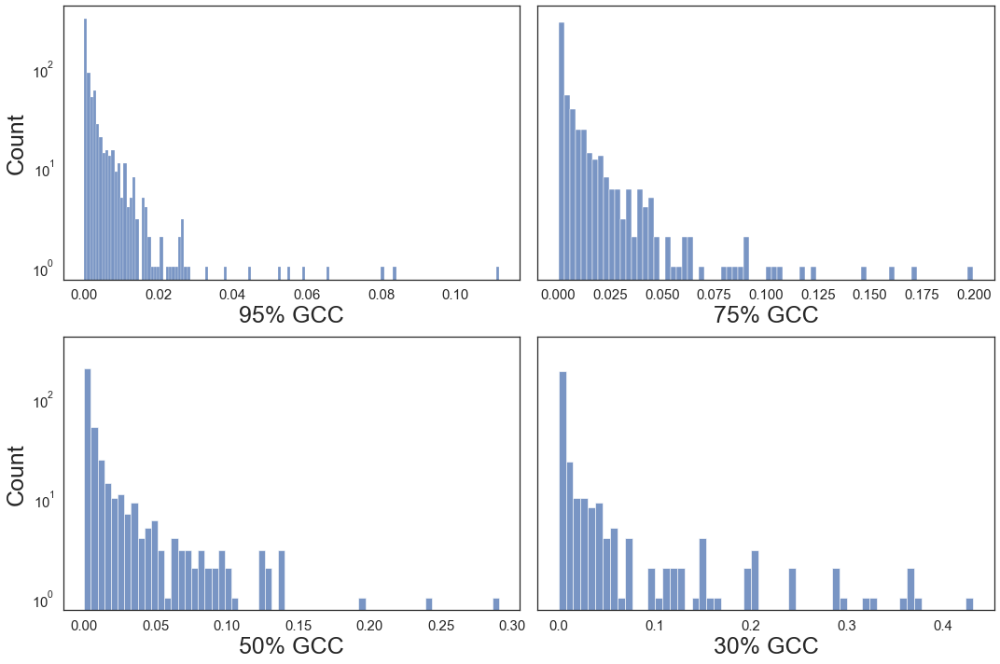

In [74]:
plot_data = pd.DataFrame(betweenness_centralities, index = thresholds.keys()).T
fig, axes = plt.subplots(2,2,sharey=True)

with sns.axes_style("darkgrid"):
    for c, ax in zip(plot_data.columns, axes.flatten()):
        sns.histplot(plot_data[c].dropna(), ax=ax)
        xlabel = ax.get_xlabel()
        ax.set_xlabel(f"{round(float(xlabel) * 100)}% GCC")
    ax.set_yscale("log")
    plt.tight_layout()
    plt.savefig(plot_output_folder / Path(f'betweenness dist.png'), bbox_inches='tight')

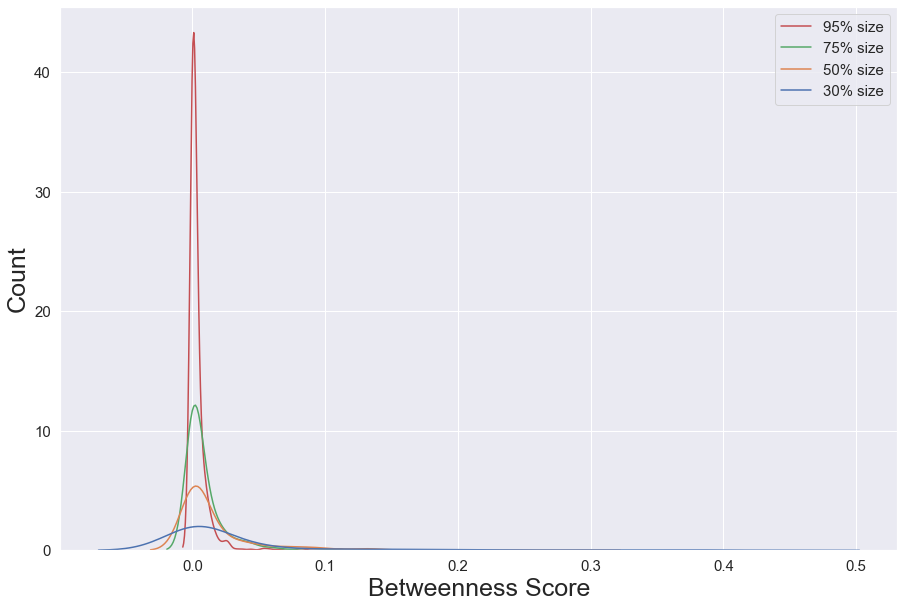

In [75]:
with sns.axes_style("darkgrid"):
    sns.kdeplot(data = pd.DataFrame(betweenness_centralities, index = thresholds.keys()).T)
    plt.gca().set_ylabel('Count')
    plt.gca().set_xlabel('Betweenness Score')
    plt.legend(['95% size', '75% size', '50% size', '30% size'],prop={'size': 15})
    plt.savefig(plot_output_folder / Path(f'betweenness dist.png'), bbox_inches='tight')

# FIX INPUTS after workiing out **kwargs

In [76]:
def graph_network_by_final(G, pos, colour, ax = None, cmap = None, with_labels = None):
    colour = [is_final(node) for node in list(G.nodes())]
    labels = {n : n * final for n, final in zip(list(G.nodes), colour)}
    size = 80
    
    
    nx.draw_networkx(G, ax=ax, pos=pos, node_color=colour, cmap = sns.color_palette("vlag", as_cmap=True), node_size = size, edgelist=[], with_labels=False)
    nx.draw_networkx_labels(G, ax=ax, pos=pos, font_size=15, labels=labels)
    nx.draw_networkx_edges(G, ax=ax, pos=pos, alpha=0.5)

In [77]:
# Add as attribute for use ingephi
node_is_final = []
for g in GCCs.values():
    node_is_final.append([is_final(n) for n in g.nodes()])

for g, c in zip(GCCs.values(), node_is_final):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'Final Chapter')

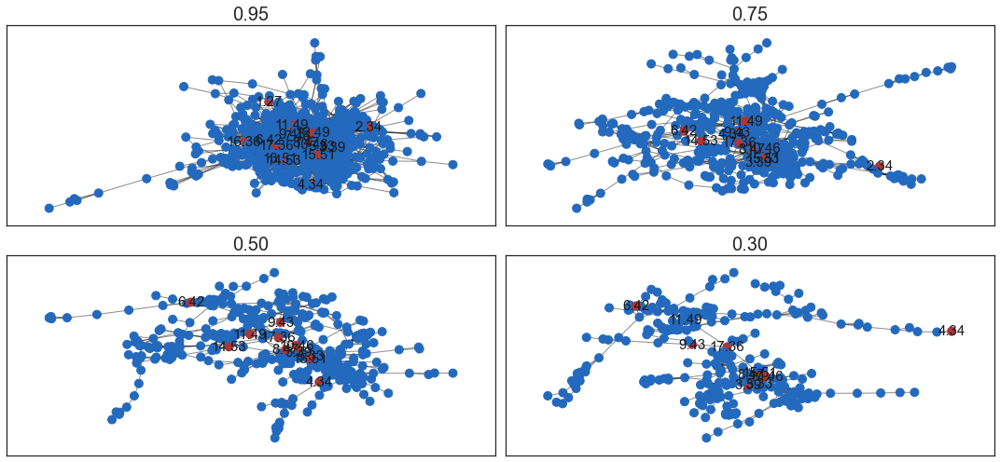

In [78]:
fig, axes = plt.subplots(2,2, figsize=(15,7))

plot_graph_dict(GCCs, axes, graph_network_by_final, positions.values(), colour=cycle([None]))

### Eigenvector centrality

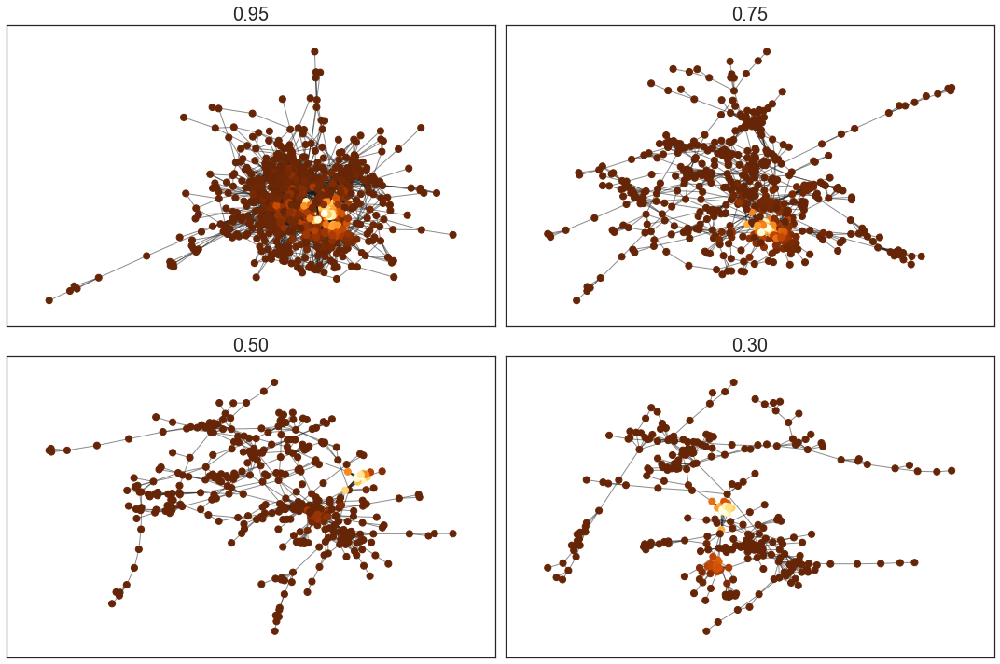

In [79]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

eigenvector_centralities = [list(nx.eigenvector_centrality(g, max_iter=1000).values()) for g in GCCs.values()]
# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(GCCs.values(), eigenvector_centralities):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'Eigenvector')

plot_graph_dict(GCCs, axes, graph_network_by_list, positions.values(), eigenvector_centralities, kwargs=kwargs)

<AxesSubplot:ylabel='Count'>

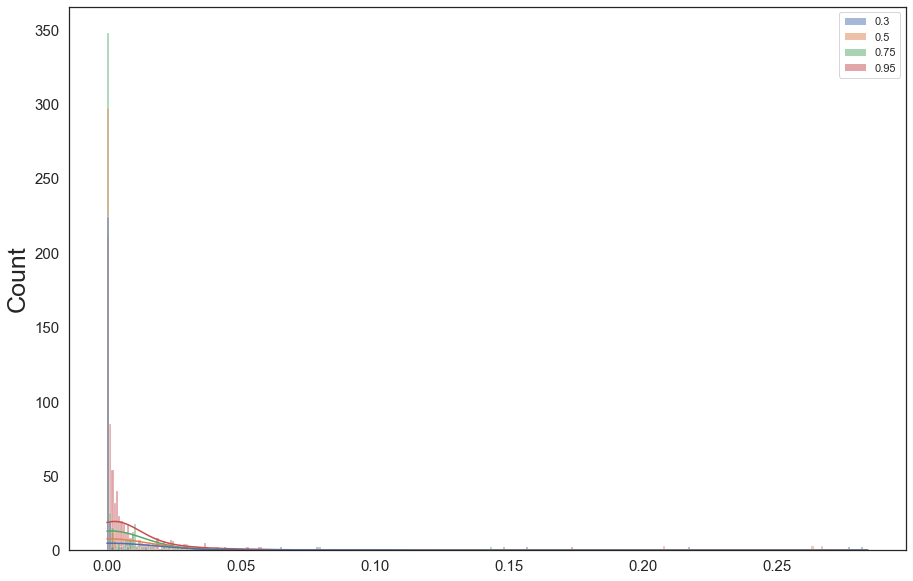

In [80]:
sns.histplot(pd.DataFrame(eigenvector_centralities, index = thresholds.keys()).T, kde=True)

In [81]:
print_top_n_centrality(nx.eigenvector_centrality, 5, 3, GCCs, extra_measure_params={'max_iter' : 1000}, output_latex=False)

,Top 3 terms,Score,Count
Chapter,,,
The warrior,"['michael', 'forthill', 'alicia']",0.209,2
15.20,"['michael', 'know', 'nicodemus']",0.195,2
15.51,"['michael', 'marcone', 'molly']",0.194,1
10.38,"['michael', 'sword', 'coin']",0.189,2
3.31,"['michael', 'thomas', 'lydia']",0.188,2


,Top 3 terms,Score,Count
Chapter,,,
15.20,"['michael', 'know', 'nicodemus']",0.284,2
10.38,"['michael', 'sword', 'coin']",0.283,2
The warrior,"['michael', 'forthill', 'alicia']",0.273,2
3.31,"['michael', 'thomas', 'lydia']",0.244,2
5.7,"['michael', 'shiro', 'sanya']",0.224,1


,Top 3 terms,Score,Count
Chapter,,,
3.18,"['bob', 'dream', 'nightmare']",0.267,2
7.3,"['bob', 'kemmler', 'skull']",0.267,2
13.35,"['bob', 'uriel', 'spirit']",0.267,1
1.8,"['bob', 'potion', 'potions']",0.265,1
2.7,"['bob', 'werewolves', 'wolf']",0.264,2


,Top 3 terms,Score,Count
Chapter,,,
7.3,"['bob', 'kemmler', 'skull']",0.282,2
10.3,"['bob', 'shelf', 'book']",0.282,1
3.18,"['bob', 'dream', 'nightmare']",0.276,2
14.11,"['bob', 'maeve', 'mab']",0.276,1
2.7,"['bob', 'werewolves', 'wolf']",0.264,2


The first thing that jumps out to me here is how distinct these results are from the other centrality measures. The Eigenvector centrality has captured quite a few chapters none of the others did, particularly chapters from earlier on in the series. It's also incredible how consistent the primary term for each chapter is within the same graph. There are no deviations at all, let's try looking deeper down the list for each to see if this holds:

In [82]:
print_top_n_centrality(nx.eigenvector_centrality, 15, 3, GCCs, extra_func = [('Final?', lambda chs, t: [is_final(ch) for ch in chs])],
                       extra_measure_params={'max_iter' : 1000})

,Top 3 terms,Score,Count,Final?
Chapter,,,,
The warrior,"['michael', 'forthill', 'alicia']",0.209,2,False
15.20,"['michael', 'know', 'nicodemus']",0.195,2,False
15.51,"['michael', 'marcone', 'molly']",0.194,1,True
10.38,"['michael', 'sword', 'coin']",0.189,2,False
3.31,"['michael', 'thomas', 'lydia']",0.188,2,False
3.26,"['michael', 'cigarette', 'wine']",0.182,2,False
8.47,"['michael', 'molly', 'ebenezar']",0.177,1,True
10.23,"['michael', 'sword', 'light']",0.174,2,False
5.7,"['michael', 'shiro', 'sanya']",0.173,2,False


,Top 3 terms,Score,Count,Final?
Chapter,,,,
15.20,"['michael', 'know', 'nicodemus']",0.284,2,False
10.38,"['michael', 'sword', 'coin']",0.283,2,False
The warrior,"['michael', 'forthill', 'alicia']",0.273,2,False
3.31,"['michael', 'thomas', 'lydia']",0.244,2,False
5.7,"['michael', 'shiro', 'sanya']",0.224,2,False
3.26,"['michael', 'cigarette', 'wine']",0.219,2,False
3.9,"['michael', 'forthill', 'church']",0.210,2,False
3.20,"['michael', 'charity', 'cemetery']",0.210,2,False
10.20,"['michael', 'tessa', 'nicodemus']",0.201,2,False


,Top 3 terms,Score,Count,Final?
Chapter,,,,
3.18,"['bob', 'dream', 'nightmare']",0.267,2,False
7.3,"['bob', 'kemmler', 'skull']",0.267,2,False
13.35,"['bob', 'uriel', 'spirit']",0.267,2,False
1.8,"['bob', 'potion', 'potions']",0.265,2,False
2.7,"['bob', 'werewolves', 'wolf']",0.264,2,False
10.3,"['bob', 'shelf', 'book']",0.264,2,False
14.11,"['bob', 'maeve', 'mab']",0.264,2,False
3.15,"['bob', 'threshold', 'malone']",0.240,2,False
6.5,"['bob', 'puppy', 'mavra']",0.237,2,False


,Top 3 terms,Score,Count,Final?
Chapter,,,,
7.3,"['bob', 'kemmler', 'skull']",0.282,2,False
10.3,"['bob', 'shelf', 'book']",0.282,2,False
3.18,"['bob', 'dream', 'nightmare']",0.276,2,False
14.11,"['bob', 'maeve', 'mab']",0.276,2,False
2.7,"['bob', 'werewolves', 'wolf']",0.264,2,False
13.35,"['bob', 'uriel', 'spirit']",0.258,2,False
1.8,"['bob', 'potion', 'potions']",0.248,2,False
6.5,"['bob', 'puppy', 'mavra']",0.236,2,False
8.6,"['bob', 'model', 'skull']",0.232,2,False


That's incredible, each is almost exclusively dominated by a single character. Considering that the eigenvector centrality values connections to "important" nodes, it looks like this manifests as a certain character being "important" and therefore nodes with a strong presence of that character being favored.

Something else of interest to note is the diversity of books, this has captured books from all over the series. Even other metrics like degree that seemed to be represented by a single character tended to be biased towards a certain half of the series.

I should print out similar output for degree and closeness while I'm here:

It's quite interesting to see how well the anthology stories seem to score. A number of them are actually from a different characters perspective aswell. The entire series is written in first person so I would expect those chapters to be _very_ different from the rest. But that seems to not be the case at all.

After a quick check the top scoring chapters that are not from the protagonists perspective are: Aftermath and Backup. Might be worth more investigation into why these chapters that I would expect to be quite distinct score really well.

In [83]:
save_graphs(GCCs, "Undirected")

# Directed Graph

Before I can apply my previous workflow, I had relied on my naming convention for creating the directed graph. With the addition of the anthology chapters, I'll need to adjust the naming scheme to accommodate.

In [84]:
LooseVersion('5b.6') < LooseVersion('5s.0')

True

Alright that's simple enough, I'll add a b to all books and s to side stories that follow a given book.

I also need to put an order to the sidestories, instead of having them exist simultaneously as x.5.

In [85]:
# Converting to str to match what I currently have for the rest of the names
# First value is for short story at the end of book 17
anthology_names = [str(i) for i in [17.5, 0.1, 5.1, 7.1, 9.1, 9.2, 10.1, 10.2, 10.3, 10.4, 11.1, 12.1, 0.2, 2.1, 8.1, 7.2, 10.5, 11.2, 11.3, 13.1, 14.1, 15.1, 15.2, 15.3]]
anthology_names = [i.split('.')[0] + 's' + '.' + i.split('.')[1] for i in anthology_names]

In [86]:
names_b = [i.split('.')[0] + 'b' + '.' + i.split('.')[1] for i in names[:-(len(anthology_names))]]
node_remape = {key : value for key, value in zip(names, names_b + anthology_names)}

In [87]:
def build_directed(G):
    directed = nx.relabel_nodes(G, node_remape).to_directed()
    to_remove = []
    for edge in directed.edges:
        if LooseVersion(edge[0]) > LooseVersion(edge[1]):
            to_remove.append(edge)
    directed.remove_edges_from(to_remove)
    
    # reverting to previous labeling scheme for consistency
    directed = nx.relabel_nodes(directed, {value : key for key, value in node_remape.items()})
    return directed

In [88]:
DiGCCs = {}
for t, graph in GCCs.items():
    DiGCCs[t] = build_directed(graph)

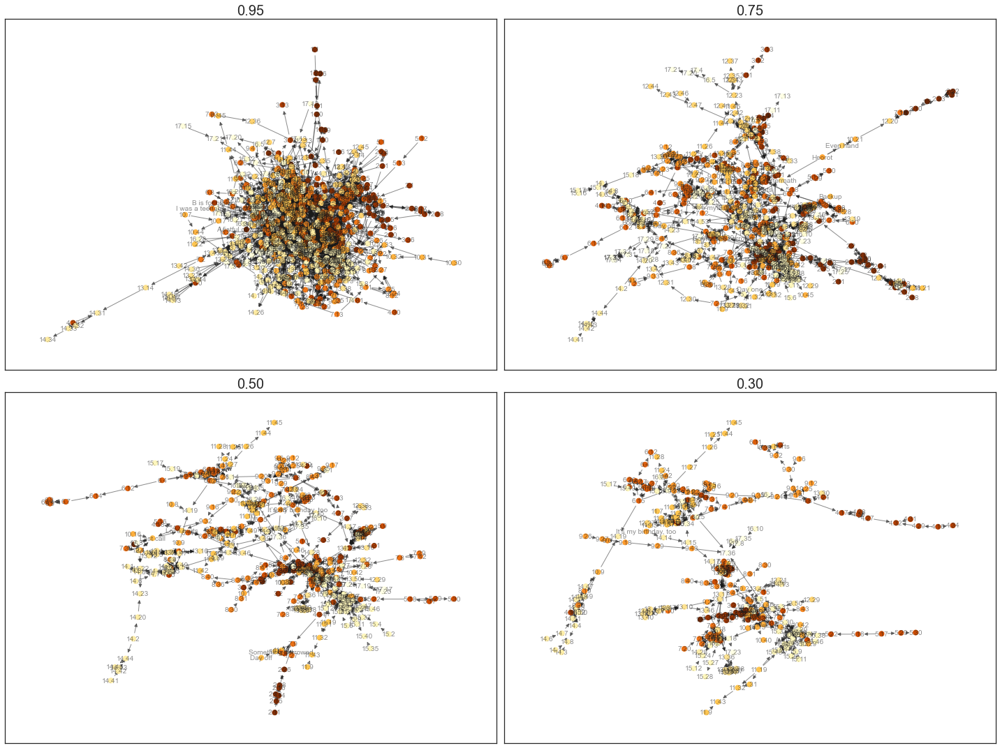

In [89]:
fig, axes = plt.subplots(2,2, figsize=(20,15))

plot_graph_dict(DiGCCs, axes, graph_network_by_list, positions.values())

While it's still very difficult to pick out anything interesting on the larger graphs, There are already some interesting observations to make for the directed version of the graph before looking at the centrality scores. For example, recall a node I highlighted on the 30% size graph that scored well on betweenness as a boundary spanner, Book 17 Chaper 36. If we zoom in on that node by looking at it's direct connections (ego-graph):

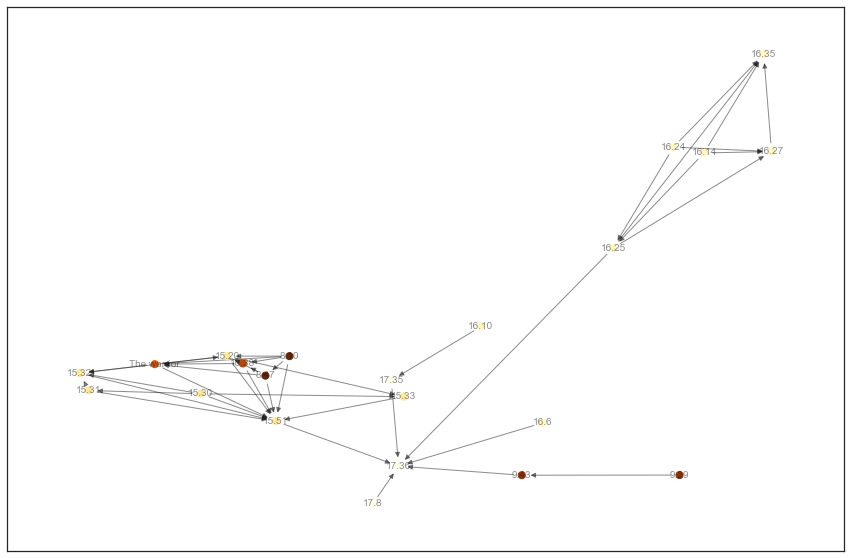

In [90]:
ego = nx.ego_graph(DiGCCs[0.3], '17.36', 2, undirected = True)
graph_network_by_list(ego, pos = nx.spring_layout(ego, seed=random_seed))

In [91]:
print(DiGCCs[0.3].in_edges('17.36'), '\n',
DiGCCs[0.3].out_edges('17.36'))

[('17.35', '17.36'), ('9.43', '17.36'), ('15.51', '17.36'), ('16.6', '17.36'), ('17.8', '17.36'), ('16.25', '17.36')] 
 []


We can see that not only is it a boundary spanner, but it's also the final destination chronologically for all these nodes! This isn't just any random chapter either, book 17 is the most recent book as of this analysis, and this chapter in particular is

In [92]:
is_final('17.36')

True

In [93]:
get_top_n_tfidf('17.36', 10, True)

[['mab', 0.37],
 ['lara', 0.31],
 ['marcone', 0.26],
 ['molly', 0.21],
 ['michael', 0.15],
 ['gard', 0.11],
 ['click', 0.1],
 ['ethniu', 0.1],
 ['people', 0.1],
 ['winter', 0.1]]

the final chapter! While this isn't exactly a surprising result, considering what we've seen thus far. It's still incredibly interesting that one of two connections between the large halves of the smaller GCC is actually the current final chapter of the series.

This evokes an image of two branches of the story coming together for the conclusion. Reading through the chapter it certainly feels like it sets up many ideas that will absolutely be very important moving forward, but of course it's impossible to know what will happen with as of now unreleased books. But perhaps it would be worth looking at the network as it would of existed in the past?

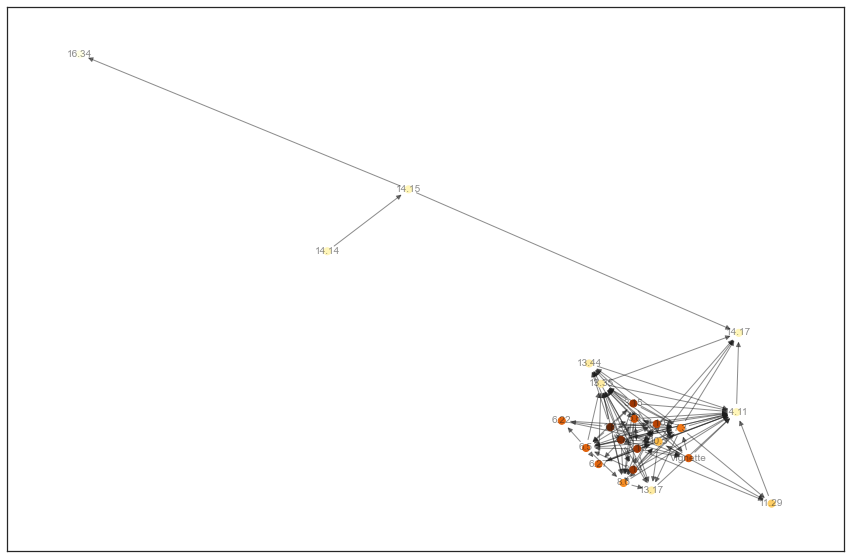

In [94]:
ego = nx.ego_graph(DiGCCs[0.3], '14.17', 2, undirected = True)
graph_network_by_list(ego, pos = nx.spring_layout(ego, seed=random_seed))

In [95]:
print(DiGCCs[0.3].in_edges('14.17'), '\n',
DiGCCs[0.3].out_edges('14.17'))

[('13.35', '14.17'), ('3.18', '14.17'), ('14.11', '14.17'), ('7.3', '14.17'), ('10.3', '14.17'), ('14.15', '14.17')] 
 []


We have the same relationship! Although I do not instantly recognize this chapter like I did for 17.36.

In [96]:
is_final('14.17')

False

In [97]:
sum([ch == 14 for ch in ch_book])

53

In [98]:
get_top_n_tfidf('14.15', 10, True)

[['island', 0.46],
 ['thomas', 0.34],
 ['bob', 0.22],
 ['molly', 0.2],
 ['dock', 0.19],
 ['demonreach', 0.16],
 ['uh', 0.1],
 ['ruined', 0.09],
 ['know', 0.09],
 ['cottage', 0.08]]

This is actually quite an interesting chapter. It's been quite obvious thus far that characters are the backbone of connections in our network. Where high scoring and notable nodes typically feature multiple important and frequent characters. This chapter is distinctly different, While Bob is an important character, and has been present since the first book, they typically have very infrequent appearances. And all other terms here are quite sparse throughout the series, rarely showing up for more than a handful of chapters in each of the later books.

In [99]:
novels[14 - 1]

'Cold Days'

14.17 overall feels very ominous, and is almost certainly setting up major events for future books. It’s not hard at all to imagine that later on in the series, the ideas that these chapters set up will lead to major events that could easily be the focus of individual books. Although unfortunately we can’t expand our network into the future to investigate this idea. What we could instead do is imagine an earlier version of the network, with books past a certain point pruned. If we find similar relationships, we will be able to verify if there has been any pay off for these chapters later on.

In [100]:
out_dict = {t : nx.out_degree_centrality(g) for t, g in DiGCCs.items()}

In [101]:
print_top_n_centrality(nx.betweenness_centrality, 5, 3, GCCs, extra_func = [
    ['Final?', lambda chs, t: [is_final(ch) for ch in chs]],
    ['out_deg', lambda chs, t: [score * (len(out_dict[t].values()) - 1) for ch in chs for name, score in out_dict[t].items() if name == ch]]])

,Top 3 terms,Score,Count,Final?,out_deg
Chapter,,,,,
8.47,"['michael', 'molly', 'ebenezar']",0.112,3,True,52.000000
9.43,"['marcone', 'helen', 'thomas']",0.084,2,True,19.000000
17.36,"['mab', 'lara', 'marcone']",0.080,3,True,1.000000
4.7,"['murphy', 'murph', 'album']",0.066,1,False,42.000000
15.51,"['michael', 'marcone', 'molly']",0.059,2,True,5.000000


,Top 3 terms,Score,Count,Final?,out_deg
Chapter,,,,,
9.43,"['marcone', 'helen', 'thomas']",0.200,2,True,4.000000
17.36,"['mab', 'lara', 'marcone']",0.171,3,True,0.000000
8.47,"['michael', 'molly', 'ebenezar']",0.160,3,True,11.000000
13.18,"['butters', 'murphy', 'ball']",0.147,2,False,10.000000
9.32,"['murphy', 'mouse', 'marcone']",0.124,1,False,5.000000


,Top 3 terms,Score,Count,Final?,out_deg
Chapter,,,,,
17.36,"['mab', 'lara', 'marcone']",0.291,3,True,0.000000
8.47,"['michael', 'molly', 'ebenezar']",0.243,3,True,8.000000
11.49,"['peabody', 'morgan', 'council']",0.193,1,True,0.000000
13.18,"['butters', 'murphy', 'ball']",0.141,2,False,6.000000
15.51,"['michael', 'marcone', 'molly']",0.139,2,True,1.000000


,Top 3 terms,Score,Count,Final?,out_deg
Chapter,,,,,
14.15,"['island', 'thomas', 'bob']",0.432,1,False,2.000000
14.14,"['molly', 'thomas', 'brother']",0.373,1,False,1.000000
"It’s my birthday, too","['mall', 'thomas', 'molly']",0.369,1,False,2.000000
12.27,"['thomas', 'molly', 'mouse']",0.366,1,False,0.000000
11.34,"['morgan', 'mouse', 'molly']",0.362,1,False,2.000000


Something I should be cautious of here is that, of course chapters near the very end of the series have much less opportunity for outwards facing edges. Although it's of course not necessarily a proxy for position in the series, as there are certainly some chapters here with lower out degree from earlier in the series.

Although saying a score is "low" is a bit meaningless without any context, let's have a quick look at the distributions:

<AxesSubplot:ylabel='Count'>

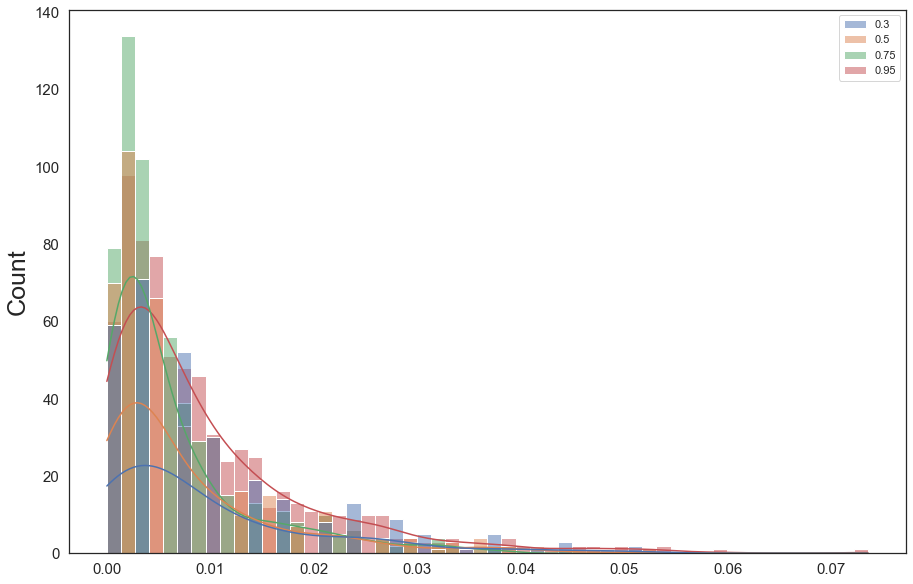

In [102]:
sns.histplot(pd.DataFrame(out_dict.values(), index = thresholds.keys()).T, kde=True)

So values below 0.01 and very common for all graphs, and even values at 0 are very common.

Let's try looking at similar concepts on a pruned network. While ideally we would tinker with the parameters such as vocabulary size again, for now I'll keep all parameters the same but change the corpus to exclude a handful of the more recent entries in the series:

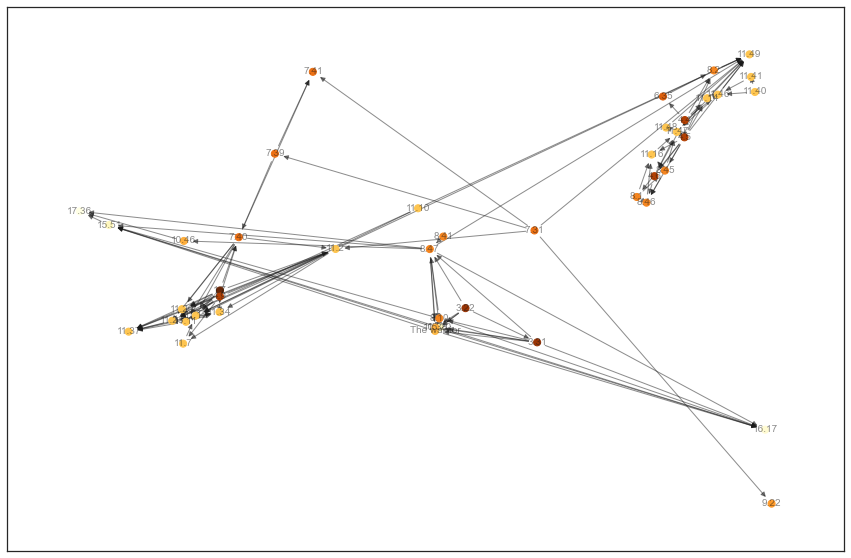

In [103]:
ego = nx.ego_graph(DiGCCs[0.5], '11.49', 2, undirected = True)
graph_network_by_list(ego, pos = nx.spring_layout(ego, seed=random_seed))

# Exploration of Network "From the past"

In [104]:
# ch_book has books in chronological order, for the idea of "going back in time" using release order is more appropriate.
# The following converts chronological order for anthologies to release order
ch_book_release = list(map(lambda ch: side_jobs_release if ch in side_jobs_chronology else brief_cases_release if ch in brief_cases_chronology else ch,
                           ch_book))

In [105]:
dresden_pruned = []
names_pruned = []
ch_book_pruned = []
for ch, book, name in zip(dresden, ch_book_release, names):
    if book < 11:
        dresden_pruned.append(ch)
        names_pruned.append(name)
        ch_book_pruned.append(book)

In [106]:
V = 11000
targets = [0.95, 0.75, 0.5, 0.3]
thresholds_pruned = {}
for target in targets:
    thresholds_pruned[target] = find_t(target, V, chapters=dresden_pruned, names = names_pruned)

Current target: 0.95, Best t = 1.000, error = 1.000, next iteration upper: 1.000, lower: 0.000
Current target: 0.95, Best t = 0.750, error = 0.047, next iteration upper: 0.750, lower: 0.500
Current target: 0.95, Best t = 0.688, error = 0.017, next iteration upper: 0.750, lower: 0.688
Target = 0.95, Threshold = 0.703, Error = 0.014
Current target: 0.75, Best t = 1.000, error = 1.000, next iteration upper: 1.000, lower: 0.000
Current target: 0.75, Best t = 0.750, error = 0.247, next iteration upper: 0.750, lower: 0.500
Current target: 0.75, Best t = 0.625, error = 0.113, next iteration upper: 0.688, lower: 0.625
Current target: 0.75, Best t = 0.641, error = 0.023, next iteration upper: 0.641, lower: 0.625
Current target: 0.75, Best t = 0.633, error = 0.008, next iteration upper: 0.633, lower: 0.629
Target = 0.75, Threshold = 0.632, Error = 0.005
Current target: 0.5, Best t = 1.000, error = 1.000, next iteration upper: 1.000, lower: 0.000
Current target: 0.5, Best t = 0.500, error = 0.454

In [107]:
pruned_graphs = {}
pruned_GCCs = {}
pruned_positions = {}
for t in thresholds.keys():
    pruned_graphs[t] = nx.Graph(adj_matrix(thresholds[t], dist_matrix(tfidf_rep(V, dresden_pruned, index=names_pruned))))
    # Add book attribute
    for node, book in zip(pruned_graphs[t].nodes(), ch_book_pruned):
            pruned_graphs[t].nodes[node]['book'] = book
    # Save as GCC
    pruned_GCCs[t] = get_GCC(pruned_graphs[t])
    pruned_positions[t] = nx.spring_layout(pruned_graphs[t], seed = 2000)

In [108]:
# GCCs = {}
# positions = {}
# for t, graph in graphs.items():
#     GCCs[t] = get_GCC(graph)
#     positions[t] = nx.spring_layout(graph, seed = 2000)

## CHANGE COLOURS TO MATCH SCALE OF FULL CORPUS?
Currently I've just let the colours be in whatever range, but for comparisons with previous graphs it could be good to ensure that, for example, "Book 8" is the same shade of yellow in both graphs. As in this version it would be "Near the top" while previously it would of been "About the middle"

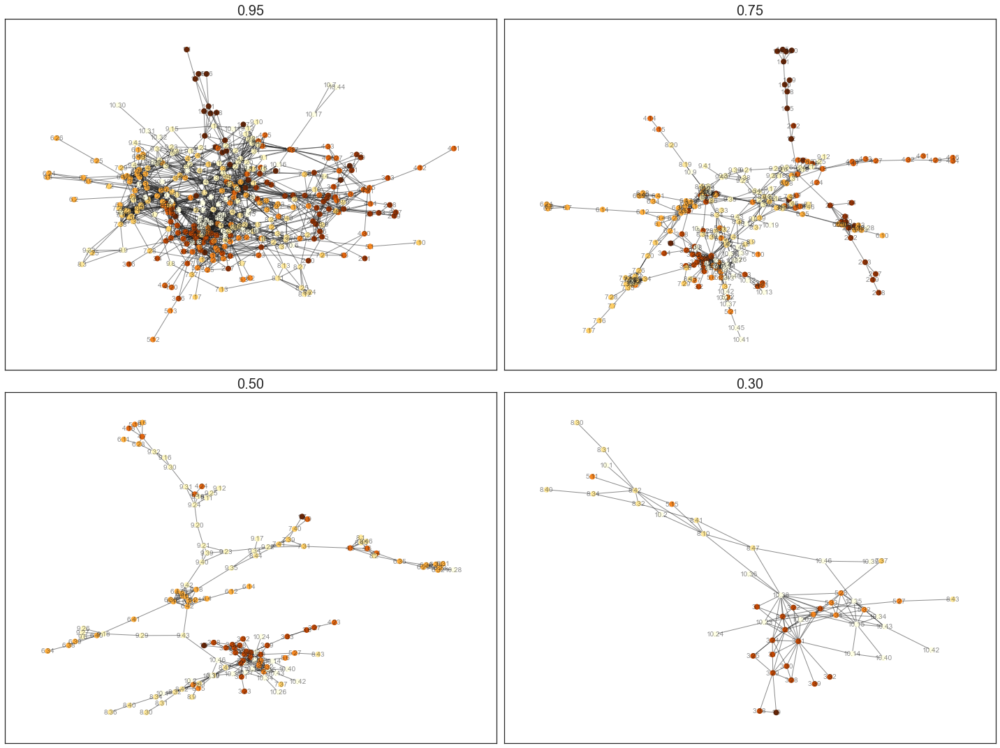

In [109]:
fig, axes = plt.subplots(2,2, figsize=(20,15))

plot_graph_dict(pruned_GCCs, axes, graph_network_by_list, positions=pruned_positions.values())

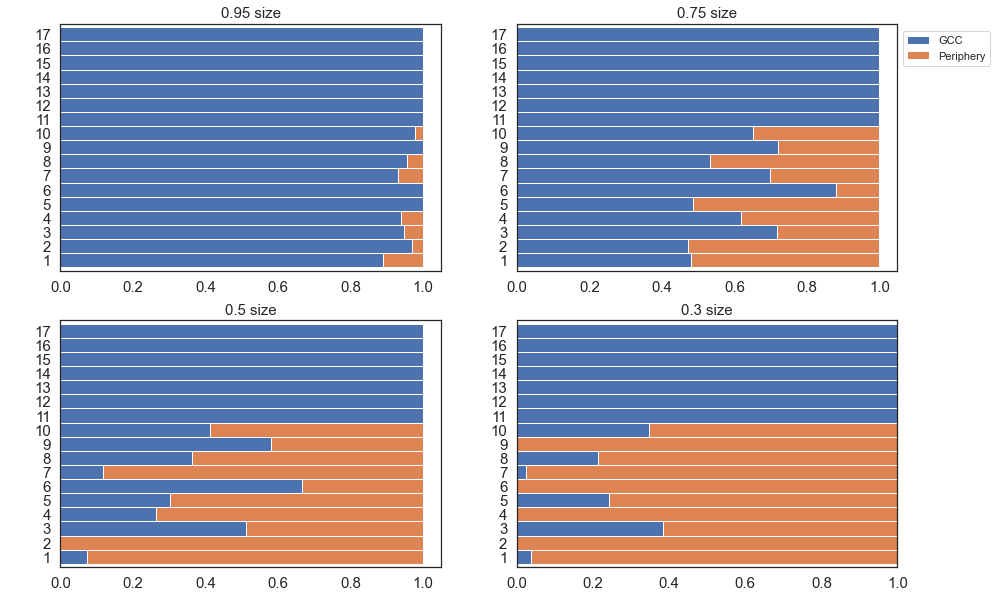

In [110]:
fig, axes = plt.subplots(2, 2)

for t, ax in zip(thresholds.keys(), axes.flatten()):
    plot_GCCvPer_by_book(get_periphery(pruned_graphs[t]), ax, t)
ax.legend(loc='center left', bbox_to_anchor=(1, 2.1));

This code obviously has not been adjusted for the reduced corpus size. But it's interesting that we see much more extreme results compared to the full sized graph. The smallest size pruned GCC is effectively missing multiple entire books. The 30% GCC effectively only contains books 10, 8, 5, and 3.

In [111]:
len(dresden) - len(dresden_pruned)

349

Here I've arbitrarily decided to try cutting the network off as of book 10. going from 17 books to 10, this is a decrease of 350 chapters, which is about half the corpus size. And accordingly things are much less dense at all network sizes. There would be a lot of interesting things to look at and compare here compared to the full corpus, but for now lets focus on what sparked this exploration. Are boundary spanning chapters indicative in some way of future trends? Let's have a look at betweeness to find any such chapters first:

In [112]:
Pruned_DiGCCs = {}
for t, graph in pruned_GCCs.items():
    Pruned_DiGCCs[t] = build_directed(graph)

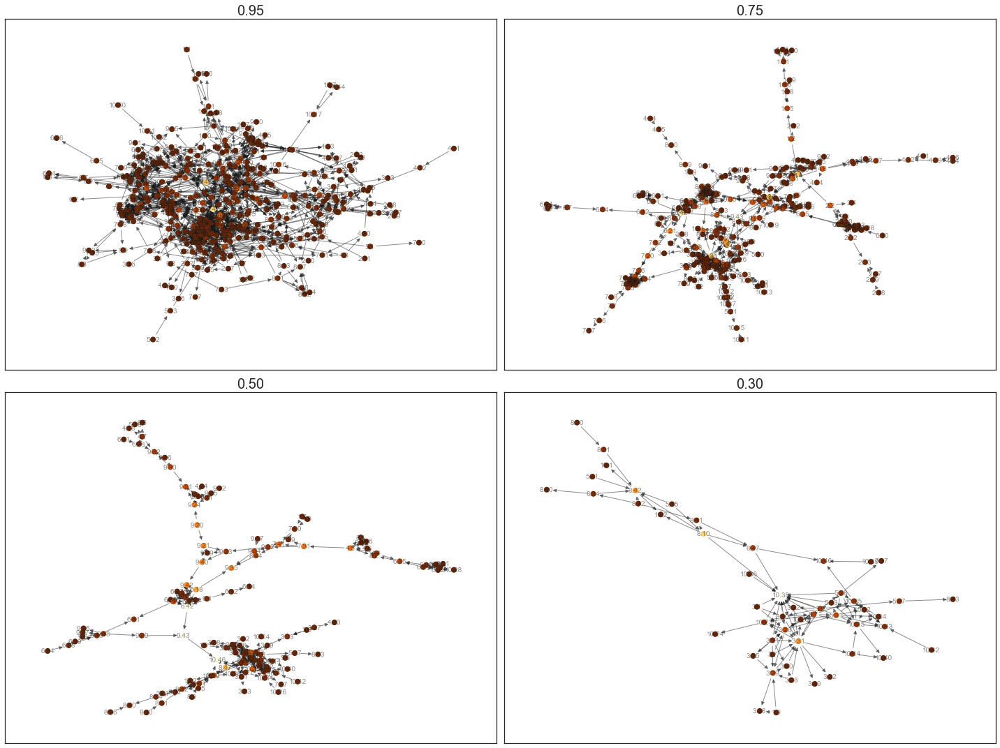

In [113]:
fig, axes = plt.subplots(2,2, figsize=(20,15))

pruned_betweenness_centralities = [list(nx.betweenness_centrality(g).values()) for g in pruned_GCCs.values()]

plot_graph_dict(Pruned_DiGCCs, axes, graph_network_by_list, colour = pruned_betweenness_centralities, positions=pruned_positions.values())

Here I've graphed the directed version of the pruned network, with nodes colored by betweenness score from the undirected version. Instantly a few nodes jump out, especially in the 30% size graph. 10.38 and 3.31. For hte 50% size 9.43/10.46 and 9.35 also look interesting.

In [114]:
print_top_n_centrality(nx.betweenness_centrality, 5, 3, pruned_GCCs, extra_func = [['Final?', lambda chs, t: [is_final(ch) for ch in chs]]])

,Top 3 terms,Score,Count,Final?
Chapter,,,,
4.7,"['murphy', 'murph', 'album']",0.198,2,False
8.47,"['michael', 'molly', 'ebenezar']",0.141,2,True
9.43,"['marcone', 'helen', 'thomas']",0.128,3,True
10.46,"['archive', 'luccio', 'charity']",0.071,2,True
9.32,"['murphy', 'mouse', 'marcone']",0.055,2,False


,Top 3 terms,Score,Count,Final?
Chapter,,,,
9.43,"['marcone', 'helen', 'thomas']",0.344,3,True
6.42,"['thomas', 'lara', 'arturo']",0.266,2,True
3.31,"['michael', 'thomas', 'lydia']",0.240,2,False
9.32,"['murphy', 'mouse', 'marcone']",0.219,2,False
4.7,"['murphy', 'murph', 'album']",0.216,2,False


,Top 3 terms,Score,Count,Final?
Chapter,,,,
9.43,"['marcone', 'helen', 'thomas']",0.539,3,True
6.42,"['thomas', 'lara', 'arturo']",0.523,2,True
10.46,"['archive', 'luccio', 'charity']",0.509,2,True
8.47,"['michael', 'molly', 'ebenezar']",0.326,2,True
6.18,"['lara', 'inari', 'thomas']",0.277,1,False


,Top 3 terms,Score,Count,Final?
Chapter,,,,
10.38,"['michael', 'sword', 'coin']",0.472,1,False
8.10,"['molly', 'michael', 'charity']",0.320,1,False
8.42,"['charity', 'molly', 'forthill']",0.232,1,False
3.31,"['michael', 'thomas', 'lydia']",0.222,2,False
5.31,"['michael', 'sanya', 'shiro']",0.114,1,False


So the majority of the nodes that looked interesting in the graphs are also well represented as far as scores go. Let's try zoom in again on some of the egographs, starting with 20.38

Initial thoughts, see some familiar chapters from the initial graphs. 8.47, 9.43, 4.7 Were all top scorers in the larger graphs previously. Something interesting that I wasn't thinking of when I pruned this graph back, is that the majority of top scoring nodes from the smaller sized networks were from exclusively later books. This is despite a fairly decent balance of books making up the network.

For example, looking at the top scores and the distribution of the full 0.3 size network:

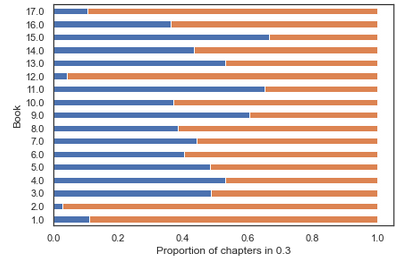

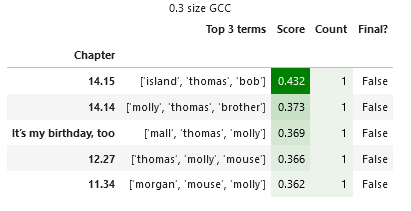

## Look at Triadic Census?
See SNA chapter 4

## In-Degree

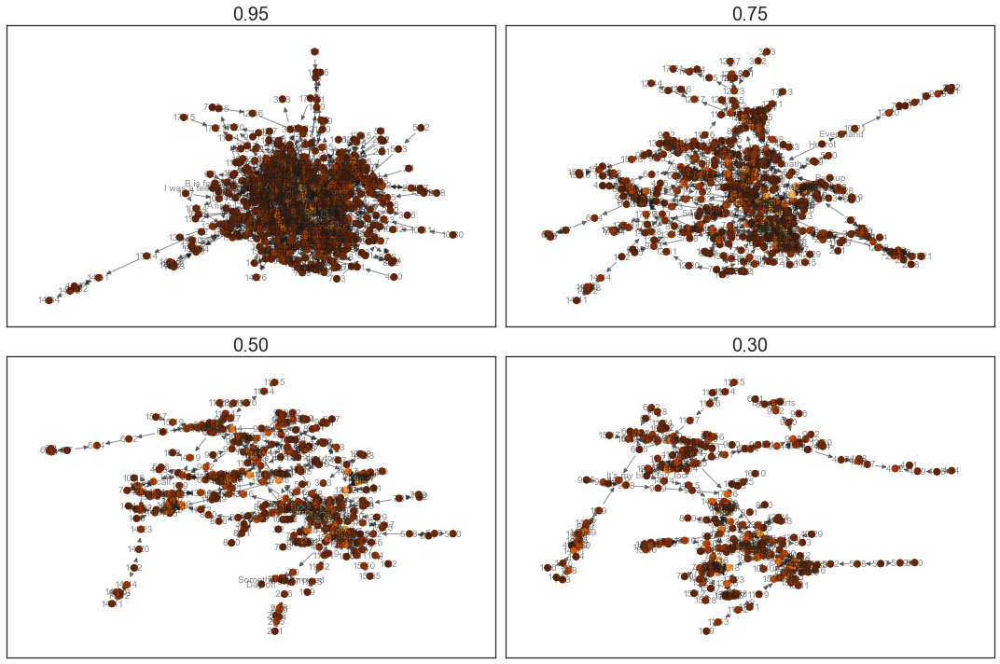

In [115]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

in_degrees = [list(nx.in_degree_centrality(g).values()) for g in DiGCCs.values()]

# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(DiGCCs.values(), in_degrees):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'InDegree')

plot_graph_dict(DiGCCs, axes, graph_network_by_list, positions.values(), in_degrees)

<AxesSubplot:ylabel='Count'>

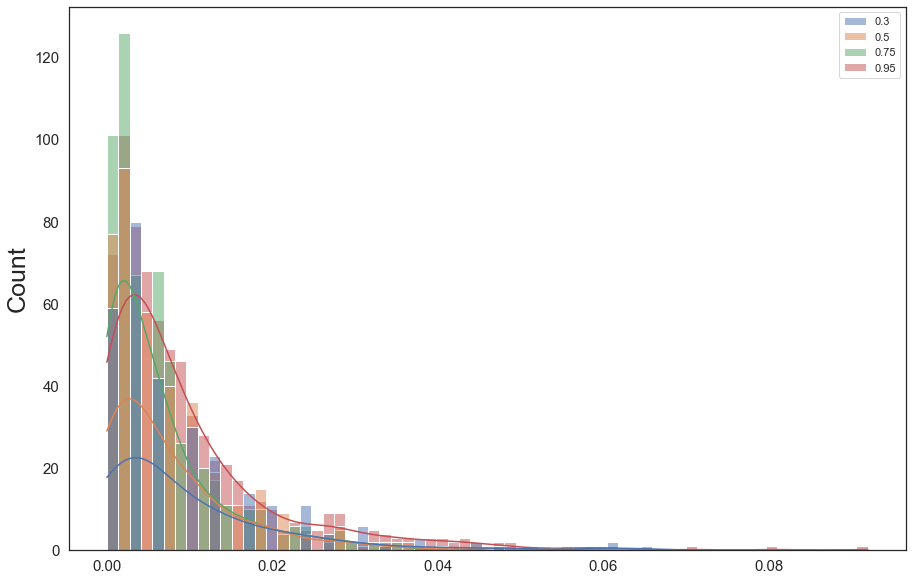

In [116]:
sns.histplot(pd.DataFrame(in_degrees, index = thresholds.keys()).T, kde=True)

In [117]:
print_top_n_centrality(nx.in_degree_centrality, 5, 3, DiGCCs, output_latex=False)

,Top 3 terms,Score,Count
Chapter,,,
15.51,"['michael', 'marcone', 'molly']",0.092,1
17.36,"['mab', 'lara', 'marcone']",0.081,1
The warrior,"['michael', 'forthill', 'alicia']",0.071,4
Love hurts,"['murphy', 'maroon', 'tunnel']",0.061,1
16.18,"['butters', 'sanya', 'sword']",0.059,1


,Top 3 terms,Score,Count
Chapter,,,
The warrior,"['michael', 'forthill', 'alicia']",0.056,4
15.20,"['michael', 'know', 'nicodemus']",0.049,3
10.38,"['michael', 'sword', 'coin']",0.047,3
14.11,"['bob', 'maeve', 'mab']",0.036,3
16.13,"['butters', 'marci', 'paranet']",0.036,2


,Top 3 terms,Score,Count
Chapter,,,
The warrior,"['michael', 'forthill', 'alicia']",0.058,4
10.38,"['michael', 'sword', 'coin']",0.055,3
15.20,"['michael', 'know', 'nicodemus']",0.052,3
14.11,"['bob', 'maeve', 'mab']",0.047,3
13.35,"['bob', 'uriel', 'spirit']",0.045,1


,Top 3 terms,Score,Count
Chapter,,,
The warrior,"['michael', 'forthill', 'alicia']",0.065,4
10.38,"['michael', 'sword', 'coin']",0.062,3
15.20,"['michael', 'know', 'nicodemus']",0.062,3
14.11,"['bob', 'maeve', 'mab']",0.058,3
16.13,"['butters', 'marci', 'paranet']",0.051,2


As the direction of edges is chronological, they only move "forward" in time, a high score for in-degree would mean a node has many incoming connections from the "past". Meaning that the chapter is similar to many that came before. We would therefore naturally expect chapters from later on in the series to typically score better for in-degree. They simply have more opportunities for their links to be from previous chapters.

Unsurprisingly there's quite a large overlap here with the top scores for degree, as of course any chapter that scored high for degree that is later on in the series will likely have a majority of those connections be incoming. Looking for chapters that scored well here that failed to for degree are:
* 0.95: Love hurts, 16.18
* 0.7: 14.11, 16.13
* 0.5: 14.11, 13.35
* 0.3: 14.11, 16.13

An interesting observation related to that is, recall for degree chapters prominently featuring "Michael" dominated, While that's certainly still true here, almost all the chapters here that did not score highly for degree do _not_ feature him. Additionally I can think of some strong potential justification for why a somewhat rare character "Bob" seems to have a strong presence. His function in the story is typically to extrapolate and dump "
techno-babble" or I suppose in this case "magno-babble". The typical structure for this is the protagonist encounters an unknown threat, and later on consults "Bob" for information on the new menace. It's therefore easy to imagine that chapters featuring bob may be biased to "incoming" edges.

# TODO? Programmatically highlight nodes that overlapped with the top n for another metric?
# Could it be good to plot character representation at some point, to back up any statements about how frequent or rare certain characters are throughout the series?

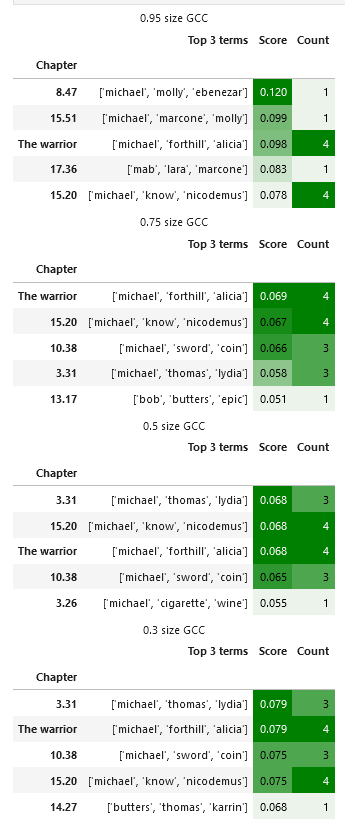

## Out-Degree

As with in-degree, high scores for out-degree would represent a node with many outgoing connections. Likely chapters earlier in the series, or perhaps chapters that mark one of the earliest appearances of a major character.

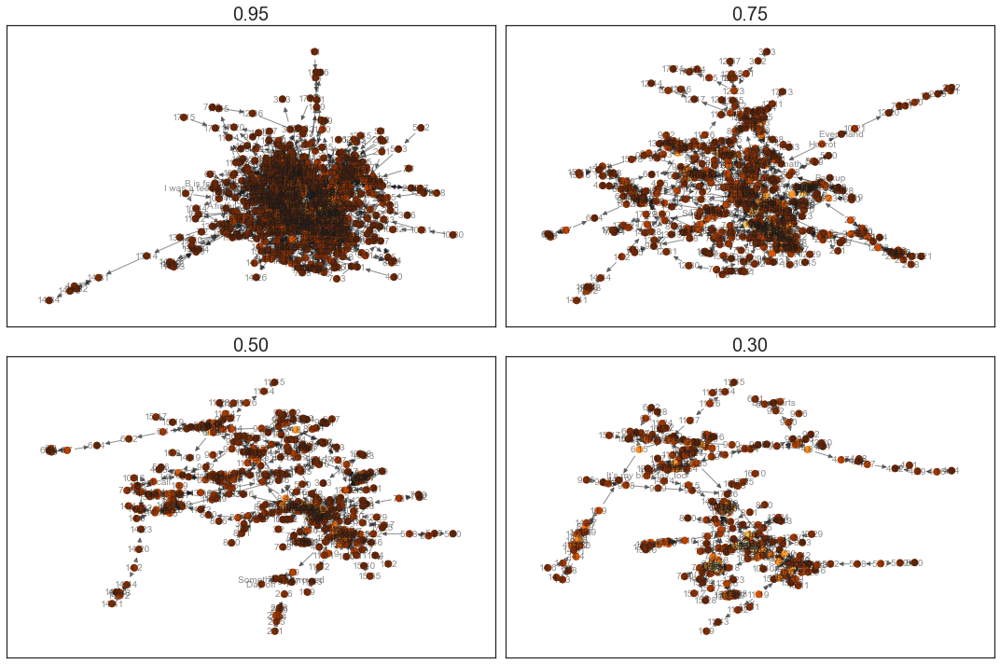

In [118]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

out_degrees = [list(nx.out_degree_centrality(g).values()) for g in DiGCCs.values()]

# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(DiGCCs.values(), out_degrees):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'OutDegree')

plot_graph_dict(DiGCCs, axes, graph_network_by_list, positions.values(), out_degrees)

<AxesSubplot:ylabel='Count'>

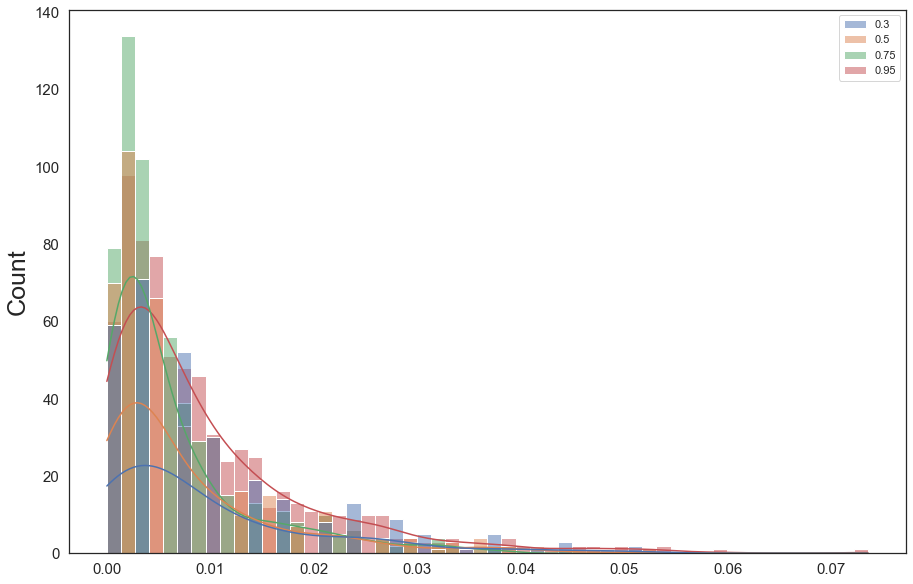

In [119]:
sns.histplot(pd.DataFrame(out_degrees, index = thresholds.keys()).T, kde=True)

In [120]:
print_top_n_centrality(nx.out_degree_centrality, 5, 3, DiGCCs, output_latex=False)

,Top 3 terms,Score,Count
Chapter,,,
8.47,"['michael', 'molly', 'ebenezar']",0.074,1
4.7,"['murphy', 'murph', 'album']",0.059,1
3.9,"['michael', 'forthill', 'church']",0.054,3
3.20,"['michael', 'charity', 'cemetery']",0.054,4
3.31,"['michael', 'thomas', 'lydia']",0.052,2


,Top 3 terms,Score,Count
Chapter,,,
1.8,"['bob', 'potion', 'potions']",0.037,3
2.7,"['bob', 'werewolves', 'wolf']",0.037,3
3.9,"['michael', 'forthill', 'church']",0.036,3
3.20,"['michael', 'charity', 'cemetery']",0.034,4
3.31,"['michael', 'thomas', 'lydia']",0.034,2


,Top 3 terms,Score,Count
Chapter,,,
1.8,"['bob', 'potion', 'potions']",0.052,3
2.7,"['bob', 'werewolves', 'wolf']",0.047,3
3.9,"['michael', 'forthill', 'church']",0.042,3
3.18,"['bob', 'dream', 'nightmare']",0.042,2
3.20,"['michael', 'charity', 'cemetery']",0.039,4


,Top 3 terms,Score,Count
Chapter,,,
1.8,"['bob', 'potion', 'potions']",0.051,3
2.7,"['bob', 'werewolves', 'wolf']",0.051,3
3.18,"['bob', 'dream', 'nightmare']",0.048,2
3.20,"['michael', 'charity', 'cemetery']",0.045,4
7.4,"['butters', 'phil', 'polka']",0.045,1


It's very interesting to see out-degree dominated more and more by Bob as the GCC gets smaller. Although I suppose I can see justifications as I did for in-degree. Perhaps it's more accurate to say that when the biased towards early chapters, bob had a stronger overall presence. While Michael was introduced in book 3, for books 1 and 2 Bob would likely be the strongest, most consistent reoccurring character.

Although now that I think of it perhaps I've focused too much on bob specifically. While yes, he is very important early on, it is probably also because chapters featuring him are effectively "turning points" in the narrative. Where many or all the threats of the book have been setup, and the majority of which will be knocked down as we progress through the rest of the book. These are probably some of the highest scoring nodes for degree in these early books. Therefore when we look at outdegree, which would be biased towards early books, we start to see them become more represented.

Thinking about these particular chapter having many connections in particular, with how they fit into the narrative, is bringing up the previous idea that the network structure consists of distinct clusters of chapters connected by boundary spanners. That eventually grow into a cohesive cluster with chapters that follow and explore disparate characters later on in the series.

## Pagerank

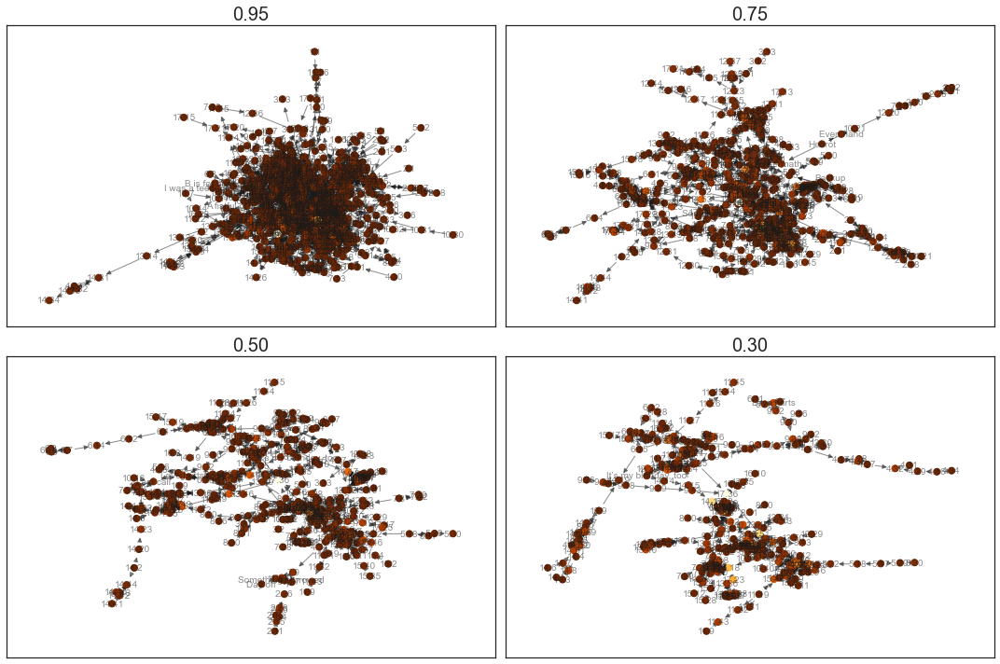

In [121]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

pageranks = [list(nx.pagerank(g).values()) for g in DiGCCs.values()]
# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(DiGCCs.values(), pageranks):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'Pagerank')

plot_graph_dict(DiGCCs, axes, graph_network_by_list, positions.values(), pageranks)

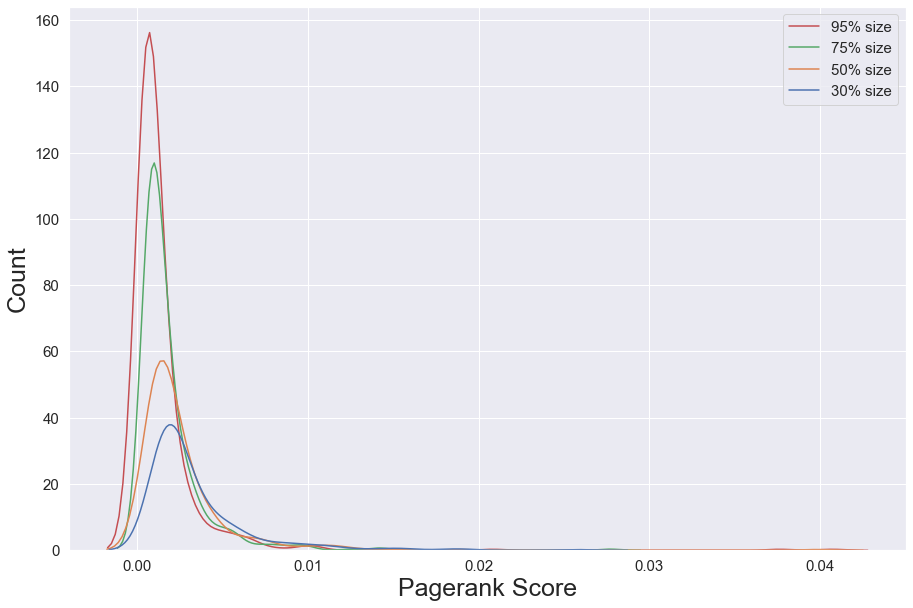

In [122]:
with sns.axes_style("darkgrid"):
    sns.kdeplot(data = pd.DataFrame(pageranks, index = thresholds.keys()).T)
    plt.gca().set_ylabel('Count')
    plt.gca().set_xlabel('Pagerank Score')
    plt.legend(['95% size', '75% size', '50% size', '30% size'],prop={'size': 15})
    plt.savefig(plot_output_folder / Path(f'pagerank dist.png'), bbox_inches='tight')

In [123]:
print_top_n_centrality(nx.pagerank, 5, 3, DiGCCs, extra_func = [('Final?', lambda chs, t: [is_final(ch) for ch in chs]),
                                                               ('Raw out degree', lambda chs, t: [score * (len(DiGCCs[t].nodes) - 1) for ch in chs for name, score in out_dict[t].items() if name == ch])],
                      output_latex=False)

,Top 3 terms,Score,Count,Final?,Raw out degree
Chapter,,,,,
17.36,"['mab', 'lara', 'marcone']",0.041,4,True,1.000000
Christmas Eve,"['kringle', 'christmas', 'maggie']",0.038,1,False,0.000000
15.51,"['michael', 'marcone', 'molly']",0.021,4,True,5.000000
16.18,"['butters', 'sanya', 'sword']",0.011,3,False,5.000000
17.35,"['justine', 'lara', 'mab']",0.010,1,False,1.000000


,Top 3 terms,Score,Count,Final?,Raw out degree
Chapter,,,,,
17.36,"['mab', 'lara', 'marcone']",0.028,4,True,0.000000
15.51,"['michael', 'marcone', 'molly']",0.014,4,True,2.000000
15.47,"['genoskwa', 'vault', 'michael']",0.014,1,False,0.000000
11.49,"['peabody', 'morgan', 'council']",0.013,1,True,0.000000
14.17,"['bob', 'demonreach', 'island']",0.010,3,False,0.000000


,Top 3 terms,Score,Count,Final?,Raw out degree
Chapter,,,,,
17.36,"['mab', 'lara', 'marcone']",0.040,4,True,0.000000
15.51,"['michael', 'marcone', 'molly']",0.019,4,True,1.000000
14.17,"['bob', 'demonreach', 'island']",0.015,3,False,0.000000
16.18,"['butters', 'sanya', 'sword']",0.013,3,False,2.000000
The warrior,"['michael', 'forthill', 'alicia']",0.012,1,False,4.000000


,Top 3 terms,Score,Count,Final?,Raw out degree
Chapter,,,,,
17.36,"['mab', 'lara', 'marcone']",0.026,4,True,0.000000
14.17,"['bob', 'demonreach', 'island']",0.019,3,False,0.000000
15.51,"['michael', 'marcone', 'molly']",0.019,4,True,1.000000
16.18,"['butters', 'sanya', 'sword']",0.016,3,False,1.000000
14.11,"['bob', 'maeve', 'mab']",0.015,1,False,1.000000


Still have a bug to fix here regarding the final book. As the "last" chapter is actually a side story. So 17.36 is the true last chapter, and 17.38 is the side story.

Pagerank has captured a few chapters I've previously highlighted as interesting within the graph. In particular 17.36 and 14.17, the "boundary spanners". I've included out degree as I suspected these chapters score well because they were "dead ends", and that certainly seems to be the case. I would suspect that as this graph effectively has no "loops", that the pagerank algorithm is funneled towards these dead ends.

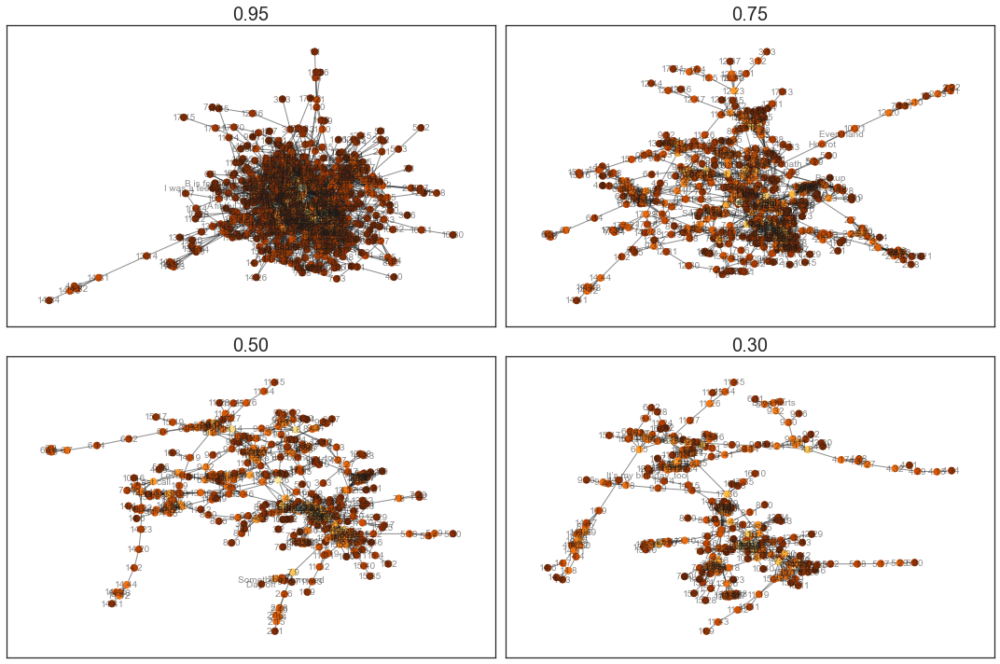

In [124]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

pageranks_undir = [list(nx.pagerank(g).values()) for g in GCCs.values()]

plot_graph_dict(GCCs, axes, graph_network_by_list, positions.values(), pageranks_undir)

## Longest Path

In [125]:
for digcc in DiGCCs.values():
    print(nx.algorithms.dag.dag_longest_path(digcc), '\n')

['3.1', '3.2', '3.5', '3.7', '3.9', '3.20', '3.21', '3.22', '3.23', '3.24', '3.25', '3.26', '3.28', '3.29', '3.30', '3.31', '3.32', '3.33', '3.39', '5.7', '5.11', '5.15', '5.18', '5.29', '5.30', '6.23', '6.28', '8.14', '9.2', '9.6', '9.10', '9.12', '9.19', '9.20', '9.21', '9.24', '9.25', '9.26', '9.27', '9.30', '9.36', '9.37', '9.38', '9.40', '9.43', 'It’s my birthday, too', '10.8', '10.14', '11.8', '11.10', '11.11', '11.12', '11.20', '11.21', '11.34', '11.35', '11.37', '11.38', '12.33', '12.39', '12.41', '12.42', '12.44', '12.45', '12.46', '12.47', '12.49', 'Aftermath', '13.18', '13.46', '13.48', '13.49', '14.13', '14.14', '14.15', '14.19', '14.20', '14.23', '14.27', '14.28', '14.40', '15.6', '15.7', '15.9', '15.10', '15.11', '15.12', '15.15', '15.21', '15.22', '15.25', '15.26', '15.29', '15.30', '15.31', '15.32', '15.33', '15.34', '15.37', '15.38', '15.39', '15.40', '15.42', '15.43', '15.45', '15.46', '15.47', '15.48', '15.49', '15.50', '15.51', '16.18', '17.16', '17.17', '17.19', '1

In [126]:
longest_paths = [list(nx.algorithms.dag.dag_longest_path(g)) for g in DiGCCs.values()]
node_in_longest_paths = [[(node in path) for node in g] for g, path in zip(DiGCCs.values(), longest_paths)]

# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(DiGCCs.values(), node_in_longest_paths):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'LongestPath')

In [127]:
# Add "in longest path" as attribute
for g, p in zip(GCCs.values(), longest_paths):
    for node in g.nodes(data=True):
        if node[0] in p:
            node[1]['In_Longest'] = 1
        else:
            node[1]['In_Longest'] = 0

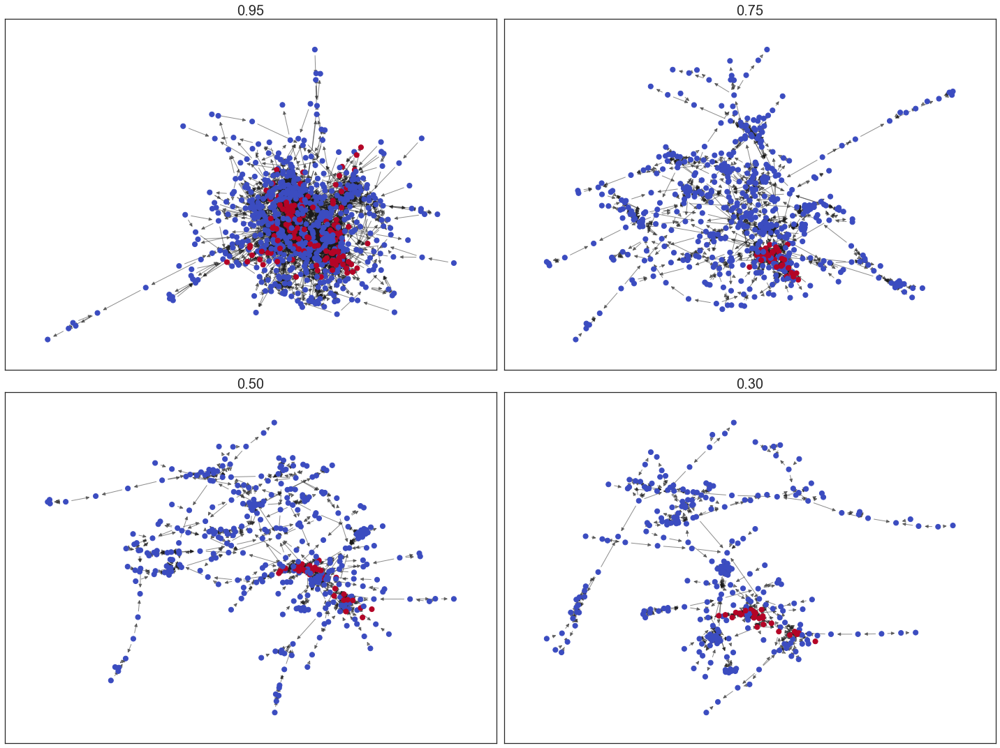

In [128]:
fig, axes = plt.subplots(2,2, figsize=(20,15))

plot_graph_dict(DiGCCs, axes, graph_network_by_list, positions.values(), node_in_longest_paths, {'cmap' : sns.color_palette("coolwarm", as_cmap=True), 'with_labels' : False})

Here red nodes indicate nodes that lie on the longest path.

It's instantly clear that, atleast for everything except the 0.95 GCC, that these paths more or less exist within a single "area" of the graph. They do not traverse any great distances. On further inspection, these paths are almost identical save for one or two nodes. So we effectively have a longest path for the 0.95 size GCC, and a path for all the other GCCs. If we take a look at the 0.75 size path a bit closer:

In [129]:
i = 1

display(pd.DataFrame([get_top_n_tfidf(node, n, False) for node in longest_paths[i]], index=longest_paths[i])
        .style.applymap(lambda term, props='': props if term == 'michael' else None,
                        props='color:white;background-color:green'))

,0,1,2,3,4
3.1,michael,love,beetle,cloak,sack
3.5,michael,ghost,agatha,rift,spirit
3.9,michael,forthill,church,father,lydia
3.20,michael,charity,cemetery,graceland,van
3.21,nightmare,charity,michael,rain,lea
3.22,michael,kravos,stallings,book,demon
3.24,michael,bianca,thomas,truck,party
3.25,michael,kyle,kelly,courtyard,scarlet
3.26,michael,cigarette,wine,thomas,venom
3.28,mavra,michael,susan,basket,garlic


It becomes very obvious that this path is effectively following a single character. If we look at the number of times "michael" appears in each book:

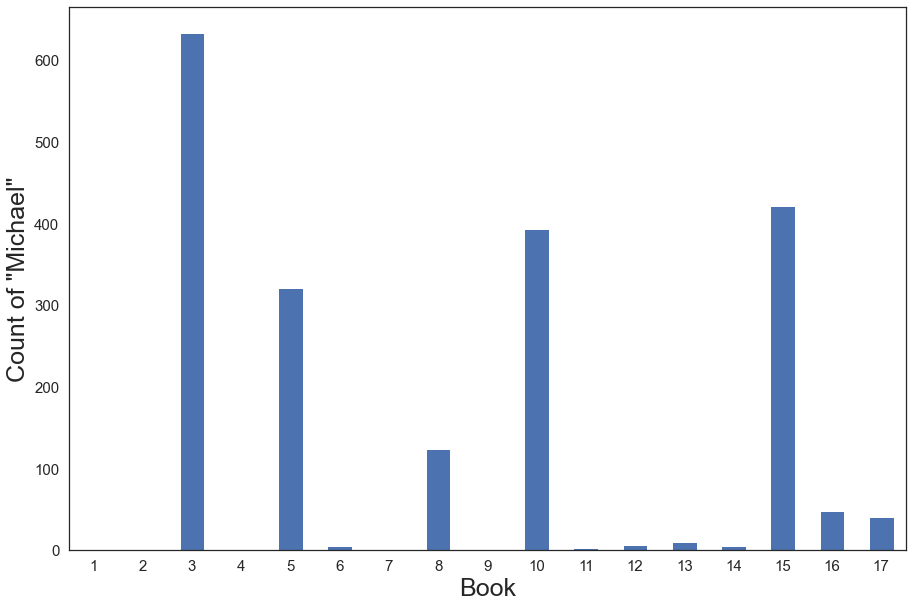

In [130]:
pd.Series([sum([ch.count('Michael') for ch in doc]) for doc in docs.values()], index=range(1,18)).plot.bar()
plt.gca().set_xlabel('Book')
plt.gca().set_ylabel('Count of "Michael"')
plt.xticks(rotation=0);
plt.savefig(plot_output_folder / Path(f'michael_count.png'), bbox_inches='tight')

Comparing the books with a presence in our longest path (3, 5, 10, and 15), these are books where Michael is present in a major way. This also actually highlights a strong reason for why he may have such a strong presence in our network relative to other main characters. If we create similar output for some of the other primary characters:

<AxesSubplot:>

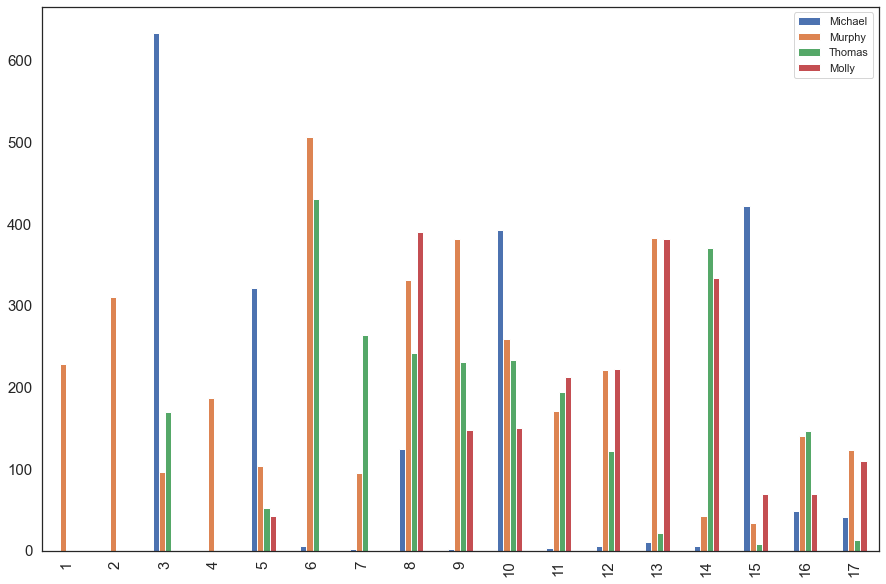

In [131]:
plot_data = []
targets = ['Michael', 'Murphy', 'Thomas', 'Molly']
for c in targets:
    plot_data.append([sum([ch.count(c) for ch in doc]) for doc in docs.values()])

pd.DataFrame(plot_data, index = targets, columns = range(1, 18)).T.plot.bar()

Here it becomes obvious that the other primary characters have a much more consistently large presence throughout the series, while Michael is important in fewer books, but has a major role when he is important. It makes a lot of sense then why he seems to be favored by TFIDF, as it will penalize terms frequent throughout the overall corpus.

Going back to the path itself, It seems to have done a good job of effectively cataloging the major "beats" of the story that feature Michael. The only differences between the 0.75, 0.5, and 0.3 paths are the absence of a handful of chapters. For example the 0.3 path starts at 3.7 instead of 3.1, however it still continues on through the same general chapters in books 3, 5, 10, and 15.

As for the 0.95 size path, it starts in the same way, following Michael from book 3 to 5, it then however starts to travel through adjacent characters, or to follow consecutive chapters. In general it's much less consistent, which may be a consequence of the more relaxed similarity required for an edge.

In [132]:
from collections import Counter

def top_n_for_longest_path(i=0, n=5, k=10, latex=False):
    plot_data = [get_top_n_tfidf(node, n, False) for node in longest_paths[i]]
    top_10_in_path = [name for name, score in Counter(list(chain(*plot_data))).most_common(k)]
    
    colors = sns.color_palette("hls", n_colors=k).as_hex()
    
    # https://stackoverflow.com/questions/29643352/converting-hex-to-rgb-value-in-python
    # https://stackoverflow.com/questions/3942878/how-to-decide-font-color-in-white-or-black-depending-on-background-color
    text = []
    for c in colors:
        r, g, b = tuple(int(c.lstrip('#')[i:i+2], 16) for i in (0, 2, 4))
        if (r*0.299 + g*0.587 + b*0.114) > 186:
            output = '#000000'
        else:
            output = '#ffffff'
        text.append(output)
    
    def path_style(term, props=''):
        for name, colour, t in zip(top_10_in_path, colors, text):
            if term == name:
                return f'color:{t};background-color:{colour}'
    
    table = (pd.DataFrame(plot_data, index=longest_paths[i])
            .style
            .applymap(path_style))
    
    if latex:
        print(table.to_latex(convert_css=True))
    else:
        display(table)

In [133]:
top_n_for_longest_path(0, 5, 10)

,0,1,2,3,4
3.1,michael,love,beetle,cloak,sack
3.2,agatha,michael,ghost,hagglethorn,infant
3.5,michael,ghost,agatha,rift,spirit
3.7,michael,susan,righteous,charity,important
3.9,michael,forthill,church,father,lydia
3.20,michael,charity,cemetery,graceland,van
3.21,nightmare,charity,michael,rain,lea
3.22,michael,kravos,stallings,book,demon
3.23,michael,nightmare,circle,spell,copper
3.24,michael,bianca,thomas,truck,party


An interesting potential application of paths could be to build a list of the longest paths, then to select the longest path which heavily features a particular character. It might be possible to build a list of chapters representing the "highlights" of any arbitrary character.

In [134]:
top_n_for_longest_path(3, 5, 5, True)

\begin{tabular}{llllll}
{} & {0} & {1} & {2} & {3} & {4} \\
3.7 & \color[HTML]{FFFFFF} {\cellcolor[HTML]{DB5F57}} michael & susan & righteous & charity & important \\
3.9 & \color[HTML]{FFFFFF} {\cellcolor[HTML]{DB5F57}} michael & forthill & church & father & lydia \\
3.20 & \color[HTML]{FFFFFF} {\cellcolor[HTML]{DB5F57}} michael & charity & cemetery & graceland & van \\
3.24 & \color[HTML]{FFFFFF} {\cellcolor[HTML]{DB5F57}} michael & \color[HTML]{FFFFFF} {\cellcolor[HTML]{C957DB}} bianca & thomas & truck & party \\
3.25 & \color[HTML]{FFFFFF} {\cellcolor[HTML]{DB5F57}} michael & kyle & kelly & courtyard & scarlet \\
3.26 & \color[HTML]{FFFFFF} {\cellcolor[HTML]{DB5F57}} michael & cigarette & wine & thomas & venom \\
3.29 & \color[HTML]{FFFFFF} {\cellcolor[HTML]{C957DB}} bianca & \color[HTML]{FFFFFF} {\cellcolor[HTML]{DB5F57}} michael & mavra & dias & justine \\
3.30 & \color[HTML]{FFFFFF} {\cellcolor[HTML]{C957DB}} bianca & \color[HTML]{FFFFFF} {\cellcolor[HTML]{DB5F57}} michael & tho

In [135]:
i = 1
n = 5
k = 5

plot_data = [get_top_n_tfidf(node, n, False) for node in longest_paths[i]]
top_10_in_path = [name for name, score in Counter(list(chain(*plot_data))).most_common(k)]

# https://stackoverflow.com/questions/3380726/converting-a-rgb-color-tuple-to-a-six-digit-code
colors = []
for c in sns.color_palette("tab10", n, as_cmap=True).colors:
    colors.append('#%02x%02x%02x' % tuple([round(255 * v) for v in c]))

# https://stackoverflow.com/questions/3942878/how-to-decide-font-color-in-white-or-black-depending-on-background-color
# Automatically pick a text color based on BG color
text = []
for c in sns.color_palette("tab10", n, as_cmap=True).colors:
    r, g, b = c
    if (r*0.299 + g*0.587 + b*0.114) > 186:
        output = '#000000'
    else:
        output = '#ffffff'
    text.append(output)

def path_style(term, props=''):
    for name, colour, t in zip(top_10_in_path, colors, text):
        if term == name:
            return f'color:{t};background-color:{colour}'

table = (pd.DataFrame(plot_data, index=longest_paths[i])
        .style
        .applymap(path_style))
        
# display(table)
# print(table.to_latex(convert_css=True))

# TRY LONGEST PATH STARTING FROM CHARACTER INTRODUCTION?

In [136]:
save_graphs(DiGCCs, "Directed")

# Community

[Primary reference](https://towardsdatascience.com/community-detection-algorithms-9bd8951e7dae)

My reference articles covers 4 methods of community detection. And I see no reason not to try all of them out.

1. Louvain
    * Uses modularity to try and "maximize the difference between the actual number of edges in a community and the expected number of edges in the community."
    * Popular for ease of implementation and speed
1. Surprise
    * Instead of modularity uses "a measure based on classical probabilities known as Surprise [...] to evaluate the quality of a partition of a network into communities"
    * "Works well in the limit of many small communities" compared to modularity based detection which "works well in the limit of a few large communities"
1. Leiden
    * A response to Louvain claiming that "Louvain has a tendency to discover very weekly connected communities".
    * Uses the "much faster Leiden algorithm which guarantees that communities are well connected"
1. Walktrap
    * Uses random walks, with the basic idea that "random walks on a graph/ network tend to get trapped into densely connected parts corresponding to communities."

After some initial experimentation, the results for Leiden are (perhaps unsurprisingly) quite similar to Louvain, So I won't worry about looking at Louvain for now. If we quickly just have a look at the number of communities each method finds for each graph:

In [137]:
communities = {}
for com, alg in [('Surprise', algorithms.surprise_communities), ('Leiden', algorithms.leiden), ('Walktrap', algorithms.walktrap)]:
    communities[com] = {t : alg(g) for t, g in GCCs.items()}

In [138]:
plot_data = {}
for method in communities.keys():
    plot_data[method] = []
    for t, com in communities[method].items():
        min_c, max_c = min([len(c) for c in com.communities]), max([len(c) for c in com.communities])
        mean_c = np.mean([len(c) for c in com.communities])
        plot_data[method].append([len(com.communities), min_c, max_c, mean_c])
    print(pd.DataFrame(plot_data[method], columns=['n coms', 'min size', 'max_size', 'mean_size'], index=GCCs.keys()).to_latex())

\begin{tabular}{lrrrr}
\toprule
{} &  n coms &  min size &  max\_size &  mean\_size \\
\midrule
0.95 &     112 &         1 &        52 &   6.321429 \\
0.75 &      90 &         1 &        35 &   5.944444 \\
0.50 &      71 &         1 &        27 &   5.394366 \\
0.30 &      50 &         1 &        28 &   5.860000 \\
\bottomrule
\end{tabular}

\begin{tabular}{lrrrr}
\toprule
{} &  n coms &  min size &  max\_size &  mean\_size \\
\midrule
0.95 &      17 &         5 &        98 &  41.647059 \\
0.75 &      18 &         3 &        59 &  29.722222 \\
0.50 &      17 &         4 &        60 &  22.529412 \\
0.30 &      14 &         8 &        48 &  20.928571 \\
\bottomrule
\end{tabular}

\begin{tabular}{lrrrr}
\toprule
{} &  n coms &  min size &  max\_size &  mean\_size \\
\midrule
0.95 &      57 &         2 &       110 &  12.421053 \\
0.75 &      54 &         2 &        57 &   9.907407 \\
0.50 &      44 &         2 &        52 &   8.704545 \\
0.30 &      31 &         2 &        46 &   9.451613 \

So walktrap and suprise found an overwhelming number of communities, some of which have as few as one or two chapters. While Leiden generally chose much larger communities. I can imagine a number of meaningful ways chapters could be divided into communities, so let's take a deeper dive into each to see what they've found.

In [139]:
# How hideous is the dict of dicts of dicts?
# Doing this process such that I can use my previous workflow to visualize the communities
# I could use the built in viz functions for cdlib but I couldn't get them to work as subplots
community_dicts = {}
for method in communities.keys():
    community_dicts[method] = {}
    for t, com in communities[method].items():
        community_dicts[method][t] = {}
        for idx, com in enumerate(com.communities):
            for ch in com:
                community_dicts[method][t][ch] = idx

Building community graphs

In [140]:
def build_community_network(g, coms):
    community_network = nx.Graph()
    # Build nodes
    for idx, com in enumerate(coms):
        community_network.add_node(idx, nodes = com) # Add member nodes as attribute
        community_network.nodes[idx]['Top Terms'] = ', '.join(get_top_n_tfidf(com, 2))
    # Build edges
    for a, b in combinations(community_network.nodes(), 2): # loop through all combinations of two nodes
        b_nodes = community_network.nodes[b]['nodes']
        n_edges = 0
        for member_node in community_network.nodes[a]['nodes']: # Check all nodes in a
            n_edges += sum(x in b_nodes for x in list(g.adj[member_node].keys())) # Calculate edge weight
            
        if n_edges > 0:
            community_network.add_edge(a, b, weight=n_edges)
    return community_network

In [141]:
community_graphs = {}
for method in communities.keys():
    community_graphs[method] = {}
    for t, com in communities[method].items():
        community_graphs[method][t] = build_community_network(GCCs[t], com.communities)

In [142]:
# gephi seems to not like complicated data types like "lists" for attributes
# Need to make a copy without this information, I'll replace the list of nodes with the number of nodes
community_graphs_gephi = {}
for method in community_graphs.keys():
    community_graphs_gephi[method] = {}
    for t, g in community_graphs[method].items():
        community_graphs_gephi[method][t] = copy.deepcopy(community_graphs[method][t])
        for node in community_graphs_gephi[method][t].nodes(data=True):
            node_count = len(node[1]['nodes'])
            node[1]['nodes'] = node_count
            node[1]['com_index'] = node[0]

for method in communities.keys():
    save_graphs(community_graphs_gephi[method], f"{method} Communities")

## Leiden

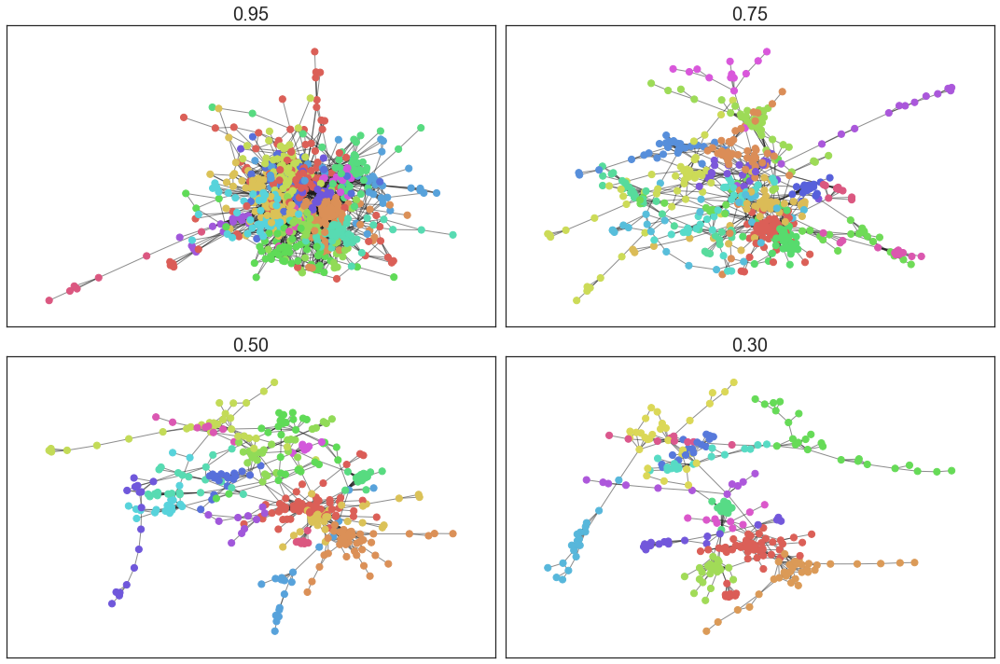

In [143]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

leiden_mapping = [[community_dicts['Leiden'][t][ch] for ch in g.nodes()] for t, g in GCCs.items()]
# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(GCCs.values(), leiden_mapping):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'Leiden')

plot_graph_dict(GCCs, axes, graph_network_by_list, positions.values(), leiden_mapping,
                kwargs = {'cmap' : sns.color_palette("hls", as_cmap=True),
                          'with_labels' : False})

Here nodes are highlighted by community, Nodes that are near each other are of course within the same community. It's hard to discern much when looking at the entire graph however. We can instead represent the communities where each node is a community, and an edge between communities represents an edge between nodes within both communities.

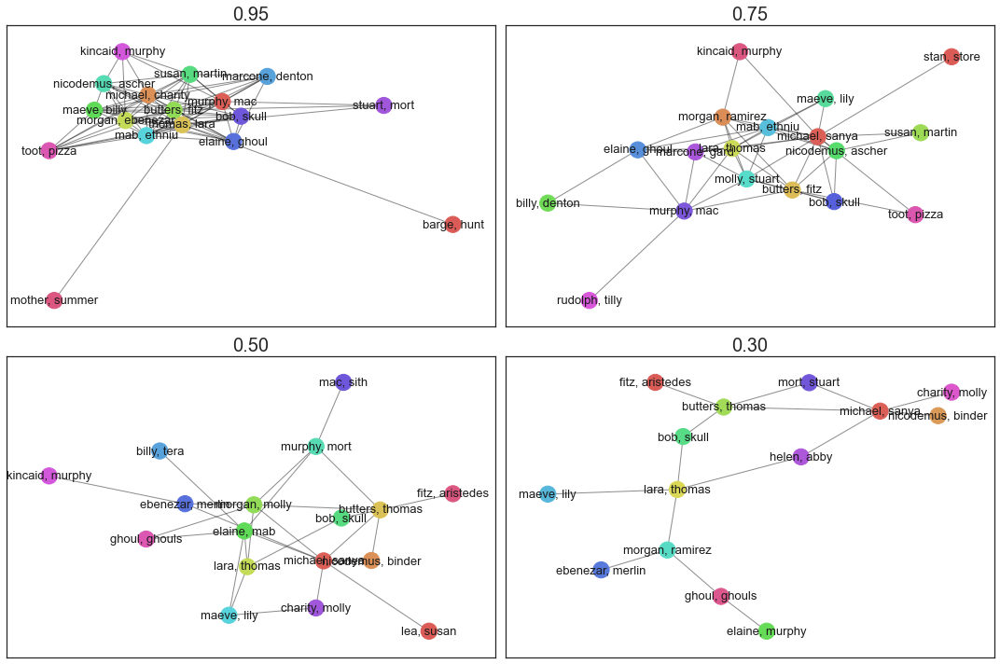

In [144]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

community_leiden_colors = [[node for node in g.nodes()] for t, g in community_graphs['Leiden'].items()]
community_graph_kwargs = {'cmap' : sns.color_palette("hls", as_cmap=True),
                          'label_by_attribute' : 'Top Terms', 'label_alpha' : 1, 'font_size' : 13, 'node_size' : 300}

plot_graph_dict(community_graphs['Leiden'], axes, graph_network_by_list, None, community_leiden_colors,
                kwargs = community_graph_kwargs)

Here the communities have been annotated with the top two average terms. At a glance I would suspect that nodes either represent "factions" of characters that are frequently associated with each other. or particular books. Let's try investigate this by plotting how each community is distributed across the books:

In [145]:
def plot_com_prop_book(community, ax=None, normalize=True, filter_func = None):
    com_book = pd.DataFrame(columns=sorted(set(ch_book)))
    for idx, com in enumerate(community.communities):
        values = (pd.merge(pd.DataFrame(zip(names, ch_book), columns=['Chapter', 'Book']),
                           pd.DataFrame(com, columns=['Chapter']))
                 ['Book'].value_counts(normalize=normalize))
        com_book.loc[idx] = values
        
    if filter_func != None:
        com_book = filter_func(com_book)
    com_book.fillna(0).plot.barh(stacked=True, cmap=sns.color_palette('hls', as_cmap=True), ax=ax)
    ax.get_legend().remove()
    ax.set_yticklabels([', '.join(get_top_n_tfidf(com, 2)) for com in # Get top two terms for communities in com_book after any potential filtering
                        [c for i, c in enumerate(community.communities) if i in com_book.index]])

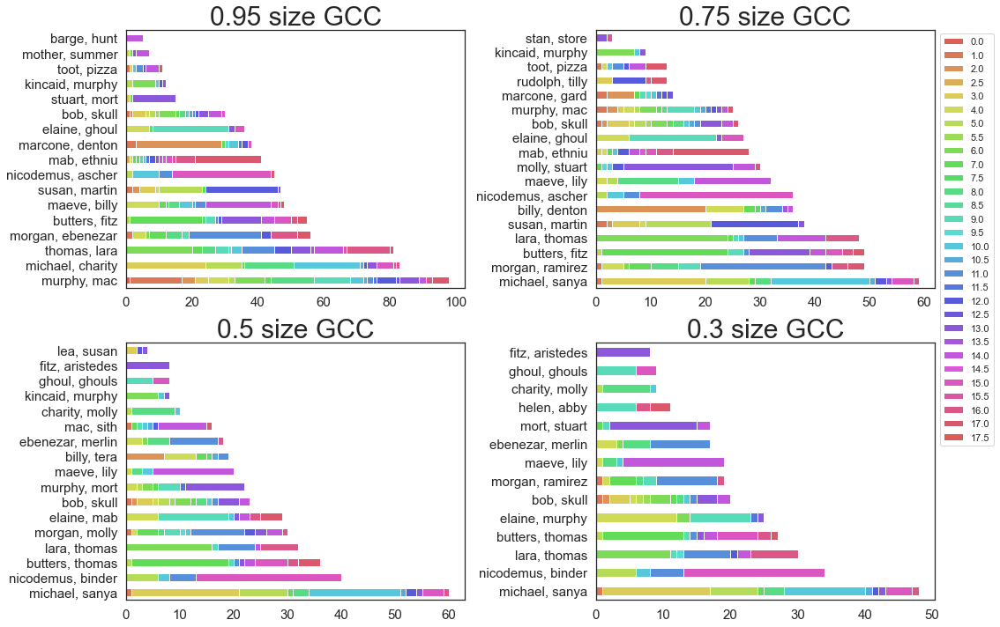

In [146]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

for (t, com), ax in zip(communities['Leiden'].items(), axes.flatten()):
    plot_com_prop_book(com, ax, False)
    ax.set_title(f'{t} size GCC')
plt.tight_layout()
plt.legend(loc='center left', bbox_to_anchor=(1.0, 1.4))
plt.savefig(plot_output_folder / Path(f'leiden dist.png'), bbox_inches='tight');

There's an interesting distinction here between the 0.95 size network and the rest. Note that, matching trends so far the community featuring Michael is the largest for all networks, except for the 0.95 where instead "murphy, stuart" is the most prevalent. Stuart is only present for a single book "Ghost Story", book 13. And while we do see quite a large presence of that book in the community, the vast majority is quite evenly spread throughout the entire series. With perhaps a bias towards the first book in particular.

As previously highlighted "Murphy" is a character with a consistently strong presence. Perhaps because of the penalties applied to consistently appearing terms, her contribution to many edges is significantly diminished as the threshold moves from quite lenient at the 0.95 size to something a bit more discerning as we get smaller.

Looking at the communities in general, They seem to be grouped by either a common character, or a particular "event" in the series. By event I mean a particular book, or subset of chapters within a book. I would hypothesis that communities that span many books, look to be focused on characters. For the majority of these communities both of the top two average terms are characters that co-appear very frequently throughout the series or share a large event in common. for example "Sanya" and "charity" both appear almost exclusively alongside "Michael", while "nicodemus" and "binder" are major characters in the 15th book.

As for communities that seem to focus more on individual events, it may be more accurate that they appear to focus on "minor" characters as these typically look to be the smaller communities. For example there are a few instances of communities that feature only a single book. "barge, hunt" in the 0.95, "fitz, aristedes" in the smaller graphs.

## Surprise

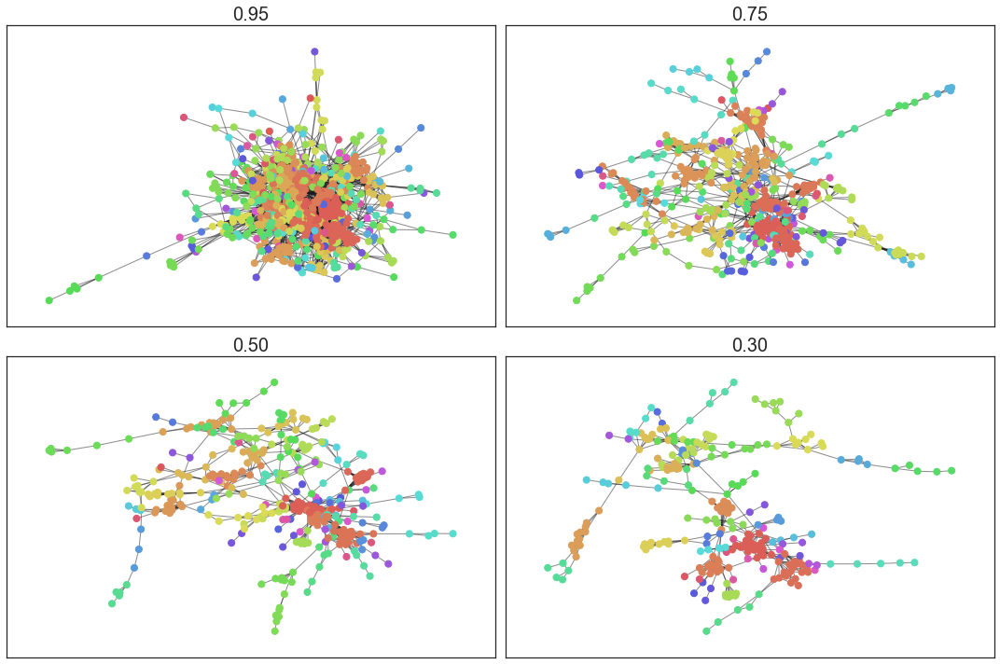

In [147]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

surprise_mapping = [[community_dicts['Surprise'][t][ch] for ch in g.nodes()] for t, g in GCCs.items()]
# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(GCCs.values(), surprise_mapping):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'Surprise')

plot_graph_dict(GCCs, axes, graph_network_by_list, positions.values(), surprise_mapping,
                kwargs = {'cmap' : sns.color_palette("hls", as_cmap=True),
                          'with_labels' : False})

As we saw before, surprise has much more granularity in community detection compared to leiden, there's an almost overwhelming number of communities. 

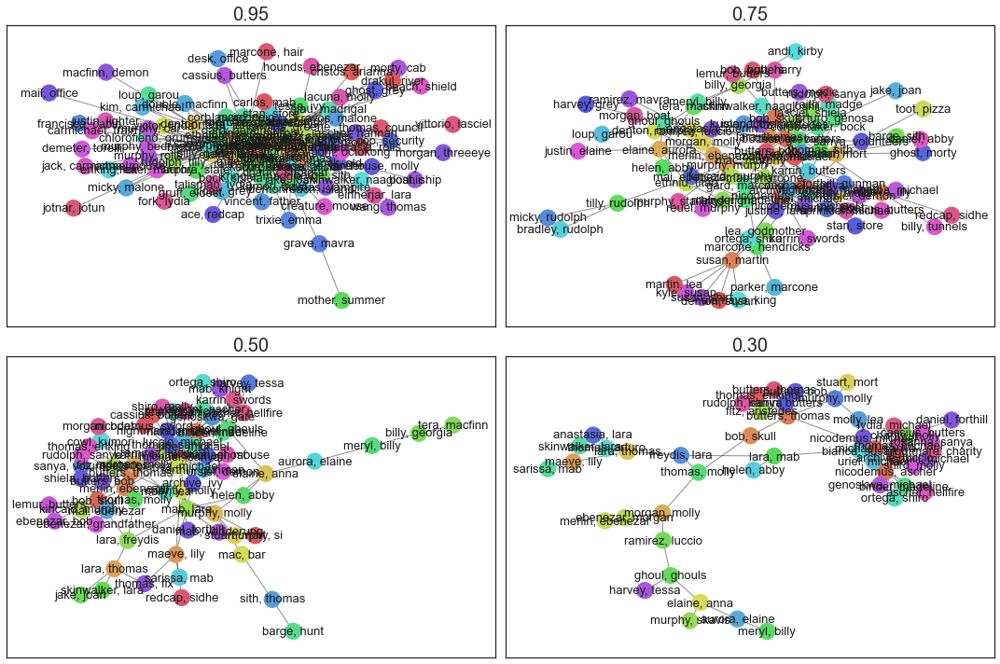

In [148]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

community_surprise_colors = [[node for node in g.nodes()] for t, g in community_graphs['Surprise'].items()]

plot_graph_dict(community_graphs['Surprise'], axes, graph_network_by_list, None, community_surprise_colors,
                kwargs = community_graph_kwargs)

Even simplifying down to the community level, it's very difficult to discern much structure. Although for the smallest graph in particular we can see some nice structure where communities are branching off a collection of central communities.

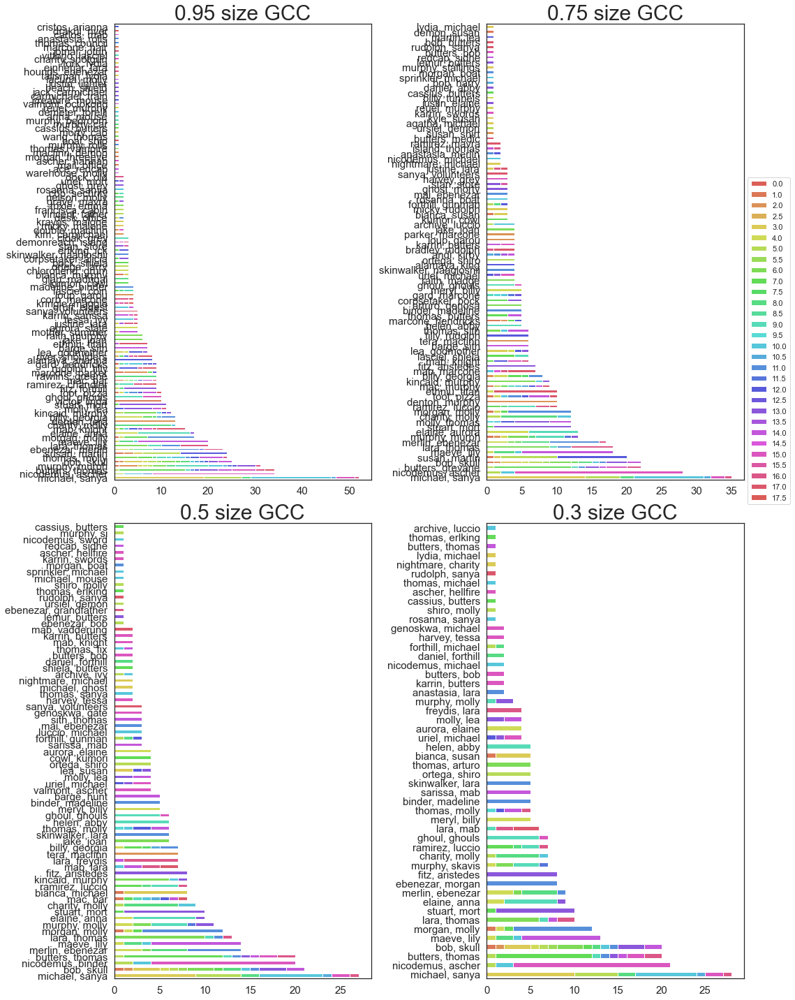

In [149]:
fig, axes = plt.subplots(2,2, figsize=(15,20))

for (t, com), ax in zip(communities['Surprise'].items(), axes.flatten()):
    plot_com_prop_book(com, ax, False)
    ax.set_title(f'{t} size GCC')
plt.tight_layout()
plt.legend(loc='center left', bbox_to_anchor=(1.0, 1.4))
plt.savefig(plot_output_folder / Path(f'surprise dist.png'), bbox_inches='tight');

One big consequence of the larger number of communities found is that many of these belong to a single book. While it could be interesting to look at the separation of chapters within a single book, when looking at the entire corpus it's not terribly illuminating. Let's try the same output conditioning on communities that belong to more than one book.

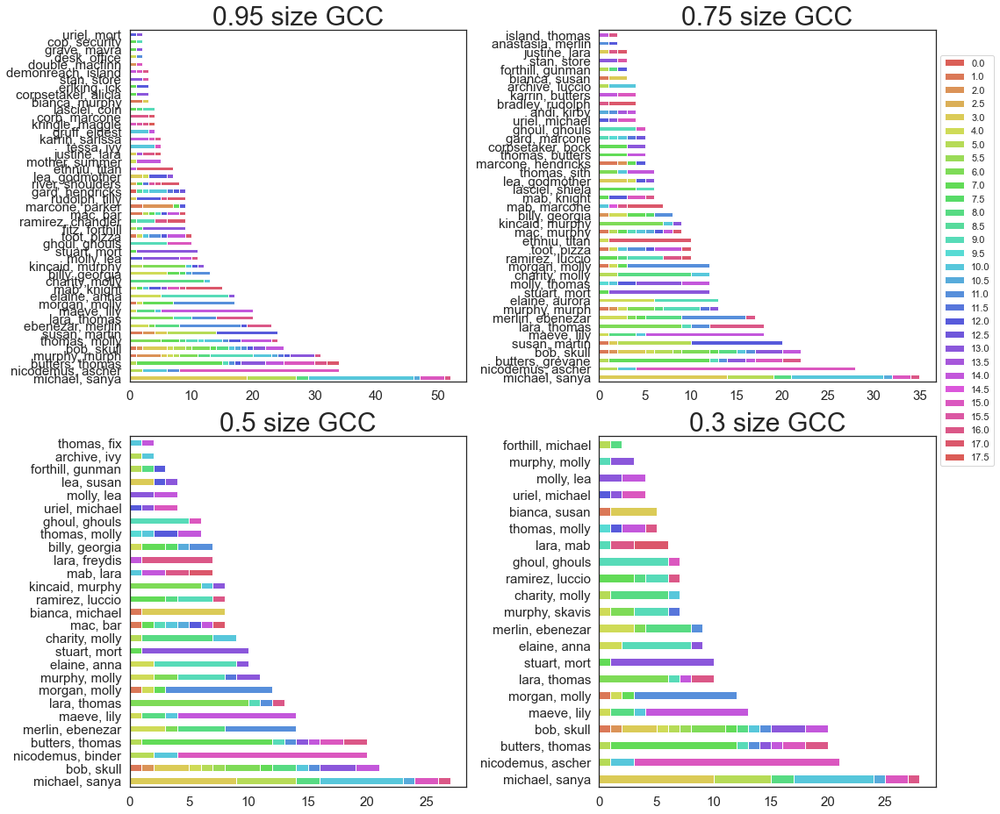

In [150]:
filter_func = lambda df: df.loc[(len(df.columns) - df.isnull().sum(axis=1)) > 1]

fig, axes = plt.subplots(2,2, figsize=(15,13))

for (t, com), ax in zip(communities['Surprise'].items(), axes.flatten()):
    plot_com_prop_book(com, ax, False, filter_func=filter_func)
    ax.set_title(f'{t} size GCC')
plt.tight_layout()
plt.legend(loc='center left', bbox_to_anchor=(1.0, 1.5));

After filtering out "mono-book" communities, these results look very similar to what we saw for Leiden. Although while these communities look to represent a similar kind of "grouping" they are much smaller because of all the communities we've filtered out. Thinking about it like that, these may represent a more "pure" version of the same communities Leiden found. With some of the more fringe chapters "pruned" into their own communities.

For example, recall that before the top community for 0.95 was "Murphy, Stuart". Instead it looks like we have that same community split into "Murphy, Murph",and "Stuart, Mort". Considering that Stuart and Murphy have effectively no meaningful relation, this seems like a more informative representative grouping.

## Walktrap

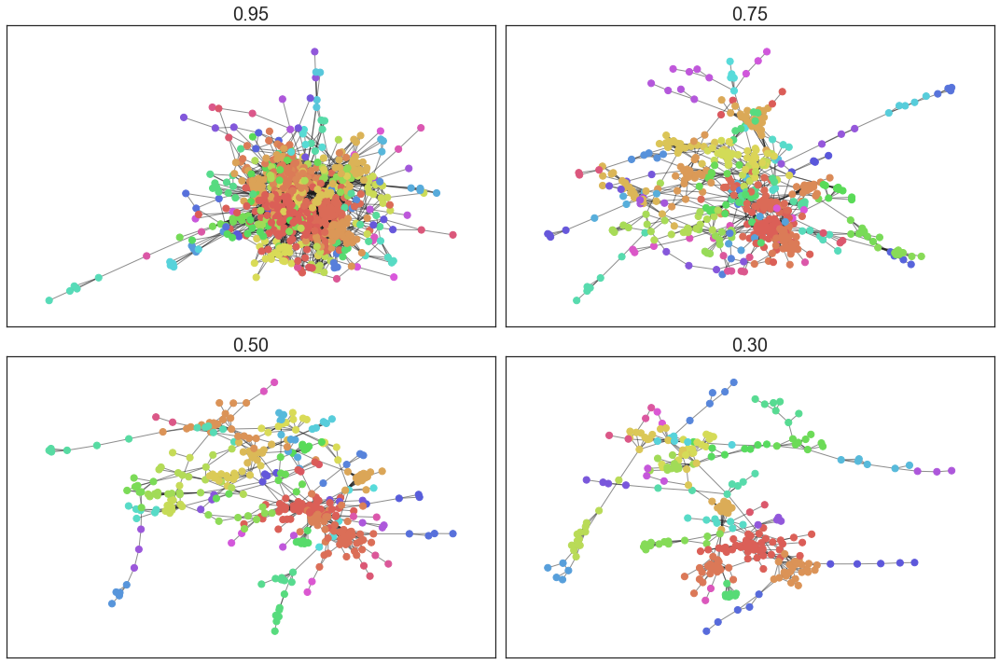

In [151]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

walktrap_mapping = [[community_dicts['Walktrap'][t][ch] for ch in g.nodes()] for t, g in GCCs.items()]
# Writing as node attribute for reuse in gephi later
# Ideally I would of done this from the start, as it is I'm relying on everything being in the same order
# There's no reason I can see why they wouldn't be, as they're derived from the same place. But it's a bad practise
# If time allows I should rewrite all my code to use attributes instead of lists, and then writing attributes from those lists.
for g, c in zip(GCCs.values(), walktrap_mapping):
    nx.set_node_attributes(g, {key : value for key, value in zip(g.nodes(), c)}, 'Walktrap')

plot_graph_dict(GCCs, axes, graph_network_by_list, positions.values(), walktrap_mapping,
                kwargs = {'cmap' : sns.color_palette("hls", as_cmap=True),
                          'with_labels' : False})

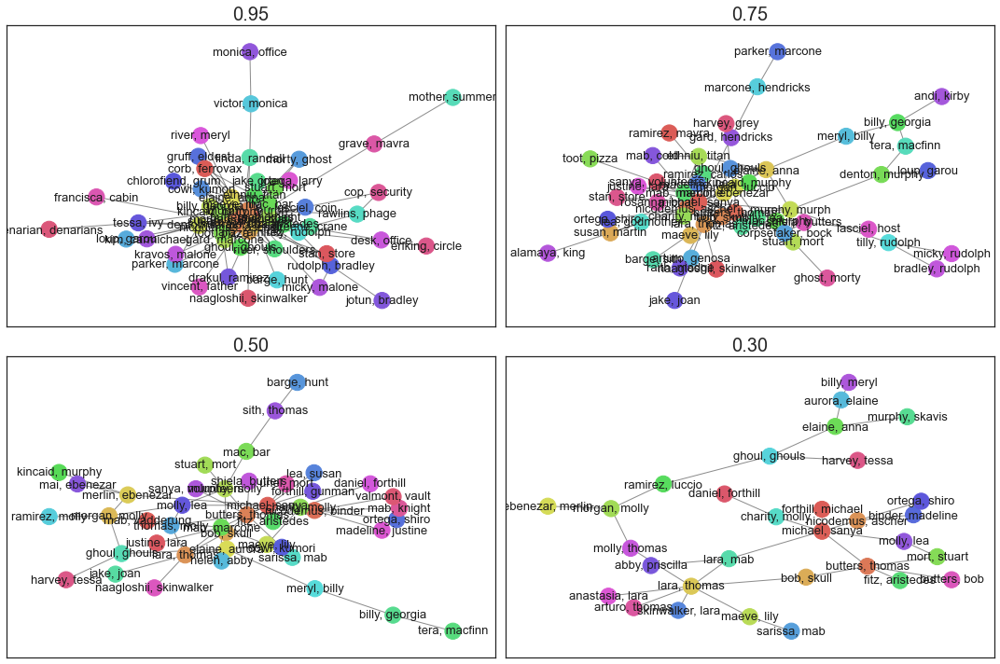

In [152]:
fig, axes = plt.subplots(2,2, figsize=(15,10))

community_walktrap_colors = [[node for node in g.nodes()] for t, g in community_graphs['Walktrap'].items()]

plot_graph_dict(community_graphs['Walktrap'], axes, graph_network_by_list, None, community_walktrap_colors,
                kwargs = community_graph_kwargs)

Recall that compared to Surprise, the number of communities for Walktrap is much more stable. While it's certainly still quite complex, compared to looking at the community graphs for Surprise, it's much easier to observe patterns here. In general there look to be more long "chains" of nodes with Walktrap while Surprise had very hairy "clusters" of nodes.

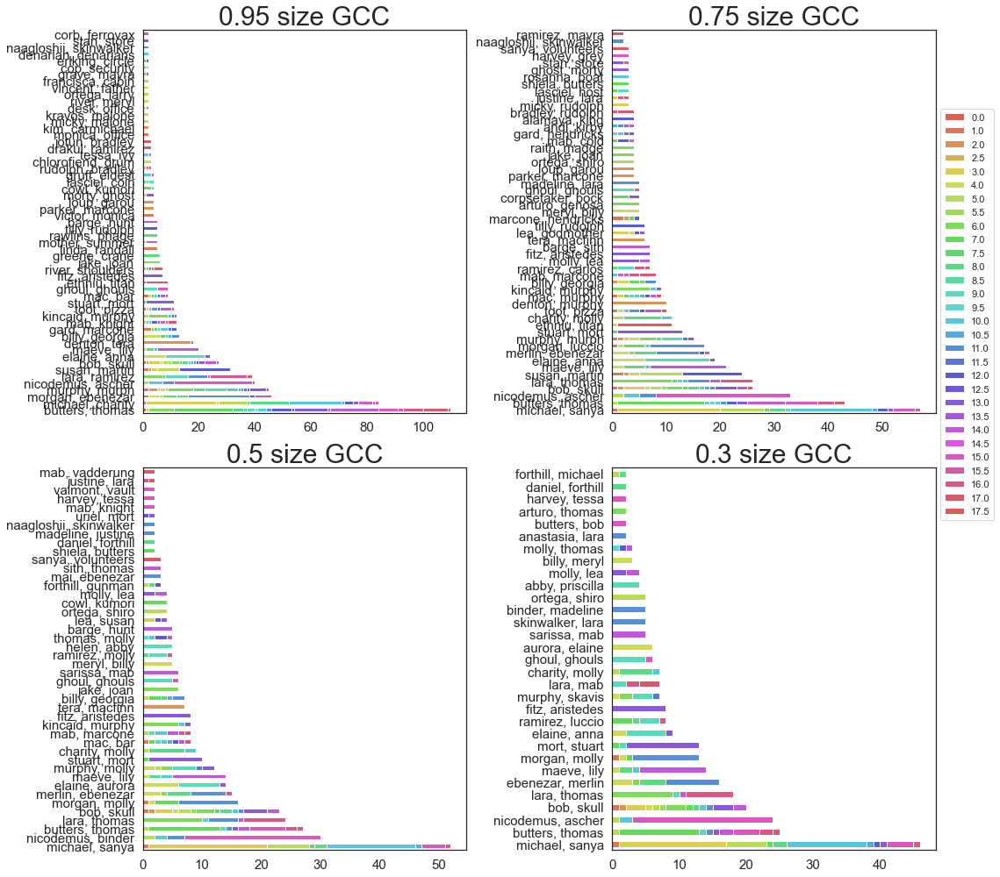

In [153]:
fig, axes = plt.subplots(2,2, figsize=(15,14))

for (t, com), ax in zip(communities['Walktrap'].items(), axes.flatten()):
    plot_com_prop_book(com, ax, False)
    ax.set_title(f'{t} size GCC')
plt.tight_layout()
plt.legend(loc='center left', bbox_to_anchor=(1.0, 1.4))
plt.savefig(plot_output_folder / Path(f'walktrap dist.png'), bbox_inches='tight');

Looking at the distribution across books, the communities look more diverse in general compared to Surprise. While the smaller communities tend to be focused on a single book, it's much better than it was when looking at Surprise. Although overall the distributions and top terms for these communities look very similar if not identical to Surprise, particularly the pruned version.

## Further analysis on community networks

Considering that these community networks are just that, networks. We could look at all the same centralities and scores we looked at on the raw graph, on these processed community graphs. Considering that these community groupings seem to effectively be "character" groupings, the comparisons to "Social network analysis" may be even more apt than previously.

In [154]:
save_graphs(GCCs, "Undirected")

# -------------------

Previously Surprise and Walk trap found a massive amount of communities, some with not even a handful of chapters. To keep things a bit more manageable for now I won't worry about using them. Between Louvain and Leiden, it seems like Leiden is a more refined extension of Louvain. Considering the results I got with Louvain and Leiden were incredibly similar, I'll restrict myself to Leiden for now.

In [155]:
leiden_com = algorithms.leiden(GCCs[0.95])
leiden_com.average_internal_degree()

FitnessResult(min=2.5714285714285716, max=19.466666666666665, score=9.201541462195312, std=4.5760545746132815)

This example of using average internal degree was in the documentation for cdlib. It seems fairly self explanatory but I don't really know what kind of score would be "good". I guess it represents how connected the community is on average? Perhaps a more connected community would be more interesting?

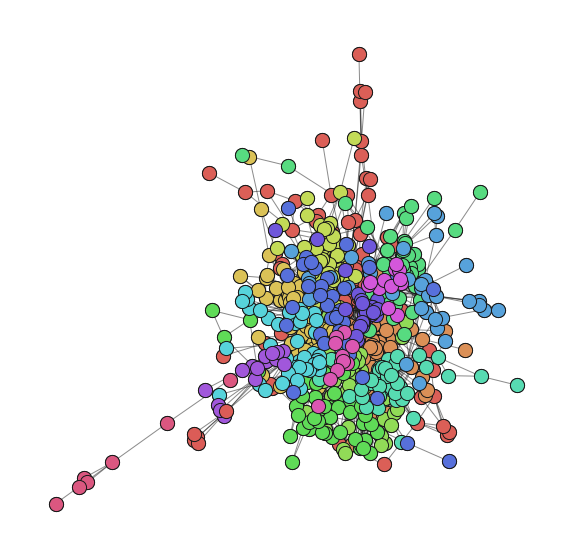

In [156]:
viz.plot_network_clusters(GCCs[0.95], leiden_com, positions[0.95],
                          cmap = sns.color_palette('hls', len(leiden_com.communities), as_cmap=True),
                          figsize=(10, 10));

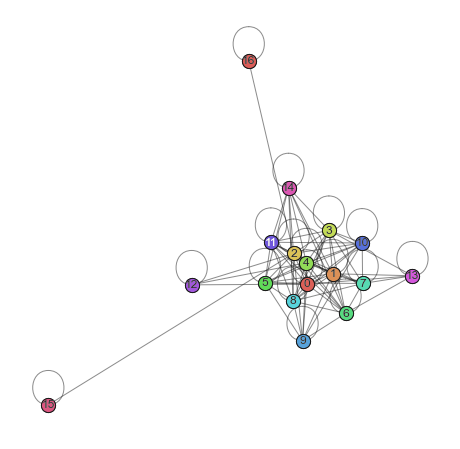

In [157]:
viz.plot_community_graph(GCCs[0.95], leiden_com, cmap = sns.color_palette('hls', len(leiden_com.communities), as_cmap=True), plot_labels=True)

In [158]:
for idx, com in enumerate(leiden_com.communities):
        print(f'{idx:>4} {str(get_top_n_tfidf(com, 5)):<60} {"Chapters: " + str(len(com)):<12}')

   0 ['murphy', 'mac', 'eyes', 'know', 'got']                     Chapters: 98
   1 ['michael', 'charity', 'sanya', 'molly', 'thomas']           Chapters: 85
   2 ['thomas', 'lara', 'molly', 'eyes', 'justine']               Chapters: 82
   3 ['morgan', 'ebenezar', 'council', 'ramirez', 'merlin']       Chapters: 56
   4 ['butters', 'fitz', 'thomas', 'grevane', 'bob']              Chapters: 55
   5 ['maeve', 'billy', 'lily', 'sarissa', 'fix']                 Chapters: 46
   6 ['susan', 'martin', 'lea', 'eyes', 'red']                    Chapters: 46
   7 ['nicodemus', 'ascher', 'binder', 'michael', 'valmont']      Chapters: 46
   8 ['mab', 'ethniu', 'river', 'marcone', 'titan']               Chapters: 41
   9 ['marcone', 'denton', 'tera', 'macfinn', 'gard']             Chapters: 38
  10 ['elaine', 'ghoul', 'anna', 'ghouls', 'aurora']              Chapters: 35
  11 ['bob', 'skull', 'harry', 'spirit', 'trixie']                Chapters: 30
  12 ['stuart', 'mort', 'sir', 'morty', 'ghost']    

I'm noticing like is quite common here again like said was. I suppose in general, it would be good to try and remove any terms that are very frequent across all communities. As if they're that common they probably don't contribute as much towards differentiating each chapter? I'll try count the number of times each word in the top 5 shows up in each community to get an idea of what's happening:

In [159]:
top_5_community_words = []
for com in leiden_com.communities:
    top_5_community_words += tfidf.loc[com].mean().sort_values(ascending=False)[:5].index.to_list()

In [160]:
from collections import Counter

sorted(Counter(top_5_community_words).items(), key=lambda item: item[1], reverse=True)[:5]

[('eyes', 3), ('molly', 3), ('thomas', 3), ('murphy', 2), ('michael', 2)]

eyes is quite interesting, not sure what's going on there. But this is probably good evidence that I should try removing like. Perhaps it'd be good to also look at the actual scores instead of just the top 5

In [161]:
for idx, com in enumerate(leiden_com.communities):
    print(f'{idx:>4} {str(get_top_n_tfidf(com, 5, True)):<100} {"Chapters: " + str(len(com)):<12}')

   0 [['murphy', 0.2], ['mac', 0.05], ['eyes', 0.05], ['know', 0.04], ['got', 0.04]]                      Chapters: 98
   1 [['michael', 0.27], ['charity', 0.09], ['sanya', 0.06], ['molly', 0.06], ['thomas', 0.05]]           Chapters: 85
   2 [['thomas', 0.17], ['lara', 0.15], ['molly', 0.1], ['eyes', 0.05], ['justine', 0.05]]                Chapters: 82
   3 [['morgan', 0.21], ['ebenezar', 0.11], ['council', 0.1], ['ramirez', 0.1], ['merlin', 0.09]]         Chapters: 56
   4 [['butters', 0.32], ['fitz', 0.09], ['thomas', 0.05], ['grevane', 0.05], ['bob', 0.05]]              Chapters: 55
   5 [['maeve', 0.14], ['billy', 0.13], ['lily', 0.11], ['sarissa', 0.09], ['fix', 0.08]]                 Chapters: 46
   6 [['susan', 0.27], ['martin', 0.14], ['lea', 0.07], ['eyes', 0.06], ['red', 0.05]]                    Chapters: 46
   7 [['nicodemus', 0.25], ['ascher', 0.13], ['binder', 0.12], ['michael', 0.09], ['valmont', 0.09]]      Chapters: 46
   8 [['mab', 0.19], ['ethniu', 0.09], ['river',

Looking at the actual average scores raises a few interesting ideas. For the much larger communities they seem to be tied together largely by a single word. For example looking at community 0 and 1. murphy and michael have scores of 0.18 and 0.26. The next highest average score in their respective communities are like at 0.07, and charity at 0.09.

Conversely for the smaller communities, scores seem like they might be a bit more consistent, it's probably worth checking this by comparing descriptive stats for each communities scores.

In [162]:
com_tfidf = []
for idx, com in enumerate(leiden_com.communities):
    com_tfidf.append(np.array(get_top_n_tfidf(com, 5, True))[:,1].astype(float))
com_tfidf_desc = pd.DataFrame(com_tfidf).T.describe()
com_tfidf_desc

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000
mean,0.076000,0.106000,0.104000,0.122000,0.112000,0.110000,0.118000,0.136000,0.094000,0.108000,0.104000,0.142000,0.18800,0.170000,0.178000,0.170000,0.212000
std,0.069498,0.092898,0.055498,0.049699,0.117558,0.025495,0.092033,0.066182,0.055045,0.020494,0.081731,0.179081,0.07328,0.174786,0.182401,0.061237,0.112783
min,0.040000,0.050000,0.050000,0.090000,0.050000,0.080000,0.050000,0.090000,0.060000,0.090000,0.060000,0.050000,0.12000,0.070000,0.070000,0.090000,0.150000
25%,0.040000,0.060000,0.050000,0.100000,0.050000,0.090000,0.060000,0.090000,0.060000,0.090000,0.070000,0.050000,0.14000,0.080000,0.070000,0.150000,0.150000
50%,0.050000,0.060000,0.100000,0.100000,0.050000,0.110000,0.070000,0.120000,0.070000,0.110000,0.070000,0.050000,0.15000,0.090000,0.110000,0.170000,0.150000
75%,0.050000,0.090000,0.150000,0.110000,0.090000,0.130000,0.140000,0.130000,0.090000,0.110000,0.070000,0.100000,0.24000,0.130000,0.140000,0.180000,0.200000
max,0.200000,0.270000,0.170000,0.210000,0.320000,0.140000,0.270000,0.250000,0.190000,0.140000,0.250000,0.460000,0.29000,0.480000,0.500000,0.260000,0.410000


What would be the best representation of what I was observing? Perhaps a large discrepancy between the upper quartile and the max?

In [163]:
com_tfidf_desc.T['max'] - com_tfidf_desc.T['75%']

0     0.15
1     0.18
2     0.02
3     0.10
4     0.23
5     0.01
6     0.13
7     0.12
8     0.10
9     0.03
10    0.18
11    0.36
12    0.05
13    0.35
14    0.36
15    0.08
16    0.21
dtype: float64

Hmm, I suppose rather than just the top chapters having a large discrepancy between the max value and the rest, it's that the majority of communities have quite a sizable difference. Perhaps we can categorize two kinds of community then? Some communities are largely identified by a single word (mostly character) while others are defined by multiple?

Let's simplify things and just look at the top 2 words for each community to get rid of the rest of the noise:

In [164]:
for idx, com in enumerate(leiden_com.communities):
    print(f'{idx:>4} {str(get_top_n_tfidf(com, 2, True)):<40} {"Chapters: " + str(len(com)):<12}')

   0 [['murphy', 0.2], ['mac', 0.05]]         Chapters: 98
   1 [['michael', 0.27], ['charity', 0.09]]   Chapters: 85
   2 [['thomas', 0.17], ['lara', 0.15]]       Chapters: 82
   3 [['morgan', 0.21], ['ebenezar', 0.11]]   Chapters: 56
   4 [['butters', 0.32], ['fitz', 0.09]]      Chapters: 55
   5 [['maeve', 0.14], ['billy', 0.13]]       Chapters: 46
   6 [['susan', 0.27], ['martin', 0.14]]      Chapters: 46
   7 [['nicodemus', 0.25], ['ascher', 0.13]]  Chapters: 46
   8 [['mab', 0.19], ['ethniu', 0.09]]        Chapters: 41
   9 [['marcone', 0.14], ['denton', 0.11]]    Chapters: 38
  10 [['elaine', 0.25], ['ghoul', 0.07]]      Chapters: 35
  11 [['bob', 0.46], ['skull', 0.1]]          Chapters: 30
  12 [['stuart', 0.29], ['mort', 0.24]]       Chapters: 15
  13 [['kincaid', 0.48], ['murphy', 0.13]]    Chapters: 12
  14 [['toot', 0.5], ['pizza', 0.14]]         Chapters: 11
  15 [['mother', 0.26], ['summer', 0.18]]     Chapters: 7 
  16 [['barge', 0.41], ['hunt', 0.2]]         Chapters: 

I do still need to get rid of like, but before that. I think I'll try calculate what book each community belongs to. Once I have characters sorted I'd also like to look at characters, and their affiliations by community too. I suspect that many of these communities will be dominated by a particular faction.

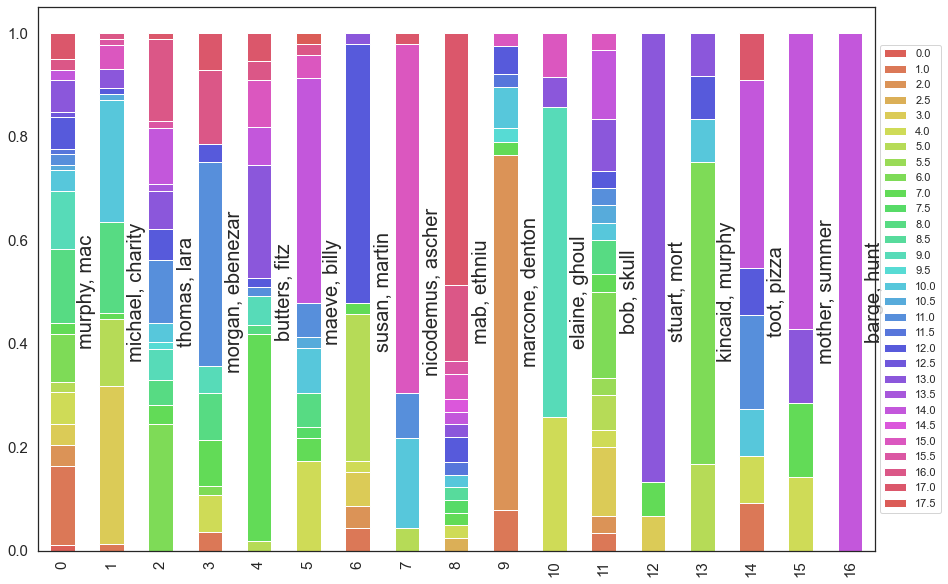

In [165]:
com_book = pd.DataFrame(columns=sorted(set(ch_book)))
for idx, com in enumerate(leiden_com.communities):
    values = (pd.merge(pd.DataFrame(zip(names, ch_book), columns=['Chapter', 'Book']),
                       pd.DataFrame(com, columns=['Chapter']))
             ['Book'].value_counts(normalize=True))
    com_book.loc[idx] = values

ax = com_book.fillna(0).plot.bar(stacked=True, cmap=sns.color_palette('hls', 17, as_cmap=True))
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
for idx, com in enumerate(leiden_com.communities):
    ax.annotate(', '.join(get_top_n_tfidf(com, 2)), fontsize=20,
               xy = (idx+0.5, 0.5),
               xycoords='data',
               rotation=90,
               ha='center',
               va='center')

Now this is quite a colorful mess isn't it? There's probably a better kind of colour map to choose for this, to just show the approximate point of the series a community exists in using a qualitative palette would be better. But it would be difficult to pick out individual books then. This works well enough.

This is actually a really nice way to see where in the series certain characters are particularly prevalent isn't it? Murphy is a consistent sidekick showing up very often. Micheal tends to be very central when he shows up, but he isn't present in all books.

Although some other aspects are lost. for example com 6 billy denton. Billy eventually starts to be called Will, you can see a pretty sharp drop off in representation for the later chapters, likely because he almost entirely stops being called Bill. Denton is actually the antagonist of the book he's introduced in, book 2. And does not come back afterwards, so that would also contribute towards the heavy skew to book 2. I have to assume all representation past book 2 is primarily Billy.

The majority of the top scores makes sense based on my knowledge of the books, as in the two top scoring words. Except for community 11, Kincaid Mac. I can't recall those two characters having much overlap at all throughout the entire series. Every other combo is pretty much instantly intuitive to me. Perhaps they just happen to show up near each other much more than I ever realized?

# Investigating Character

I think I'll also build a proper list of character names, it's become apparent that it'd be both useful and interesting to look at things more explicitly through the lens of different characters. Thinking about what would be interesting, it'd be nice to have a list of not only characters but also their affiliation, to see if anything related to different factions comes up during analysis. I think one of the simplest ways to build such a list would be to extract the information from a site such as [TVTropes](#https://tvtropes.org/pmwiki/pmwiki.php/Characters/TheDresdenFilesHarrysHousehold). This looks particularly useful because it lists not just character names organized by their affiliation, but also some of their primary aliases, which should help with catching the majority of their appearances.

I've got very little experience with web scraping but how hard could it be?

In [166]:
from bs4 import BeautifulSoup
html_path = Path('../datasets/dresden tvtropes character pages/The Dresden Files – Harry\'s Household _ Characters - TV Tropes.html')
with open(html_path) as html_file:
    soup = BeautifulSoup(html_file, 'lxml')

First let's try get the title to affiliate characters with:

In [167]:
soup.find('div', class_='page-Article').h1.text

"\nCharacters / \n        \n        The Dresden Files – Harry's Household\n    \n        \n"

In [168]:
re.search(r'The Dresden Files( –)* (.*?)\n', soup.find('div', class_='page-Article').h1.text).group(2)

"Harry's Household"

Very easy, and how about actual character names:

In [169]:
folder = soup.find('div', class_='folder')

print(folder.h2.text)

Harry Blackstone Copperfield Dresden


In [170]:
for folder in soup.find_all('div', class_='folder'):
    print(folder.h2.text)

Harry Blackstone Copperfield Dresden
Bob the Skull
Mister
Mouse
Margaret "Maggie" Angelica Dresden
The Parasite/Bonea, aka "Bonnie"


It's an almost magical feeling when something just works very easily isn't it?

In [171]:
html_files = Path('../datasets/dresden tvtropes character pages').glob('**/*.html')
characters = []
for html in html_files:
    with open(html) as html:
        soup = BeautifulSoup(html, 'lxml')
    
    affiliation = re.search(r'The Dresden Files( –)* (.*?)\n', soup.find('div', class_='page-Article').h1.text).group(2)
    for folder in soup.find_all('div', class_='folder'):
        try:
            char = folder.h2.text
        except AttributeError: # Will catch folders without a h2. Seems to be the "In general" section
            continue
        characters.append([char, affiliation])

In [172]:
characters_df = pd.DataFrame(characters, columns=['Character', 'Affiliation'])
characters_df = characters_df.sort_values(by = 'Affiliation').reset_index(drop=True)

I'm not actually sure what the best way to generalize names here would be. My first thought was to use regex to try and break them up into all possible identifiers. For example capturing any text that follows aka or is within quotation marks as a nickname. But There are situations where I'm not sure if there's a nice general way to try and fragment them.

For example, "Margaret Gwendolyn McCoy LeFay Dresden" would be best identified as Margaret or Margaret LeFay. Using the full name would miss the majority of matches, and using individual names would get false positives for many characters, e.g. "Harry Blackstone Copperfield Dresden", "Ebenezar McCoy, the Blackstaff", and "Margaret "Maggie" Angelica Dresden".

I could manually account for that by just listing them as "Margaret LeFay" but I'm not sure if it would be possible to come up with a general solution here instead of manual work. Perhaps it would be best to just accept potential mis-classifications? Perhaps just use every individual word that identifies a character and to treat it as a "soft" identification instead of a hard iron-clad identification?

That seems like the best solution to me at the moment, I'll strip punctuation, common words like "The" and then just use every individual word, while dealing with a few particular edge cases that would cause problems (For "He Who Walks Behind", using "He" as an identifier would obviously cause problems. Because of the nature of characters like this they would almost always only be identified by their full name)

I'll output all names before and after since I'm not too sure about this method of dealing with things.

In [173]:
import string

punctuation = [re.escape(string) for string in string.punctuation]
characters_df['cleaned'] = (characters_df['Character']
                            .str.lower()
                            .str.replace('/| and | of ', ' ', regex=True) # Prune and replace with space
                            .str.replace(f'{"|".join(punctuation)}', '', regex=True) # Prune punctuation
                            .str.replace(' aka|the |dr |mr |mrs |ms ', '', regex=True) # Prune misc
                            .str.strip().str.split(' ')) # Strip any leftover leading or trailing whitespace. Then split into a list.

edge_cases = {"He Who Walks Behind" :                                    ['he who walks behind'],
              'He Who Walks Before, aka \"Sharkface\"' :                 ['he who walks before', 'sharkface'],
              "Mab, Queen of Air and Darkness" :                         ['mab', 'queen of air and darkness'],
              'Steven \"Stevie D\" Douglas' :                            ['steven', 'stevie d', 'douglas'],
              '\"Darth Wannabe\"' :                                      ['darth wannabe'],
              'Cardinal Armand Jean de Plessis, 1st Duke of Richelieu' : ['cardinal', 'armand', 'jean de plessis', '1st duke of richelieu'],
              'Strength of a River in His Shoulders' :                   ['strength of a river in his shoulders', 'river shoulders'],
              'Blood on his Soul' :                                      ['blood on his soul'],
              'Heir to House Skavis, known as \"Priscilla\"' :           ['heir to house skavis', 'priscilla']}

for key, value in edge_cases.items():
    characters_df.at[characters_df[characters_df['Character'] == key].index[0], 'cleaned'] = value
with pd.option_context('display.max_rows', 700, 'display.max_columns', 5):
    display(characters_df)

,Character,Affiliation,cleaned
0,"Baron John ""Gentleman Johnny"" Marcone",Chicago Mafia,"[baron, john, gentleman, johnny, marcone]"
1,Wild Card shop owner,Chicago Mafia,"[wild, card, shop, owner]"
2,Halligan,Chicago Mafia,[halligan]
3,Laundromat owner,Chicago Mafia,"[laundromat, owner]"
4,Samuel Fogle,Chicago Mafia,"[samuel, fogle]"
5,James Douglas Harding III,Chicago Mafia,"[james, douglas, harding, iii]"
6,"""Gimpy"" Lawrence",Chicago Mafia,"[gimpy, lawrence]"
7,Tommy Tomm,Chicago Mafia,"[tommy, tomm]"
8,"""Spike""",Chicago Mafia,[spike]
9,Mr. Franklin,Chicago Mafia,[franklin]


Looking over those names, it feels like there's a fair number of problems still. But it's probably good enough for now short of putting in a lot more work to manually fix things up. Let's try building a network using these names as the vocabulary:

In [174]:
character_vocabulary = set(characters_df['cleaned'].values.sum())

In [175]:
tfidf_char = TfidfVectorizer(stop_words=stopwords, strip_accents='unicode', min_df=5, vocabulary = character_vocabulary)
X = tfidf_char.fit_transform(dresden)
doc_token_tfidf = pd.DataFrame(X.toarray(),
    columns=tfidf_char.get_feature_names(),
    index=[{i+1} for i in range(X.shape[0])])

In [176]:
# values = []
# for t in np.arange(0.1, 0.9, 0.01):
#     values.append([t, GCC_size(t, doc_token_tfidf = doc_token_tfidf)[0]])

In [177]:
# df = pd.DataFrame(values, columns=['t', 'GCC size'])
# df['GCC size'] = df['GCC size']/len(doc_token_tfidf.index)

# sns.lineplot(data = df, y = 'GCC size', x = 't');

Pretty neat to see the full span of thresholds like this.

In [178]:
# df.loc[df['GCC size'].sub(0.95).abs().idxmin()]

In [179]:
# c_G = nx.Graph(adj_matrix(0.55, dist_matrix(doc_token_tfidf)))
# c_G = get_GCC(c_G)

# pos = nx.spring_layout(c_G)
# nx.draw_networkx(c_G, pos=pos)

I was on autopilot a bit here, I suppose this is a network of chapters with edges formed by character co-appearances. It could be good to categorize chapters by how prevalent a given character is to each chapter, I might be able to categorize chapters by character affiliation to see if that kind of structure was captured.

# Quick UMAP experiment
I was working on the draft and looking back through emails, and I got a sudden urge to try UMAP on the TFIDF data. Needed to get it out of my system:

In [180]:
import umap

In [181]:
umapper = umap.UMAP()
umapping = umapper.fit_transform(tfidf)
df_umap = pd.DataFrame(umapping, index = tfidf.index)

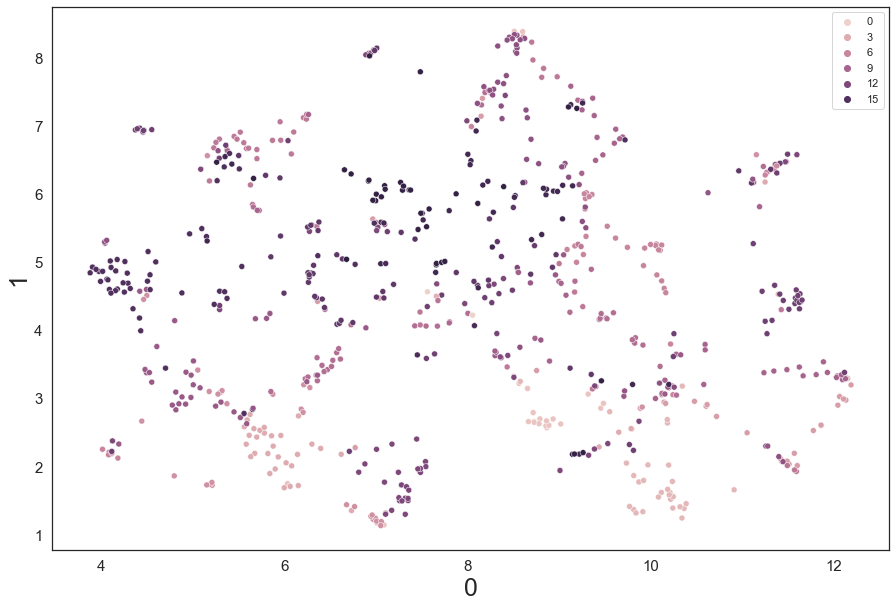

In [182]:
sns.scatterplot(data = df_umap, x = 0, y = 1, hue=ch_book);

ok happy to get that out of my system, certainly looks like there could be some logical clustering here but things are quite noisy

# Misc
Susbet used for vectorization example in presentation

In [183]:
from itertools import compress
from sklearn.feature_extraction.text import CountVectorizer
example_data = list(compress(dresden, [ch == 6 for ch in ch_book]))[0][:1126].split("\n\n")[1:]

In [186]:
counter = CountVectorizer()
counts = counter.fit_transform(example_data)
print(pd.DataFrame(counts.toarray(), columns = counter.get_feature_names(),
                   index=[f'Paragraph {i+1}' for i in range(4)]).T.head(10).T.to_latex())

\begin{tabular}{lrrrrrrrrrr}
\toprule
{} &  abandoned &  about &  aching &  already &  an &  and &  another &  arms &  around &  as \\
\midrule
Paragraph 1 &          0 &      0 &       0 &        0 &   0 &    1 &        0 &     0 &       0 &   0 \\
Paragraph 2 &          1 &      0 &       0 &        0 &   0 &    3 &        0 &     0 &       1 &   1 \\
Paragraph 3 &          0 &      1 &       1 &        0 &   1 &    2 &        1 &     1 &       0 &   0 \\
Paragraph 4 &          0 &      0 &       0 &        1 &   0 &    4 &        0 &     0 &       1 &   1 \\
\bottomrule
\end{tabular}



In [187]:
example_tfidf = TfidfVectorizer()
example_tfidfs = example_tfidf.fit_transform(example_data)
example_tfidf_df = pd.DataFrame(example_tfidfs.toarray(), columns = example_tfidf.get_feature_names(), index=[f'Paragraph {i+1}' for i in range(4)])
print(example_tfidf_df.T.head(10).T.round(3).to_latex())

\begin{tabular}{lrrrrrrrrrr}
\toprule
{} &  abandoned &  about &  aching &  already &     an &    and &  another &   arms &  around &     as \\
\midrule
Paragraph 1 &      0.000 &  0.000 &   0.000 &    0.000 &  0.000 &  0.203 &    0.000 &  0.000 &   0.000 &  0.000 \\
Paragraph 2 &      0.132 &  0.000 &   0.000 &    0.000 &  0.000 &  0.206 &    0.000 &  0.000 &   0.104 &  0.104 \\
Paragraph 3 &      0.000 &  0.132 &   0.132 &    0.000 &  0.132 &  0.138 &    0.132 &  0.132 &   0.000 &  0.000 \\
Paragraph 4 &      0.000 &  0.000 &   0.000 &    0.105 &  0.000 &  0.218 &    0.000 &  0.000 &   0.083 &  0.083 \\
\bottomrule
\end{tabular}



In [188]:
print(pd.DataFrame(pairwise_distances(example_tfidf_df, metric = 'cosine'), index=example_tfidf_df.index, columns = example_tfidf_df.index).round(2).to_latex())

\begin{tabular}{lrrrr}
\toprule
{} &  Paragraph 1 &  Paragraph 2 &  Paragraph 3 &  Paragraph 4 \\
\midrule
Paragraph 1 &         0.00 &         0.74 &         0.87 &         0.89 \\
Paragraph 2 &         0.74 &         0.00 &         0.79 &         0.78 \\
Paragraph 3 &         0.87 &         0.79 &         0.00 &         0.81 \\
Paragraph 4 &         0.89 &         0.78 &         0.81 &         0.00 \\
\bottomrule
\end{tabular}



In [189]:
example_adj = pairwise_distances(example_tfidf_df, metric = 'cosine') < 0.8
np.fill_diagonal(example_adj, 0)
example_adj

array([[False,  True, False, False],
       [ True, False,  True,  True],
       [False,  True, False, False],
       [False,  True, False, False]])

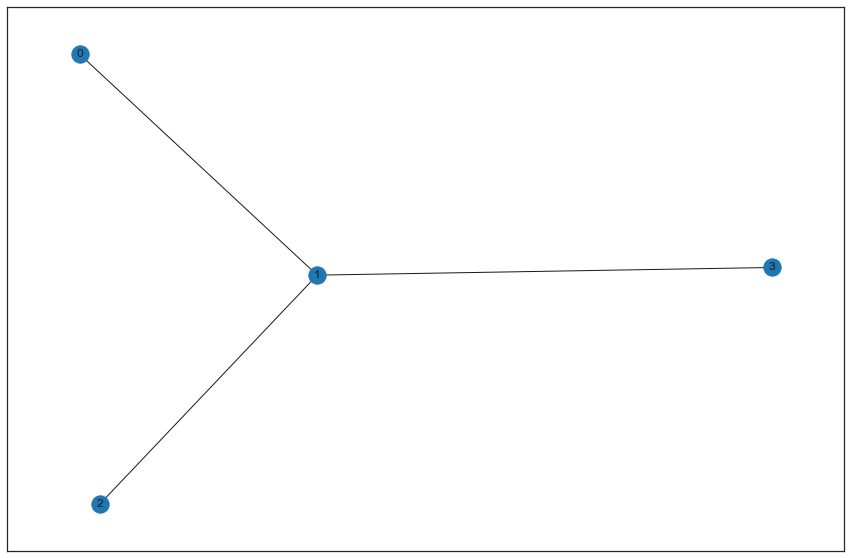

In [190]:
nx.draw_networkx(nx.Graph(example_adj))

In [191]:
nx.write_gexf(nx.Graph(example_adj), graph_output_folder / Path(f'presentation example.gexf'))